# Final Project Submission

* Student name: Peder Norr
* Student pace: full time
* Scheduled project review date/time: 
* Instructor name: James Irving
* Blog post URL:

## TABLE OF CONTENTS 

*Click to jump to matching Markdown Header.*<br><br>
 
- **[Introduction](#INTRODUCTION)<br>**
- **[OBTAIN](#OBTAIN)**<br>
- **[MODEL](#MODEL)**<br>
- **[iNTERPRET](#iNTERPRET)**<br>
- **[Conclusions/Recommendations](#CONCLUSIONS-&-RECOMMENDATIONS)<br>**
___

# INTRODUCTION

As the climate crisis continues to grow in severity, more and more countries and utilities are turning towards renewable energy sources as sustainable alternatives to traditional fossil fuel based sources. Chief among these are solar and wind energy. However, these two sources are known as variable renewable energies (VREs), as they are dependent on several variables like the weather. Because of this, integrating VRE sources into a power grid can be difficult due to ever changing levels of output. However, accurate generation forecasts can assuage this issue, and help utilities improve electricity allocation to more efficiently harness VREs.  This project contains analyses of renewable energy generation data in order to provide European countries and utilities a tool which would allow them to make more accurate energy generation forecasts, and thus better harness the power of renewable energy sources. 

## Business Problem



European countries and utilities want to be able to better utilize VREs and more efficiently integrate them into their power grids. However, they need to be able to more accurately forecast VRE generation in order to improve electricity scheduling and allocation. This project will conduct time series analyses and build a forecasting tool that will help EU countries to better forecast VRE generation and enable the more efficient usage of renewable energy.

# OBTAIN

The data used in these analyses come from the European Network of Transmission System Operators for Electricity (ENTSOE) [Transparency Platform](https://transparency.entsoe.eu/dashboard/show). ENTSOE represents 42 electricity transmission system operators from across Europe. It promotes closer cooperation among Europe's TSOs to achieve the EU's energy and climate policy objectives. One of its main objective centers on the integration of renewable energy sources  into the continent's power system. 

In order to reduce computation requirements, this project will focus on the top 5 producers of variable renewable energy in the EU: Germany, Italy, France, Spain, and the Netherlands. The data sets used below are time series from June 2021 to July 2021, containing 720 entries of the hourly production of wind and solar energy (in megawatts) in the respective country.

In [47]:
#Import necessary packages

import pandas as pd
import numpy as np
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

import missingno as missingno

%matplotlib inline

import statsmodels.tsa.api as tsa
import statsmodels
from statsmodels.tsa.stattools import adfuller
from statsmodels.tsa.seasonal import seasonal_decompose

import pmdarima as pmd

#!pip install entsoe-py
from entsoe import EntsoePandasClient

import json

In [48]:
#Set pandas and seaborn options

pd.set_option('display.max_columns',0)
plt.style.use('seaborn-notebook')
pd.set_option('display.float_format', lambda x: '%.4f' % x)

In [49]:
#Create function to acquire API key

def get_keys(path):
    with open(path) as f:
        return json.load(f)

In [50]:
#Create ENTSOE API key variable

keys = get_keys("/Users/norrp/.secret/entsoe_api.json")

entsoe_api_key = keys['api_key']

# MODEL

## Data Modeling
Describe and justify the process for analyzing or modeling the data.

***
Questions to consider:
* How did you analyze or model the data?
* How did you iterate on your initial approach to make it better?
* Why are these choices appropriate given the data and the business problem?
***

## Germany

### SCRUB/EXPLORE

In [51]:
#Create function to retrieve country energy production data from the ENTOSE API

def get_energy_df(country_code):
    client = EntsoePandasClient(api_key=entsoe_api_key)
    start = pd.Timestamp('20210601', tz='Europe/Brussels')
    end = pd.Timestamp('20210701', tz='Europe/Brussels')
    df = client.query_generation(country_code, start=start,end=end, psr_type=None)
    return df

In [52]:
#Get data set for Germany

germany_df = get_energy_df('GR')
germany_df.head()

,Fossil Brown coal/Lignite,Fossil Gas,Fossil Oil,Hydro Pumped Storage,Hydro Water Reservoir,Solar,Wind Onshore
2021-06-01 01:00:00+03:00,535.0000,1408.0000,0.0000,0.0000,46.0000,0.0000,1008.0000
2021-06-01 02:00:00+03:00,414.0000,1307.0000,0.0000,0.0000,74.0000,0.0000,1049.0000
2021-06-01 03:00:00+03:00,368.0000,1164.0000,0.0000,0.0000,73.0000,0.0000,1104.0000
2021-06-01 04:00:00+03:00,367.0000,1072.0000,0.0000,0.0000,70.0000,0.0000,1157.0000
2021-06-01 05:00:00+03:00,368.0000,1271.0000,0.0000,0.0000,92.0000,0.0000,1006.0000


In [53]:
germany_df.tail()

,Fossil Brown coal/Lignite,Fossil Gas,Fossil Oil,Hydro Pumped Storage,Hydro Water Reservoir,Solar,Wind Onshore
2021-06-30 20:00:00+03:00,867.0000,3802.0000,0.0000,232.0000,1293.0000,0.0000,383.0000
2021-06-30 21:00:00+03:00,870.0000,3716.0000,0.0000,232.0000,1524.0000,0.0000,420.0000
2021-06-30 22:00:00+03:00,861.0000,3558.0000,0.0000,223.0000,1393.0000,0.0000,469.0000
2021-06-30 23:00:00+03:00,879.0000,3738.0000,0.0000,102.0000,1041.0000,0.0000,460.0000
2021-07-01 00:00:00+03:00,944.0000,3987.0000,0.0000,0.0000,235.0000,0.0000,485.0000


In [54]:
germany_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 720 entries, 2021-06-01 01:00:00+03:00 to 2021-07-01 00:00:00+03:00
Freq: 60T
Data columns (total 7 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Fossil Brown coal/Lignite  720 non-null    float64
 1   Fossil Gas                 720 non-null    float64
 2   Fossil Oil                 720 non-null    float64
 3   Hydro Pumped Storage       720 non-null    float64
 4   Hydro Water Reservoir      720 non-null    float64
 5   Solar                      720 non-null    float64
 6   Wind Onshore               720 non-null    float64
dtypes: float64(7)
memory usage: 45.0 KB


In [55]:
#Drop unnecessary columns
germany_df = germany_df[['Solar', 'Wind Onshore']]
germany_df.head()

,Solar,Wind Onshore
2021-06-01 01:00:00+03:00,0.0000,1008.0000
2021-06-01 02:00:00+03:00,0.0000,1049.0000
2021-06-01 03:00:00+03:00,0.0000,1104.0000
2021-06-01 04:00:00+03:00,0.0000,1157.0000
2021-06-01 05:00:00+03:00,0.0000,1006.0000


In [56]:
germany_df.columns

Index(['Solar', 'Wind Onshore'], dtype='object')

In [57]:
#Create function to check for null values

#Original source https://github.com/flatiron-school/Online-DS-FT-022221-Cohort-Notes/blob/master/Phase_3/topic_30_ensemble_methods/topic_30_ensemble_methods-SG.ipynb

def check_nulls(df):
    missingno.matrix(df)
    plt.show()
    null_check = pd.DataFrame({
        '#null':df.isna().sum(),
        '%null':round(df.isna().sum()/len(df)*100,2)
    })
    return null_check

In [58]:
germany_df.isna().sum()

Solar           0
Wind Onshore    0
dtype: int64

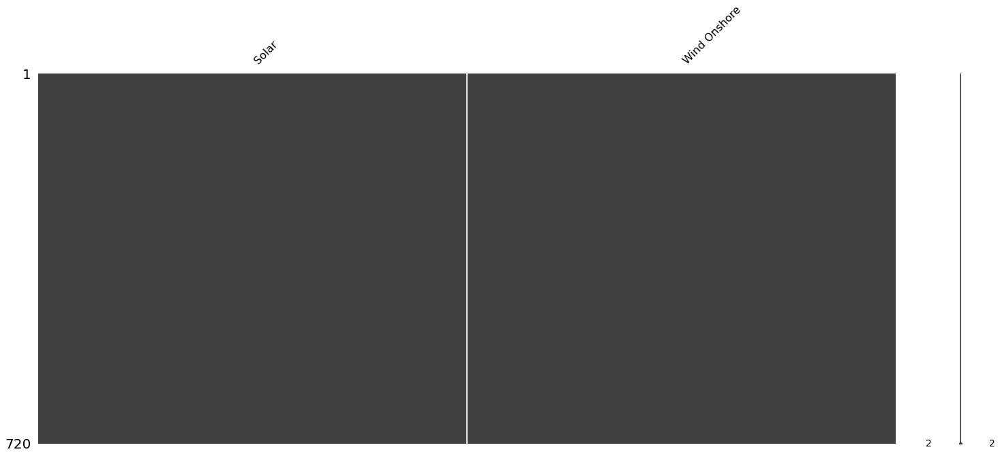

,#null,%null
Solar,0,0.0000
Wind Onshore,0,0.0000


In [59]:
#Check for null values

check_nulls(germany_df)

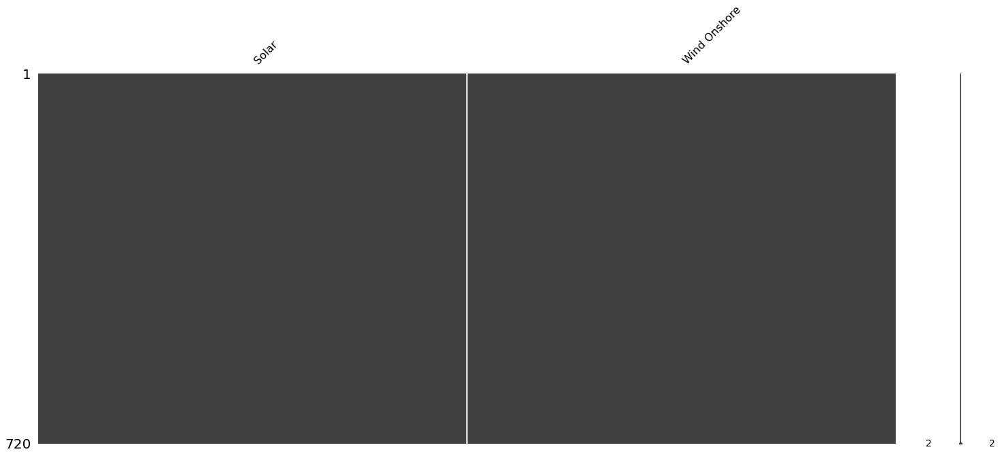

,#null,%null
Solar,0,0.0000
Wind Onshore,0,0.0000


In [60]:
#Fill nulls
germany_df.interpolate(inplace=True)
check_nulls(germany_df)

In [61]:
#Double check index is in date time
germany_df.index

DatetimeIndex(['2021-06-01 01:00:00+03:00', '2021-06-01 02:00:00+03:00',
               '2021-06-01 03:00:00+03:00', '2021-06-01 04:00:00+03:00',
               '2021-06-01 05:00:00+03:00', '2021-06-01 06:00:00+03:00',
               '2021-06-01 07:00:00+03:00', '2021-06-01 08:00:00+03:00',
               '2021-06-01 09:00:00+03:00', '2021-06-01 10:00:00+03:00',
               ...
               '2021-06-30 15:00:00+03:00', '2021-06-30 16:00:00+03:00',
               '2021-06-30 17:00:00+03:00', '2021-06-30 18:00:00+03:00',
               '2021-06-30 19:00:00+03:00', '2021-06-30 20:00:00+03:00',
               '2021-06-30 21:00:00+03:00', '2021-06-30 22:00:00+03:00',
               '2021-06-30 23:00:00+03:00', '2021-07-01 00:00:00+03:00'],
              dtype='datetime64[ns, Europe/Athens]', length=720, freq='60T')

In [62]:
#freq = None so resample timeseries as hourly
germany_df = germany_df.resample('H').asfreq()
germany_df.index

DatetimeIndex(['2021-06-01 01:00:00+03:00', '2021-06-01 02:00:00+03:00',
               '2021-06-01 03:00:00+03:00', '2021-06-01 04:00:00+03:00',
               '2021-06-01 05:00:00+03:00', '2021-06-01 06:00:00+03:00',
               '2021-06-01 07:00:00+03:00', '2021-06-01 08:00:00+03:00',
               '2021-06-01 09:00:00+03:00', '2021-06-01 10:00:00+03:00',
               ...
               '2021-06-30 15:00:00+03:00', '2021-06-30 16:00:00+03:00',
               '2021-06-30 17:00:00+03:00', '2021-06-30 18:00:00+03:00',
               '2021-06-30 19:00:00+03:00', '2021-06-30 20:00:00+03:00',
               '2021-06-30 21:00:00+03:00', '2021-06-30 22:00:00+03:00',
               '2021-06-30 23:00:00+03:00', '2021-07-01 00:00:00+03:00'],
              dtype='datetime64[ns, Europe/Athens]', length=720, freq='H')

<AxesSubplot:>

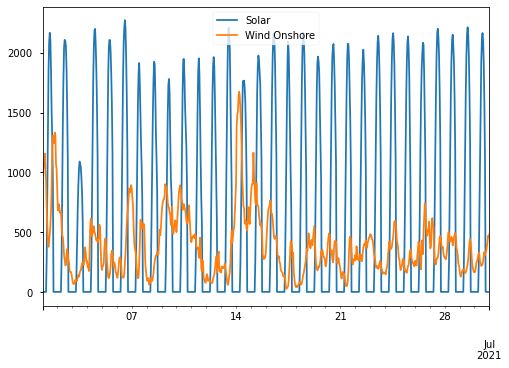

In [63]:
germany_df.plot()

In [64]:
# Save cleaned dataset as CSV file
germany_df.to_csv('data/cleaned_movie_data.csv')

### Solar Modeling

<AxesSubplot:>

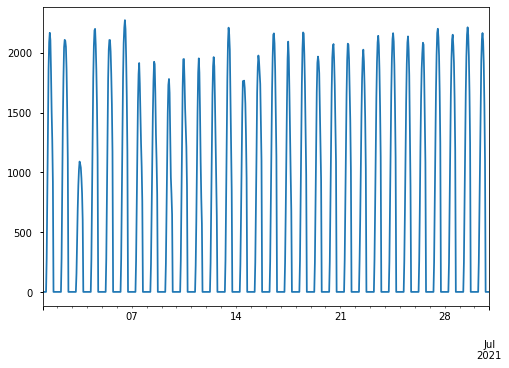

In [194]:
solar_ts = germany_df['Solar']
solar_ts.plot()

In [66]:
#Create function to create train test split
def train_test_split(ts):
    
    tts_cutoff = round(len(ts)*0.80)
    display(tts_cutoff)

    ## Use the tts cutoff to do Train test split and plot
    train = ts.iloc[:tts_cutoff]
    test = ts.iloc[tts_cutoff:]
    
    return train, test

In [67]:
train, test = train_test_split(solar_ts)

576

In [68]:
#Create function to plot train test split for the time series
def plot_train_test_split(train, test):
    
    ## Plot
    ax = train.plot(label='train')
    test.plot(label='test')
    ax.legend()
    
    return ax

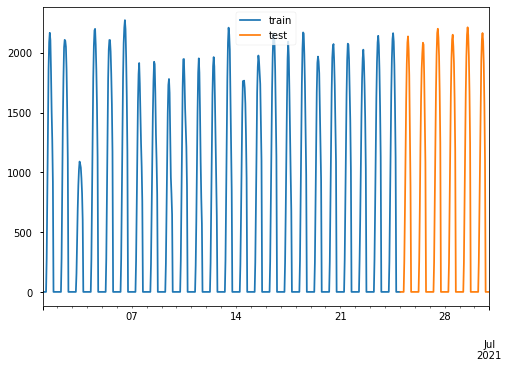

In [69]:
plot_train_test_split(train, test);

In [70]:
#Create Dickey Fuller Test test function
def adfuller_test_df(ts,index=['AD Fuller Results']):
    
    """Adapted from https://github.com/flatiron-school/Online-DS-FT-022221-Cohort-Notes/blob/master/Phase_4/topic_38_time_series_models/ts_functions.py
    Returns the AD Fuller Test Results and p-values for the null hypothesis
    that there the data is non-stationary (that there is a unit root in the data)"""
    
    df_res = tsa.stattools.adfuller(ts)

    names = ['Test Statistic','p-value','#Lags Used','# of Observations Used']
    res  = dict(zip(names,df_res[:4]))
    
    res['p<.05'] = res['p-value']<.05
    res['Stationary?'] = res['p<.05']
    
    if isinstance(index,str):
        index = [index]
    res_df = pd.DataFrame(res,index=index)
    res_df = res_df[['Test Statistic','#Lags Used',
                     '# of Observations Used','p-value','p<.05',
                    'Stationary?']]
    return res_df

In [71]:
#Create Stationarity evaluation function
def stationarity_check(TS,window=4,plot=True,index=['AD Fuller Results']):
    """Adapted from https://github.com/learn-co-curriculum/dsc-removing-trends-lab/tree/solution"""
    
    # Calculate rolling statistics
    roll_mean = TS.rolling(window=window, center=False).mean()
    roll_std = TS.rolling(window=window, center=False).std()
    
    # Perform the Dickey Fuller Test
    dftest = adfuller_test_df(TS,index=index)
    
    if plot:
        
        ## Building in contingency if not a series with a freq
        try: 
            freq = TS.index.freq
        except:
            freq = 'N/A'
            
        # Plot rolling statistics:
        fig = plt.figure(figsize=(12,6))
        plt.plot(TS, color='blue',label=f'Original (freq={freq}')
        plt.plot(roll_mean, color='red', label=f'Rolling Mean (window={window})')
        plt.plot(roll_std, color='black', label = f'Rolling Std (window={window})')
        plt.legend(loc='best')
        plt.title('Rolling Mean & Standard Deviation')
        display(dftest)
        plt.show(block=False)
        
    return dftest

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-4.5697,19,556,0.0001,True,True


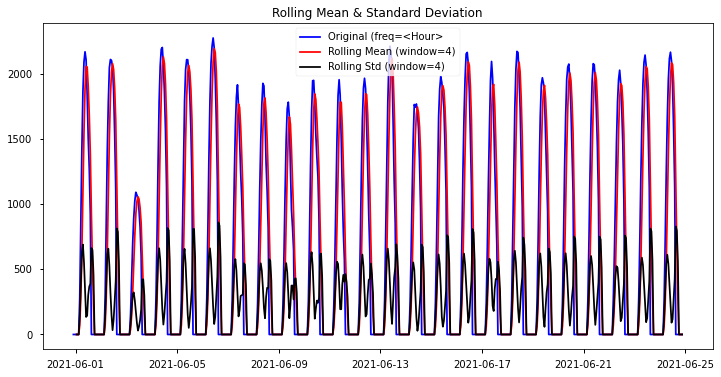

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-4.5697,19,556,0.0001,True,True


In [72]:
#Check time series for stationarity
stationarity_check(train)

From the low p value, we can determine that the time series is stationary

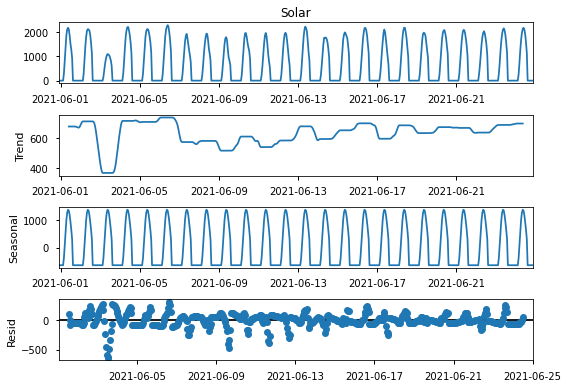

In [73]:
#Create seasonal decomposition of time series to check for seasonality
decompose = tsa.seasonal_decompose(train)
decompose.plot();

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[4] intercept   : AIC=9331.709, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[4] intercept   : AIC=8158.684, Time=0.12 sec
 ARIMA(0,0,1)(0,0,1)[4] intercept   : AIC=8459.744, Time=0.38 sec
 ARIMA(0,0,0)(0,0,0)[4]             : AIC=9613.891, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[4] intercept   : AIC=8157.978, Time=0.07 sec
 ARIMA(1,0,0)(0,0,1)[4] intercept   : AIC=8152.015, Time=0.31 sec
 ARIMA(1,0,0)(1,0,1)[4] intercept   : AIC=8142.118, Time=0.52 sec
 ARIMA(1,0,0)(2,0,1)[4] intercept   : AIC=8053.511, Time=0.74 sec
 ARIMA(1,0,0)(2,0,0)[4] intercept   : AIC=8064.694, Time=0.67 sec
 ARIMA(1,0,0)(2,0,2)[4] intercept   : AIC=8016.036, Time=0.86 sec
 ARIMA(1,0,0)(1,0,2)[4] intercept   : AIC=8030.566, Time=0.52 sec
 ARIMA(0,0,0)(2,0,2)[4] intercept   : AIC=8743.851, Time=0.72 sec
 ARIMA(2,0,0)(2,0,2)[4] intercept   : AIC=inf, Time=1.31 sec
 ARIMA(1,0,1)(2,0,2)[4] intercept   : AIC=7917.841, Time=1.06 sec
 ARIMA(1,0,1)(1,0,2)[4] intercept   : 

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                                 y   No. Observations:                  576
Model:             SARIMAX(2, 0, 1)x(2, 0, 1, 4)   Log Likelihood               -3815.430
Date:                           Wed, 21 Jul 2021   AIC                           7646.859
Time:                                   16:21:17   BIC                           7681.708
Sample:                                        0   HQIC                          7660.450
                                           - 576                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     89.0721      7.989     11.149      0.000      73.414     104.730
ar.L1          1.9024      0.021     90.218      0.000       1.861       1.944
ar.L2         -0.9695      0.019    -50.388      0.000      -1.007      -0.932
ma.L1         -0.8544      0.031    -27.730      0.000      -0.915      -0.794
ar.S.L4       -0.6533      0.117     -5.582      0.000      -0.883      -0.424
ar.S.L8       -0.4423      0.068     -6.513      0.000      -0.575      -0.309
ma.S.L4        0.4995      0.123      4.066      0.000       0.259       0.740
sigma2      3.284e+04   1971.424     16.660      0.000     2.9e+04    3.67e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.17   Jarque-Bera (JB):               385.27
Prob(Q):                              0.68   Prob(JB):                         0.00
Heteroskedasticity (H):               0.92   Skew:                            -1.15
Prob(H) (two-sided):                  0.54   Kurtosis:                         6.28
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



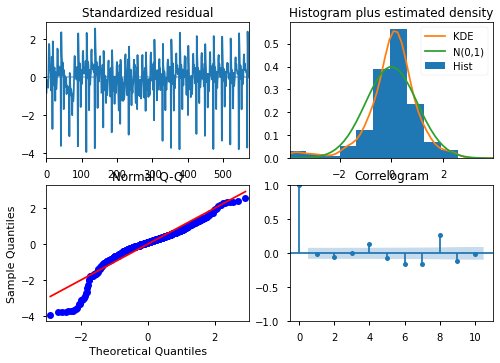

In [74]:
#Create first ARIMA model using auto arima to gridsearch for parameters
model = pmd.auto_arima(train, start_p=0, start_P=0, start_q=0, start_Q=0, m=4, trace=True)
display(model.summary())
model.plot_diagnostics();

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning:

Non-invertible starting seasonal moving average Using zeros as starting parameters.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                             Solar   No. Observations:                  576
Model:             SARIMAX(2, 0, 1)x(2, 0, 1, 4)   Log Likelihood               -3820.777
Date:                           Wed, 21 Jul 2021   AIC                           7655.554
Time:                                   16:21:19   BIC                           7686.046
Sample:                               06-01-2021   HQIC                          7667.446
                                    - 06-25-2021                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.8224      0.034     53.172      0.000       1.755       1.890
ar.L2         -0.9055      0.027    -33.436      0.000      -0.959      -0.852
ma.L1         -0.4424      0.059     -7.482      0.000      -0.558      -0.327
ar.S.L4        0.7196      0.091      7.931      0.000       0.542       0.897
ar.S.L8        0.2804      0.090      3.106      0.002       0.103       0.457
ma.S.L4       -0.9957      0.056    -17.659      0.000      -1.106      -0.885
sigma2      3.976e+04   8.52e-07   4.67e+10      0.000    3.98e+04    3.98e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):               133.18
Prob(Q):                              0.80   Prob(JB):                         0.00
Heteroskedasticity (H):               0.97   Skew:                            -0.12
Prob(H) (two-sided):                  0.82   Kurtosis:                         5.34
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 1.64e+26. Standard errors may be unstable.
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



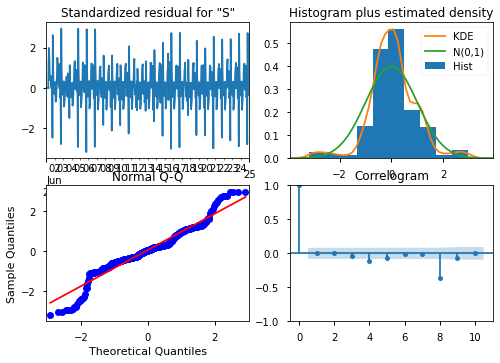

In [75]:
#Create SARIMAX model using determined parameters
sarimax_model = tsa.SARIMAX(train, order=model.order, seasonal_order=model.seasonal_order, enforce_stationarity=True).fit()
display(sarimax_model.summary())
sarimax_model.plot_diagnostics();

In [76]:
#Create function to retrieve forecast and create data frame

def retrieve_forecast(model, steps):
    
    forecast = model.get_forecast(steps=len(test))
    forecast_df = forecast.conf_int()
    forecast_df.columns = ['Lower CI','Upper CI']
    forecast_df['Forecast'] = forecast.predicted_mean
    
    return forecast_df

In [77]:
forecast_df = retrieve_forecast(sarimax_model, steps=len(test))
forecast_df

,Lower CI,Upper CI,Forecast
2021-06-25 01:00:00+03:00,-316.3048,466.6663,75.1808
2021-06-25 02:00:00+03:00,-627.0074,707.3383,40.1655
2021-06-25 03:00:00+03:00,-665.1622,1170.1274,252.4826
2021-06-25 04:00:00+03:00,-637.8686,1621.6402,491.8858
2021-06-25 05:00:00+03:00,-551.9106,1938.5292,693.3093
...,...,...,...
2021-06-30 20:00:00+03:00,-1001.2280,2303.3804,651.0762
2021-06-30 21:00:00+03:00,-979.2575,2325.3521,673.0473
2021-06-30 22:00:00+03:00,-1090.8619,2213.7522,561.4451
2021-06-30 23:00:00+03:00,-1045.5722,2259.0423,606.7351


In [78]:
#Create function to plot training data and forecast

def plot_train_test_forecast(train, test, forecast_df):
    ### Plot training data, test data, and forecast (with upper/,lower ci) 
    fig,ax = plt.subplots(figsize=(10,6))


    # Plotting Training and test data
    train.plot(label='Training Data')
    test.plot(label='Test Data')

    ## Plotting Forefcast and CI
    forecast = forecast_df['Forecast']
    LowerCI = forecast_df['Lower CI']
    UpperCI = forecast_df['Upper CI']
    forecast.plot(ax=ax,label='Forecast')
    ax.fill_between(forecast_df.index,
                        LowerCI, 
                        UpperCI,color='g',alpha=0.3)

    ax.set(ylabel='Value')
    ax.legend()
    
    return fig, ax

(<Figure size 720x432 with 1 Axes>, <AxesSubplot:ylabel='Value'>)

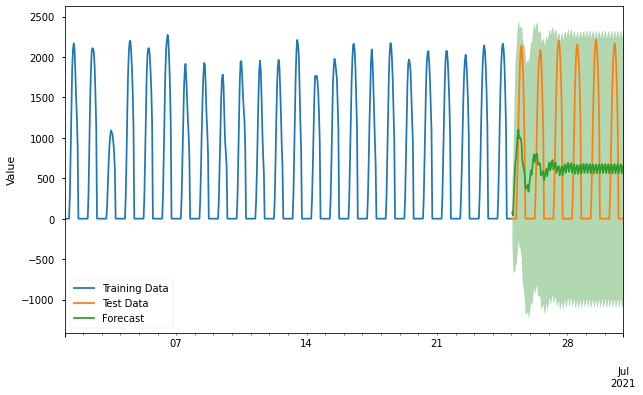

In [79]:
plot_train_test_forecast(train, test, forecast_df)

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:1009: UserWarning:

Non-invertible starting seasonal moving average Using zeros as starting parameters.



<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                             Solar   No. Observations:                  720
Model:             SARIMAX(2, 0, 1)x(2, 0, 1, 4)   Log Likelihood               -4796.822
Date:                           Wed, 21 Jul 2021   AIC                           9607.643
Time:                                   16:21:21   BIC                           9639.698
Sample:                               06-01-2021   HQIC                          9620.018
                                    - 07-01-2021                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.8540      0.031     59.879      0.000       1.793       1.915
ar.L2         -0.9333      0.027    -34.525      0.000      -0.986      -0.880
ma.L1         -0.5746      0.060     -9.619      0.000      -0.692      -0.458
ar.S.L4        0.6796      0.013     50.643      0.000       0.653       0.706
ar.S.L8        0.3204      0.013     23.732      0.000       0.294       0.347
ma.S.L4       -0.9925      0.037    -26.796      0.000      -1.065      -0.920
sigma2      4.386e+04   4.94e-07   8.89e+10      0.000    4.39e+04    4.39e+04
===================================================================================
Ljung-Box (L1) (Q):                   5.43   Jarque-Bera (JB):               117.07
Prob(Q):                              0.02   Prob(JB):                         0.00
Heteroskedasticity (H):               1.21   Skew:                            -0.33
Prob(H) (two-sided):                  0.14   Kurtosis:                         4.86
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
[2] Covariance matrix is singular or near-singular, with condition number 2.57e+26. Standard errors may be unstable.
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



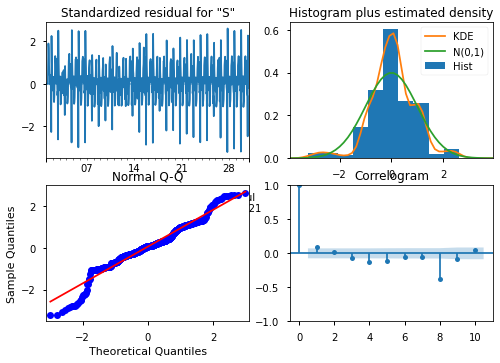

In [80]:
#Create and train SARIMAX model on the full time series
sarimax_model_full = tsa.SARIMAX(solar_ts, order=model.order,seasonal_order=model.seasonal_order,
                            enforce_stationarity=True).fit()
display(sarimax_model_full.summary())
sarimax_model_full.plot_diagnostics();

In [81]:
#Retrieve forecast for the next three days
forecast_df = retrieve_forecast(sarimax_model_full, steps=72)
forecast_df

,Lower CI,Upper CI,Forecast
2021-07-01 01:00:00+03:00,-340.1618,481.2558,70.5470
2021-07-01 02:00:00+03:00,-645.9149,687.9296,21.0074
2021-07-01 03:00:00+03:00,-645.2001,1136.8644,245.8322
2021-07-01 04:00:00+03:00,-577.7890,1576.3751,499.2930
2021-07-01 05:00:00+03:00,-445.2986,1883.4446,719.0730
...,...,...,...
2021-07-06 20:00:00+03:00,-988.0923,2350.6209,681.2643
2021-07-06 21:00:00+03:00,-964.9694,2373.7511,704.3909
2021-07-06 22:00:00+03:00,-1082.2429,2256.4807,587.1189
2021-07-06 23:00:00+03:00,-1032.0114,2306.7111,637.3499


In [82]:
#Create function to plot whole time series data and forecast

def plot_time_series_forecast(ts, forecast_df, save=True):
    ### Plot training data, test data, and forecast (with upper/,lower ci) 
    fig,ax = plt.subplots(figsize=(10,6))


    # Plotting time series data
    ts.plot(label='Training Data')
    ax.axvline(ts.index[-1],ls=':')

    ## Plotting Forefcast and CI
    forecast = forecast_df['Forecast']
    LowerCI = forecast_df['Lower CI']
    UpperCI = forecast_df['Upper CI']
    forecast.plot(ax=ax,label='Forecast')
    ax.fill_between(forecast_df.index,
                        LowerCI, 
                        UpperCI,color='g',alpha=0.3)

    ax.set(ylabel='Value')
    ax.legend()
    
    ax.set_title(f'{ts.name} Forecast')
    
    if save:
        file_name = f'images/{ts.name}_forecast.png'
        fig.savefig(file_name, dpi=300)
        print(f'Figure save as {file_name}')
    
    return fig, ax

Figure save as images/Solar_forecast.png


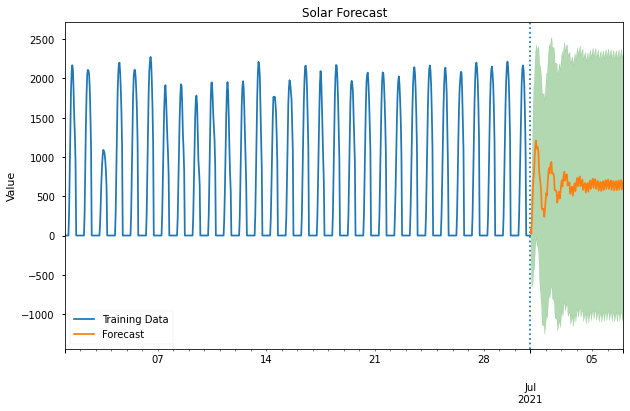

In [83]:
fig, ax = plot_time_series_forecast(solar_ts, forecast_df)

### Sktime

In [84]:
from sktime.forecasting.all import *
from sktime.forecasting.compose import *
from sktime.forecasting.model_selection import ForecastingGridSearchCV
from sklearn.ensemble import RandomForestRegressor

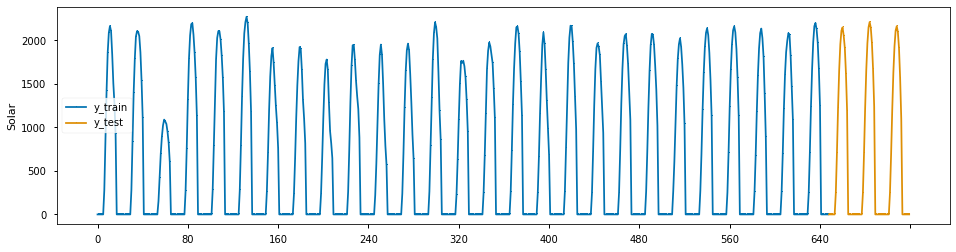

In [195]:
y = solar_ts.reset_index(drop=True)

y_train, y_test = temporal_train_test_split(y, test_size=72)
forecast_horizon = np.arange(y_test.shape[0]) + 1

plot_series(y_train, y_test, labels=["y_train", "y_test"], markers=[",", ","])
plt.show()

1.4658319806237232

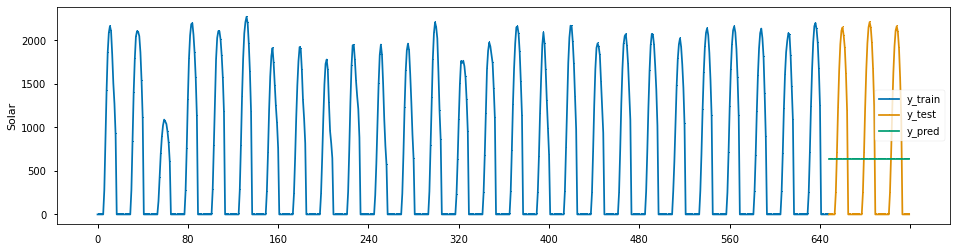

In [86]:
forecaster = NaiveForecaster(strategy="mean")
forecaster.fit(y_train)
y_pred = forecaster.predict(forecast_horizon)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='Solar'>)

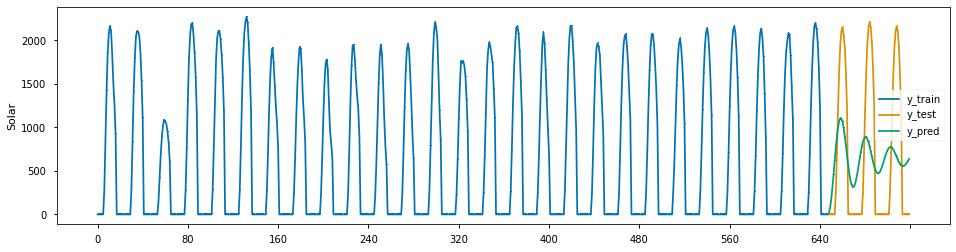

In [87]:
forecaster = AutoARIMA(suppress_warnings=True)
forecaster.fit(y_train)
y_pred = forecaster.predict(fh=forecast_horizon)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])


(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='Solar'>)

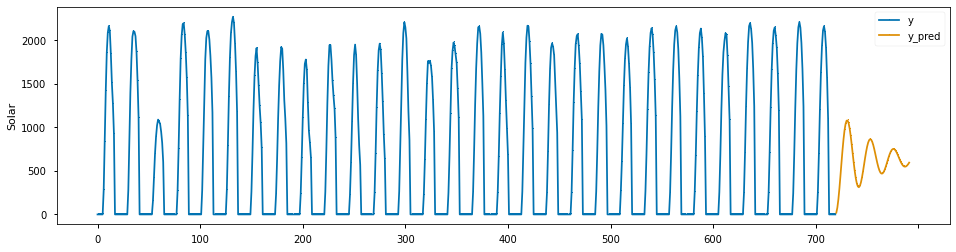

In [88]:
forecaster = AutoARIMA(suppress_warnings=True)
forecaster.fit(y)
y_pred = forecaster.predict(fh=forecast_horizon)
plot_series(y, y_pred, labels=["y", "y_pred"], markers=[",", ","])

0.014971122742321005

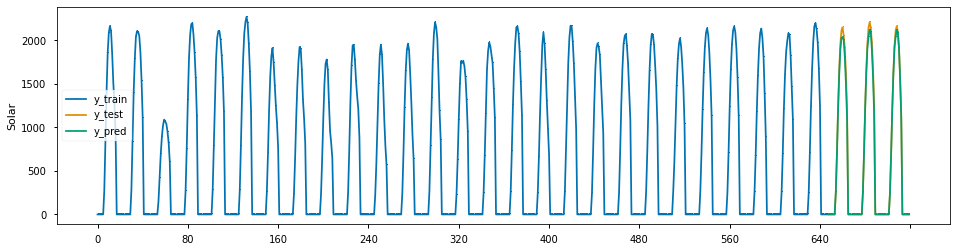

In [89]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

0.5045230625928574

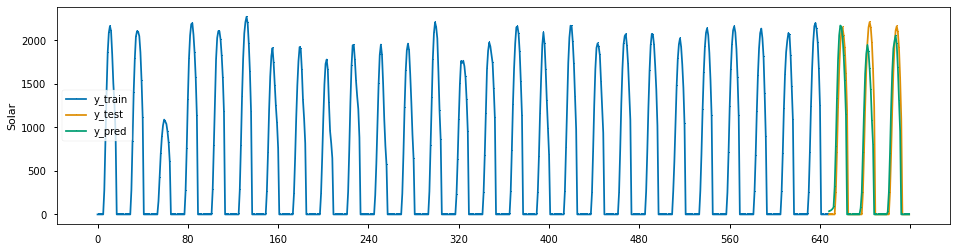

In [90]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
param_grid = {"window_length": [1, 5, 7]}

cv = SlidingWindowSplitter()
gscv = ForecastingGridSearchCV(forecaster, cv=cv, param_grid=param_grid)
gscv.fit(y_train, fh=forecast_horizon)
y_pred = gscv.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

In [91]:
gscv.best_params_

{'window_length': 7}

(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='Solar'>)

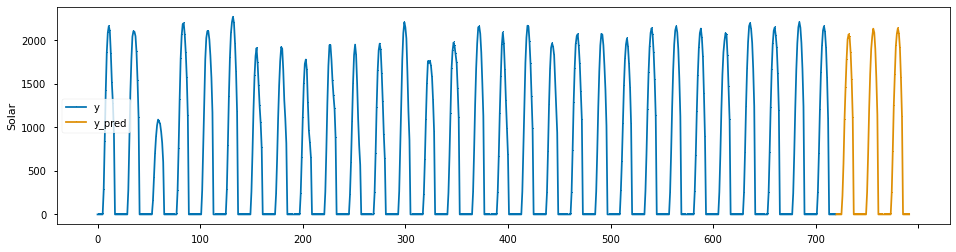

In [92]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y, y_pred, labels=["y", "y_pred"], markers=[",", ","])

### Wind Modeling

<AxesSubplot:>

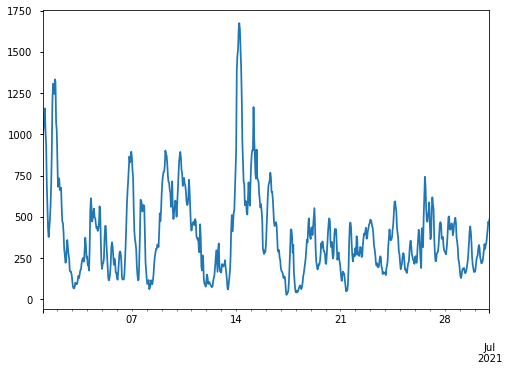

In [191]:
wind_ts = germany_df['Wind Onshore']
wind_ts.plot()

In [94]:
train, test = train_test_split(wind_ts)

576

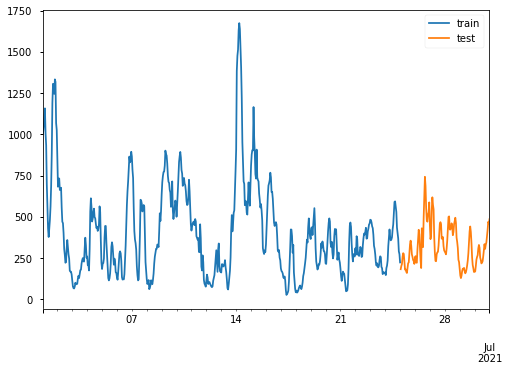

In [95]:
plot_train_test_split(train, test);

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-4.3683,6,569,0.0003,True,True


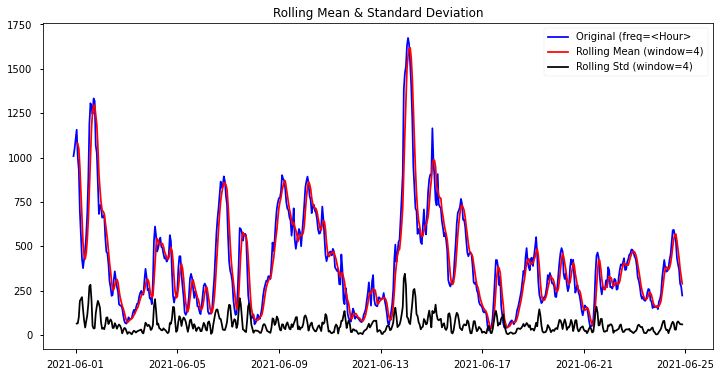

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-4.3683,6,569,0.0003,True,True


In [96]:
#Check time series for stationarity
stationarity_check(train)

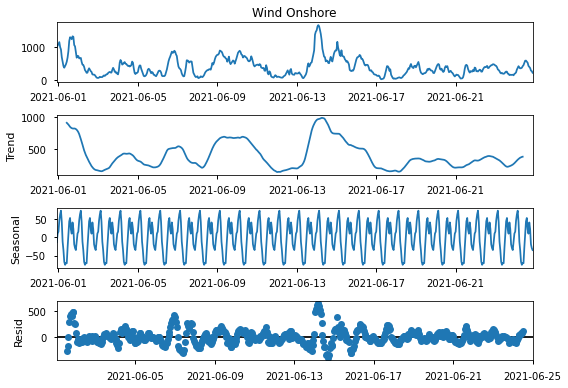

In [97]:
#Create seasonal decomposition of time series to check for seasonality
decompose = tsa.seasonal_decompose(train)
decompose.plot();

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=8152.737, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=6531.478, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=7346.647, Time=0.67 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=8785.745, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=6544.796, Time=0.07 sec
 ARIMA(1,0,0)(2,0,0)[7] intercept   : AIC=6531.731, Time=1.22 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=6530.622, Time=0.51 sec
 ARIMA(1,0,0)(0,0,1)[7] intercept   : AIC=6529.951, Time=0.22 sec
 ARIMA(1,0,0)(0,0,2)[7] intercept   : AIC=6531.194, Time=0.84 sec
 ARIMA(1,0,0)(1,0,2)[7] intercept   : AIC=6528.053, Time=1.16 sec
 ARIMA(1,0,0)(2,0,2)[7] intercept   : AIC=6532.623, Time=1.70 sec
 ARIMA(1,0,0)(2,0,1)[7] intercept   : AIC=6531.369, Time=1.48 sec
 ARIMA(0,0,0)(1,0,2)[7] intercept   : AIC=7982.212, Time=0.61 sec
 ARIMA(2,0,0)(1,0,2)[7] intercept   : AIC=6414.425, Time=0.57 sec
 ARIMA(2,0,0)(0,0,2)[7] intercept

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                                  y   No. Observations:                  576
Model:             SARIMAX(3, 0, 2)x(1, 0, [], 7)   Log Likelihood               -3192.306
Date:                            Wed, 21 Jul 2021   AIC                           6400.611
Time:                                    16:27:02   BIC                           6435.460
Sample:                                         0   HQIC                          6414.202
                                            - 576                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     21.5770      6.929      3.114      0.002       7.997      35.157
ar.L1          0.9621      0.143      6.718      0.000       0.681       1.243
ar.L2          0.4427      0.165      2.675      0.007       0.118       0.767
ar.L3         -0.4543      0.065     -6.946      0.000      -0.582      -0.326
ma.L1          0.4513      0.149      3.019      0.003       0.158       0.744
ma.L2         -0.3207      0.086     -3.730      0.000      -0.489      -0.152
ar.S.L7       -0.0811      0.048     -1.689      0.091      -0.175       0.013
sigma2      3796.2808    157.239     24.143      0.000    3488.099    4104.463
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               680.41
Prob(Q):                              1.00   Prob(JB):                         0.00
Heteroskedasticity (H):               0.49   Skew:                             0.45
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.25
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



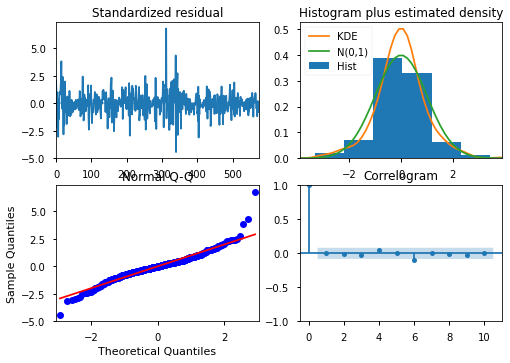

In [98]:
#Create first ARIMA model using auto arima to gridsearch for parameters
model = pmd.auto_arima(train, start_p=0, start_P=0, start_q=0, start_Q=0, m=7, trace=True)
display(model.summary())
model.plot_diagnostics();

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                       Wind Onshore   No. Observations:                  576
Model:             SARIMAX(3, 0, 2)x(1, 0, [], 7)   Log Likelihood               -3201.074
Date:                            Wed, 21 Jul 2021   AIC                           6416.148
Time:                                    16:27:03   BIC                           6446.641
Sample:                                06-01-2021   HQIC                          6428.040
                                     - 06-25-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8226      0.152      5.394      0.000       0.524       1.122
ar.L2          0.5777      0.139      4.163      0.000       0.306       0.850
ar.L3         -0.4169      0.070     -5.946      0.000      -0.554      -0.280
ma.L1          0.6188      0.163      3.802      0.000       0.300       0.938
ma.L2         -0.2183      0.114     -1.914      0.056      -0.442       0.005
ar.S.L7       -0.1078      0.045     -2.380      0.017      -0.197      -0.019
sigma2      3909.7505    164.439     23.776      0.000    3587.455    4232.046
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):               568.59
Prob(Q):                              0.86   Prob(JB):                         0.00
Heteroskedasticity (H):               0.48   Skew:                             0.14
Prob(H) (two-sided):                  0.00   Kurtosis:                         7.86
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



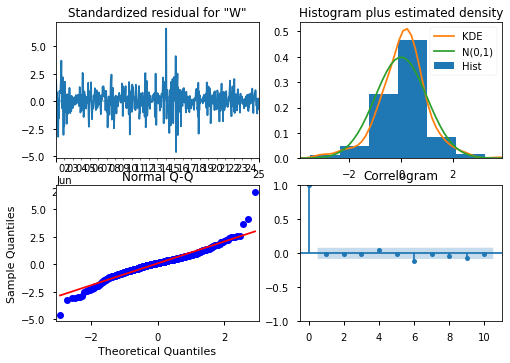

In [99]:
#Create SARIMAX model using determined parameters
sarimax_model = tsa.SARIMAX(train, order=model.order, seasonal_order=model.seasonal_order, enforce_stationarity=True).fit()
display(sarimax_model.summary())
sarimax_model.plot_diagnostics();

In [100]:
forecast_df = retrieve_forecast(sarimax_model, steps=len(test))
forecast_df

,Lower CI,Upper CI,Forecast
2021-06-25 01:00:00+03:00,73.2720,318.3772,195.8246
2021-06-25 02:00:00+03:00,-21.7629,408.2411,193.2391
2021-06-25 03:00:00+03:00,-104.2233,468.7844,182.2806
2021-06-25 04:00:00+03:00,-174.3992,532.2110,178.9059
2021-06-25 05:00:00+03:00,-230.2520,587.5100,178.6290
...,...,...,...
2021-06-30 20:00:00+03:00,-989.1826,1005.5772,8.1973
2021-06-30 21:00:00+03:00,-989.4058,1005.4268,8.0105
2021-06-30 22:00:00+03:00,-989.6231,1005.2790,7.8280
2021-06-30 23:00:00+03:00,-989.8346,1005.1339,7.6496


(<Figure size 720x432 with 1 Axes>, <AxesSubplot:ylabel='Value'>)

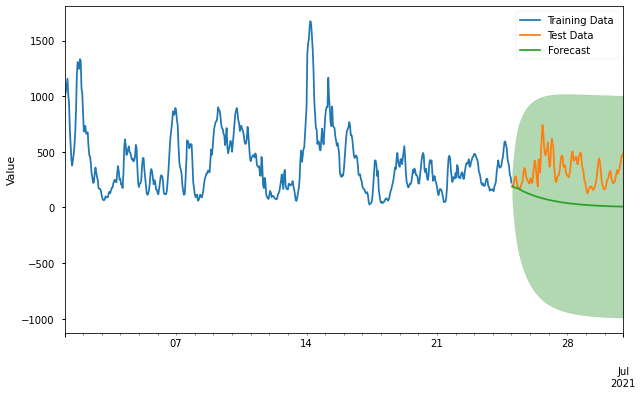

In [101]:
plot_train_test_forecast(train, test, forecast_df)

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                       Wind Onshore   No. Observations:                  720
Model:             SARIMAX(3, 0, 2)x(1, 0, [], 7)   Log Likelihood               -3975.944
Date:                            Wed, 21 Jul 2021   AIC                           7965.888
Time:                                    16:27:04   BIC                           7997.943
Sample:                                06-01-2021   HQIC                          7978.263
                                     - 07-01-2021                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6840      0.132      5.171      0.000       0.425       0.943
ar.L2          0.6423      0.106      6.070      0.000       0.435       0.850
ar.L3         -0.3449      0.063     -5.474      0.000      -0.468      -0.221
ma.L1          0.7680      0.139      5.514      0.000       0.495       1.041
ma.L2         -0.1033      0.103     -1.006      0.314      -0.305       0.098
ar.S.L7       -0.0934      0.035     -2.676      0.007      -0.162      -0.025
sigma2      3641.2147    116.131     31.354      0.000    3413.602    3868.827
===================================================================================
Ljung-Box (L1) (Q):                   0.04   Jarque-Bera (JB):               900.72
Prob(Q):                              0.84   Prob(JB):                         0.00
Heteroskedasticity (H):               0.55   Skew:                             0.24
Prob(H) (two-sided):                  0.00   Kurtosis:                         8.46
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



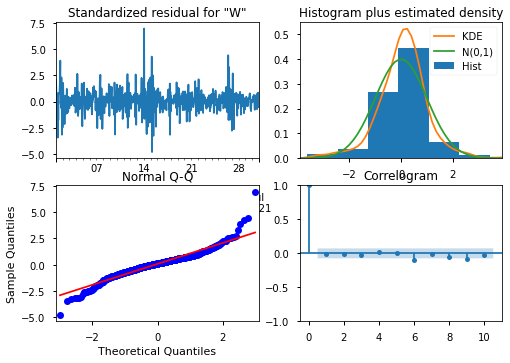

In [102]:
#Create and train SARIMAX model on the full time series
sarimax_model_full = tsa.SARIMAX(wind_ts, order=model.order,seasonal_order=model.seasonal_order,
                            enforce_stationarity=True).fit()
display(sarimax_model_full.summary())
sarimax_model_full.plot_diagnostics();

In [103]:
#Retrieve forecast for the next three days
forecast_df = retrieve_forecast(sarimax_model_full, steps=72)
forecast_df

,Lower CI,Upper CI,Forecast
2021-07-01 01:00:00+03:00,381.5921,618.1302,499.8612
2021-07-01 02:00:00+03:00,278.4139,695.4368,486.9254
2021-07-01 03:00:00+03:00,206.7555,759.2430,482.9993
2021-07-01 04:00:00+03:00,128.7087,803.1893,465.9490
2021-07-01 05:00:00+03:00,69.0848,842.7212,455.9030
...,...,...,...
2021-07-06 20:00:00+03:00,-931.8152,992.9403,30.5625
2021-07-06 21:00:00+03:00,-932.4899,992.4090,29.9595
2021-07-06 22:00:00+03:00,-933.1499,991.8867,29.3684
2021-07-06 23:00:00+03:00,-933.7955,991.3734,28.7889


Figure save as images/Wind Onshore_forecast.png


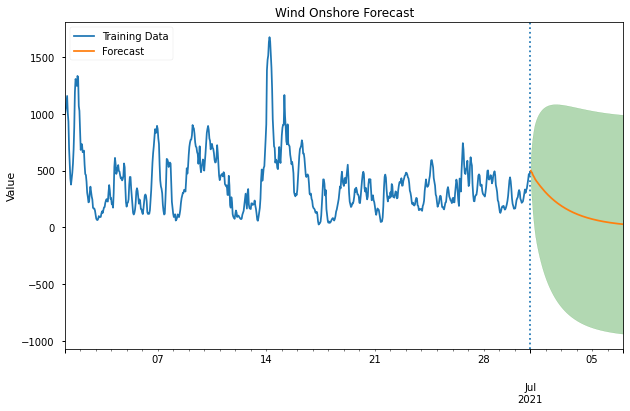

In [104]:
fig, ax = plot_time_series_forecast(wind_ts, forecast_df)

### Sktime

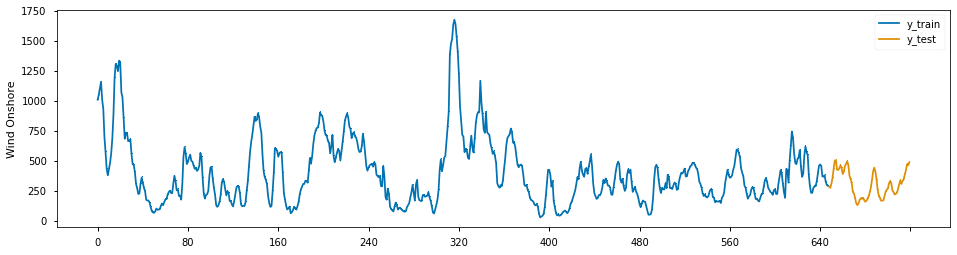

In [192]:
y = wind_ts.reset_index(drop=True)

y_train, y_test = temporal_train_test_split(y, test_size=72)
forecast_horizon = np.arange(y_test.shape[0]) + 1

plot_series(y_train, y_test, labels=["y_train", "y_test"], markers=[",", ","])
plt.show()

0.3864426744904458

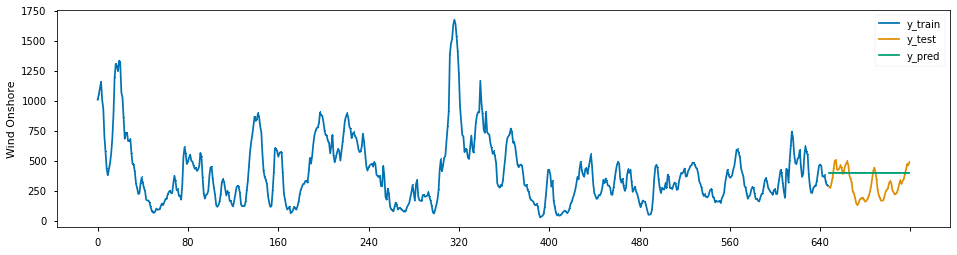

In [106]:
forecaster = NaiveForecaster(strategy="mean")
forecaster.fit(y_train)
y_pred = forecaster.predict(forecast_horizon)
plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

0.2929892794072599

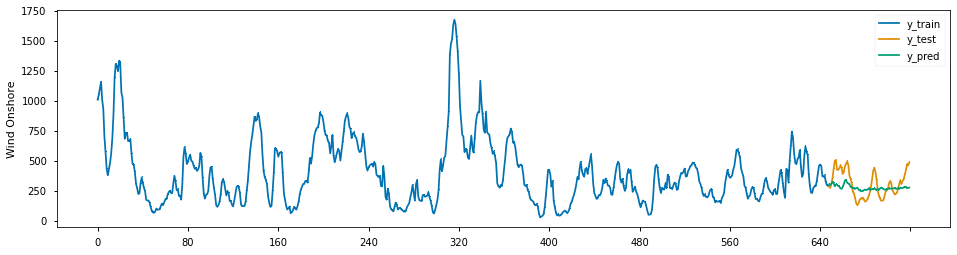

In [107]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

0.3031428174480353

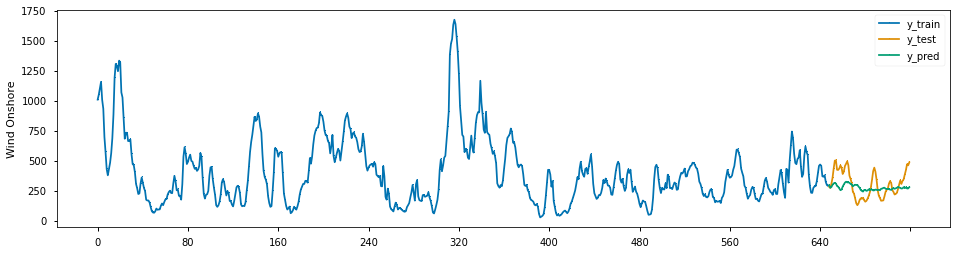

In [108]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
param_grid = {"window_length": [1, 5, 7]}

cv = SlidingWindowSplitter()
gscv = ForecastingGridSearchCV(forecaster, cv=cv, param_grid=param_grid)
gscv.fit(y_train, fh=forecast_horizon)
y_pred = gscv.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

In [109]:
gscv.best_params_

{'window_length': 7}

(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='Wind Onshore'>)

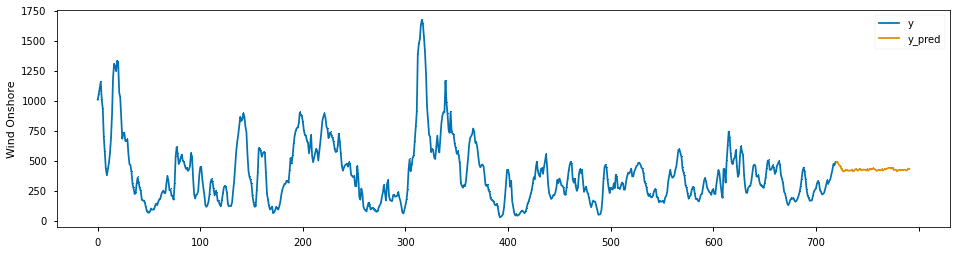

In [193]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator, window_length=10)
forecaster.fit(y, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y, y_pred, labels=["y", "y_pred"], markers=[",", ","])

0.47950564697116604

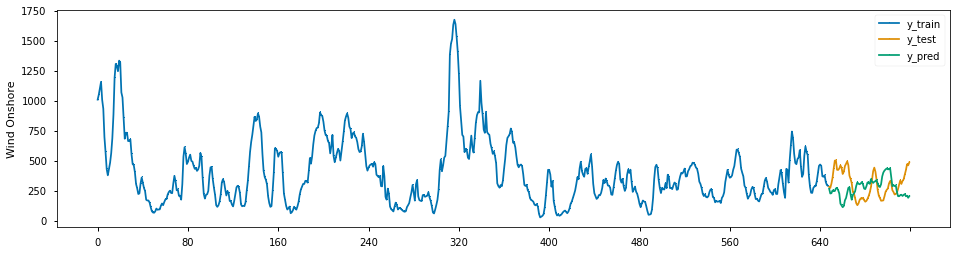

In [112]:
from xgboost import XGBRegressor

estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

0.4922767125819287

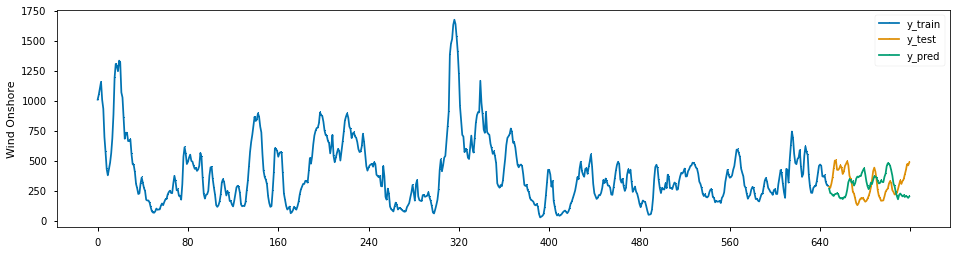

In [113]:
estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
param_grid = {"window_length": [1, 5, 7]}

cv = SlidingWindowSplitter()
gscv = ForecastingGridSearchCV(forecaster, cv=cv, param_grid=param_grid)
gscv.fit(y_train, fh=forecast_horizon)
y_pred = gscv.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

In [114]:
gscv.best_params_

{'window_length': 7}

(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='Wind Onshore'>)

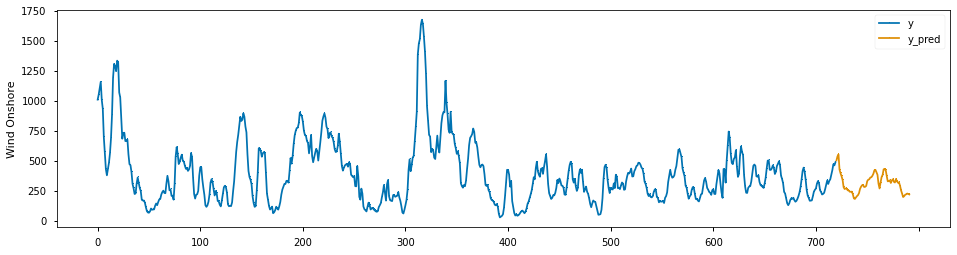

In [115]:
estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator, window_length=7)
forecaster.fit(y, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y, y_pred, labels=["y", "y_pred"], markers=[",", ","])

## France

### SCRUB/EXPLORE

In [116]:
#Get data set for France
france_df = get_energy_df('FR')
france_df.head()

Biomass  ...      Wind Onshore
                          Actual Aggregated  ... Actual Aggregated
2021-06-01 00:00:00+02:00          311.0000  ...         4627.0000
2021-06-01 01:00:00+02:00          319.0000  ...         4706.0000
2021-06-01 02:00:00+02:00          321.0000  ...         4620.0000
2021-06-01 03:00:00+02:00          332.0000  ...         4666.0000
2021-06-01 04:00:00+02:00          330.0000  ...         4730.0000

[5 rows x 13 columns]

In [117]:
france_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 720 entries, 2021-06-01 00:00:00+02:00 to 2021-06-30 23:00:00+02:00
Freq: H
Data columns (total 13 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   (Biomass, Actual Aggregated)                          720 non-null    float64
 1   (Fossil Gas, Actual Aggregated)                       720 non-null    float64
 2   (Fossil Hard coal, Actual Aggregated)                 687 non-null    float64
 3   (Fossil Hard coal, Actual Consumption)                33 non-null     float64
 4   (Fossil Oil, Actual Aggregated)                       720 non-null    float64
 5   (Hydro Pumped Storage, Actual Aggregated)             425 non-null    float64
 6   (Hydro Pumped Storage, Actual Consumption)            295 non-null    float64
 7   (Hydro Run-of-river and poundage, Actual Aggregated)  720 non-null    float64
 8   (Hy

In [118]:
#Drop unnecessary columns
cols = [0,1,2,3,4,5,6,7,8,9,11]
france_df.drop(france_df.columns[cols],axis=1,inplace=True)
france_df.head()

,Solar,Wind Onshore
,Actual Aggregated,Actual Aggregated
2021-06-01 00:00:00+02:00,0.0000,4627.0000
2021-06-01 01:00:00+02:00,0.0000,4706.0000
2021-06-01 02:00:00+02:00,0.0000,4620.0000
2021-06-01 03:00:00+02:00,0.0000,4666.0000
2021-06-01 04:00:00+02:00,0.0000,4730.0000


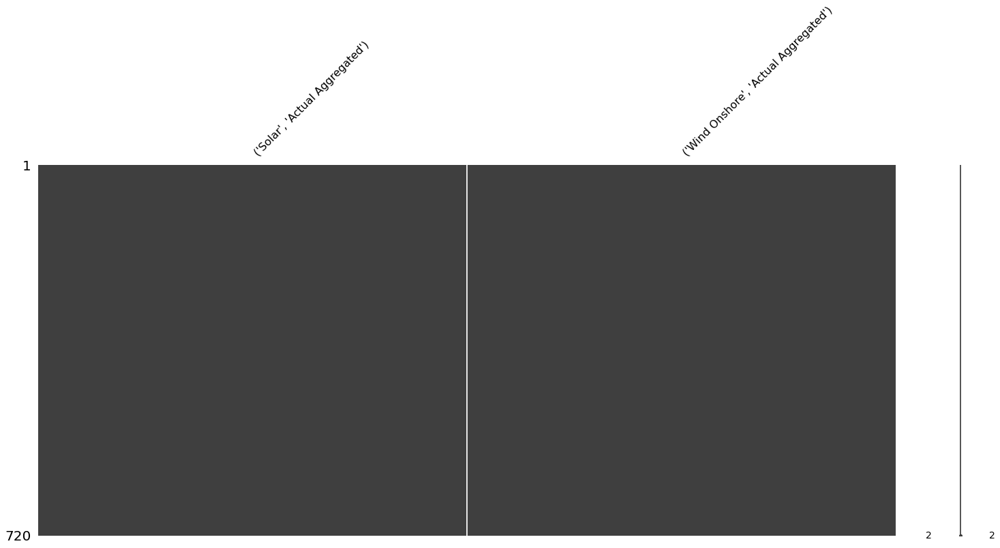

,,#null,%null
Solar,Actual Aggregated,0,0.0000
Wind Onshore,Actual Aggregated,0,0.0000


In [119]:
check_nulls(france_df)

In [120]:
france_df.index

DatetimeIndex(['2021-06-01 00:00:00+02:00', '2021-06-01 01:00:00+02:00',
               '2021-06-01 02:00:00+02:00', '2021-06-01 03:00:00+02:00',
               '2021-06-01 04:00:00+02:00', '2021-06-01 05:00:00+02:00',
               '2021-06-01 06:00:00+02:00', '2021-06-01 07:00:00+02:00',
               '2021-06-01 08:00:00+02:00', '2021-06-01 09:00:00+02:00',
               ...
               '2021-06-30 14:00:00+02:00', '2021-06-30 15:00:00+02:00',
               '2021-06-30 16:00:00+02:00', '2021-06-30 17:00:00+02:00',
               '2021-06-30 18:00:00+02:00', '2021-06-30 19:00:00+02:00',
               '2021-06-30 20:00:00+02:00', '2021-06-30 21:00:00+02:00',
               '2021-06-30 22:00:00+02:00', '2021-06-30 23:00:00+02:00'],
              dtype='datetime64[ns, Europe/Paris]', length=720, freq='H')

<AxesSubplot:>

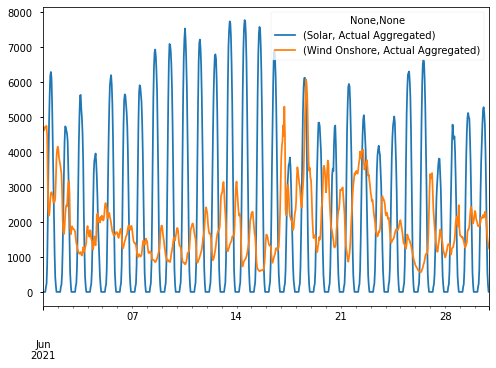

In [121]:
france_df.plot()

### Solar Modeling

<AxesSubplot:>

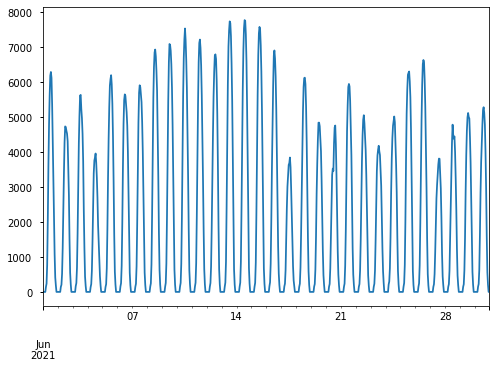

In [188]:
solar_ts = france_df['Solar']['Actual Aggregated']
solar_ts.plot()

In [123]:
train, test = train_test_split(solar_ts)

576

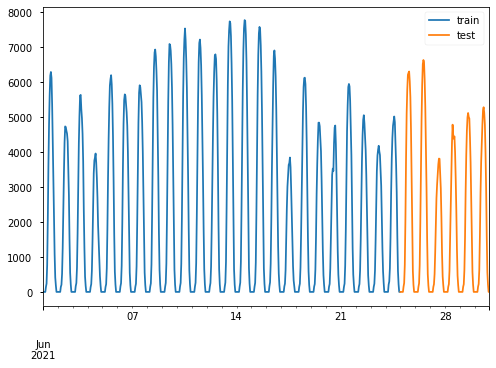

In [124]:
plot_train_test_split(train, test);

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-1.7536,19,556,0.4037,False,False


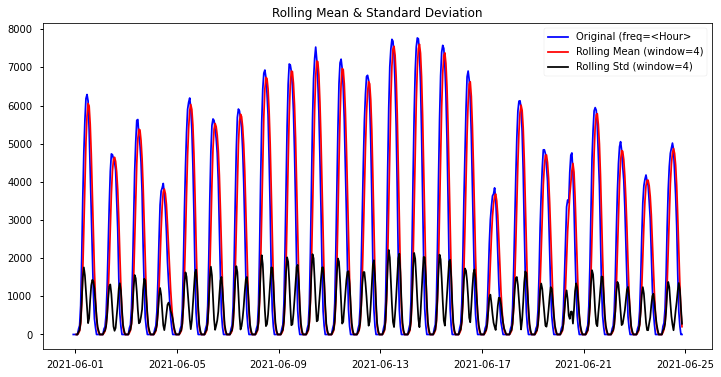

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-1.7536,19,556,0.4037,False,False


In [125]:
#Check time series for stationarity
stationarity_check(train)

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-16.9040,19,555,0.0000,True,True


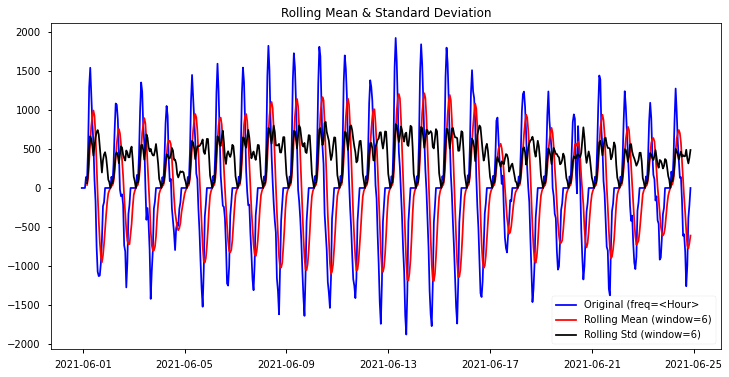

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-16.9040,19,555,0.0000,True,True


In [126]:
#Check if differencing time series will result in stationarity
stationarity_check(train.diff().dropna(), window=6)

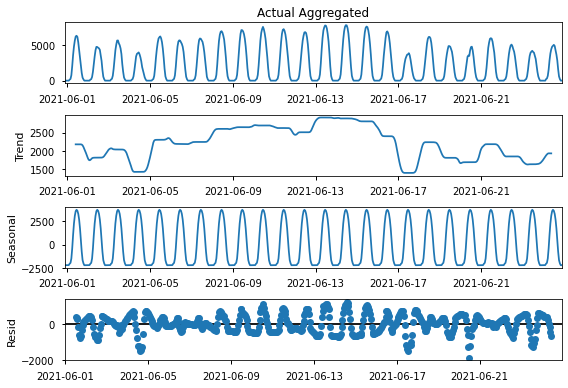

In [127]:
#Create seasonal decomposition of time series to check for seasonality
decompose = tsa.seasonal_decompose(train)
decompose.plot();

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[4] intercept   : AIC=9195.936, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[4] intercept   : AIC=8233.503, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[4] intercept   : AIC=8514.425, Time=0.28 sec
 ARIMA(0,1,0)(0,0,0)[4]             : AIC=9193.937, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[4] intercept   : AIC=8244.045, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[4] intercept   : AIC=8187.177, Time=0.39 sec
 ARIMA(1,1,0)(2,0,1)[4] intercept   : AIC=8178.614, Time=0.53 sec
 ARIMA(1,1,0)(1,0,1)[4] intercept   : AIC=8212.034, Time=0.35 sec
 ARIMA(1,1,0)(2,0,2)[4] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,1,0)(1,0,2)[4] intercept   : AIC=8188.773, Time=0.71 sec
 ARIMA(0,1,0)(2,0,1)[4] intercept   : AIC=8816.424, Time=0.51 sec
 ARIMA(2,1,0)(2,0,1)[4] intercept   : AIC=7914.178, Time=0.35 sec
 ARIMA(2,1,0)(1,0,1)[4] intercept   : AIC=7915.797, Time=0.39 sec
 ARIMA(2,1,0)(2,0,0)[4] intercept   : AIC=7915.155, Time=0.24 sec
 ARIMA(2,1,0)(2,0,2)[4] intercept   : 

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  576
Model:               SARIMAX(2, 1, 0)   Log Likelihood               -3952.106
Date:                Wed, 21 Jul 2021   AIC                           7910.212
Time:                        16:44:52   BIC                           7923.275
Sample:                             0   HQIC                          7915.307
                                - 576                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4963      0.027     54.814      0.000       1.443       1.550
ar.L2         -0.6628      0.029    -22.931      0.000      -0.719      -0.606
sigma2       5.46e+04   2734.091     19.970      0.000    4.92e+04       6e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.27   Jarque-Bera (JB):                31.14
Prob(Q):                              0.60   Prob(JB):                         0.00
Heteroskedasticity (H):               0.97   Skew:                             0.39
Prob(H) (two-sided):                  0.81   Kurtosis:                         3.84
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



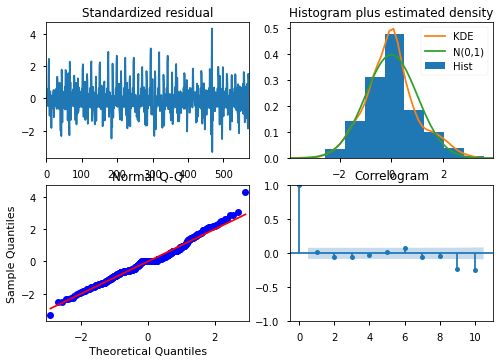

In [128]:
#Create first ARIMA model using auto arima to gridsearch for parameters
model = pmd.auto_arima(train, start_p=0, start_P=0, start_q=0, start_Q=0, m=4, d=1, trace=True)
display(model.summary())
model.plot_diagnostics();

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:      Actual Aggregated   No. Observations:                  576
Model:               SARIMAX(2, 1, 0)   Log Likelihood               -3952.106
Date:                Wed, 21 Jul 2021   AIC                           7910.212
Time:                        16:44:53   BIC                           7923.275
Sample:                    06-01-2021   HQIC                          7915.307
                         - 06-24-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4963      0.027     54.814      0.000       1.443       1.550
ar.L2         -0.6628      0.029    -22.931      0.000      -0.719      -0.606
sigma2       5.46e+04   2734.091     19.970      0.000    4.92e+04       6e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.27   Jarque-Bera (JB):                31.14
Prob(Q):                              0.60   Prob(JB):                         0.00
Heteroskedasticity (H):               0.97   Skew:                             0.39
Prob(H) (two-sided):                  0.81   Kurtosis:                         3.84
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



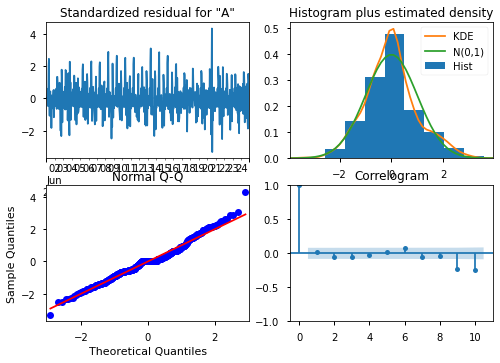

In [129]:
#Create SARIMAX model using determined parameters
sarimax_model = tsa.SARIMAX(train, order=model.order, seasonal_order=model.seasonal_order, enforce_stationarity=True).fit()
display(sarimax_model.summary())
sarimax_model.plot_diagnostics();

In [130]:
forecast_df = retrieve_forecast(sarimax_model, steps=len(test))
forecast_df

,Lower CI,Upper CI,Forecast
2021-06-25 00:00:00+02:00,-314.1445,601.8050,143.8303
2021-06-25 01:00:00+02:00,-872.5168,1590.6023,359.0428
2021-06-25 02:00:00+02:00,-1649.2501,2820.7137,585.7318
2021-06-25 03:00:00+02:00,-2564.3074,4128.8673,782.2799
2021-06-25 04:00:00+02:00,-3534.3303,5386.5739,926.1218
...,...,...,...
2021-06-30 19:00:00+02:00,-31592.3746,33319.8887,863.7570
2021-06-30 20:00:00+02:00,-31708.6965,33436.2106,863.7570
2021-06-30 21:00:00+02:00,-31824.6045,33552.1186,863.7570
2021-06-30 22:00:00+02:00,-31940.1029,33667.6170,863.7570


(<Figure size 720x432 with 1 Axes>, <AxesSubplot:ylabel='Value'>)

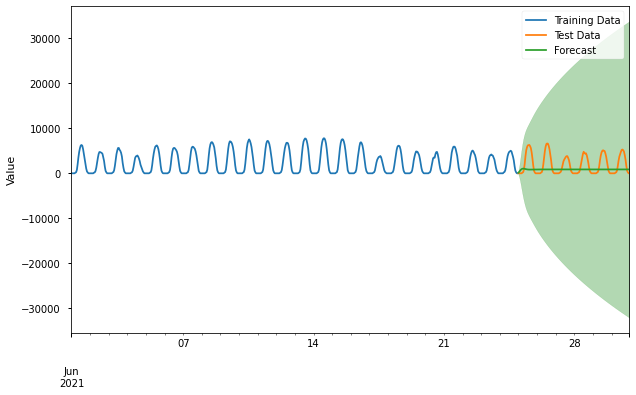

In [131]:
plot_train_test_forecast(train, test, forecast_df)

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:      Actual Aggregated   No. Observations:                  720
Model:               SARIMAX(2, 1, 0)   Log Likelihood               -4941.040
Date:                Wed, 21 Jul 2021   AIC                           9888.081
Time:                        16:44:53   BIC                           9901.814
Sample:                    06-01-2021   HQIC                          9893.383
                         - 06-30-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4835      0.024     60.653      0.000       1.436       1.531
ar.L2         -0.6511      0.026    -25.309      0.000      -0.702      -0.601
sigma2      5.449e+04   2499.833     21.797      0.000    4.96e+04    5.94e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.29   Jarque-Bera (JB):                28.08
Prob(Q):                              0.59   Prob(JB):                         0.00
Heteroskedasticity (H):               0.95   Skew:                             0.34
Prob(H) (two-sided):                  0.68   Kurtosis:                         3.70
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



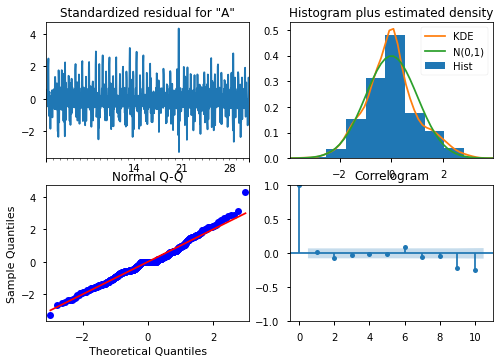

In [132]:
#Create and train SARIMAX model on the full time series
sarimax_model_full = tsa.SARIMAX(solar_ts, order=model.order,seasonal_order=model.seasonal_order,
                            enforce_stationarity=True).fit()
display(sarimax_model_full.summary())
sarimax_model_full.plot_diagnostics();

In [133]:
#Retrieve forecast for the next three days
forecast_df = retrieve_forecast(sarimax_model_full, steps=72)
forecast_df

,Lower CI,Upper CI,Forecast
2021-07-01 00:00:00+02:00,-323.3863,591.6393,134.1265
2021-07-01 01:00:00+02:00,-891.7802,1557.9849,333.1024
2021-07-01 02:00:00+02:00,-1673.8084,2755.7129,540.9522
2021-07-01 03:00:00+02:00,-2586.7048,4026.1912,719.7432
2021-07-01 04:00:00+02:00,-3547.1840,5246.4792,849.6476
...,...,...,...
2021-07-06 19:00:00+02:00,-31396.8078,32997.3120,800.2521
2021-07-06 20:00:00+02:00,-31512.3143,33112.8185,800.2521
2021-07-06 21:00:00+02:00,-31627.4094,33227.9136,800.2521
2021-07-06 22:00:00+02:00,-31742.0974,33342.6016,800.2521


Figure save as images/Actual Aggregated_forecast.png


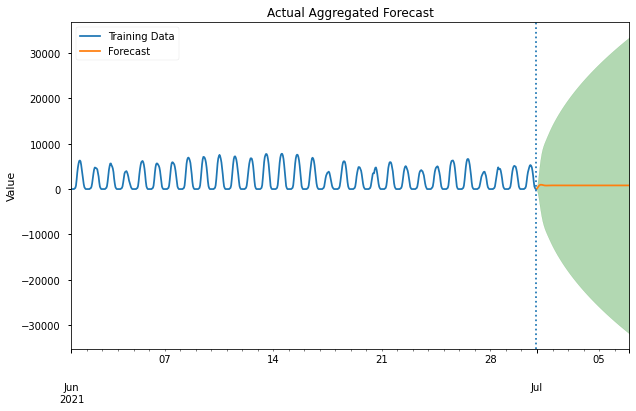

In [134]:
fig, ax = plot_time_series_forecast(solar_ts, forecast_df)

### Sktime

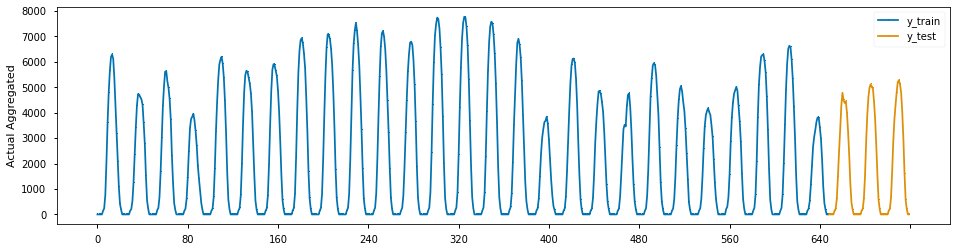

In [189]:
y = solar_ts.reset_index(drop=True)

y_train, y_test = temporal_train_test_split(y, test_size=72)
forecast_horizon = np.arange(y_test.shape[0]) + 1

plot_series(y_train, y_test, labels=["y_train", "y_test"], markers=[",", ","])
plt.show()

0.11294067524252277

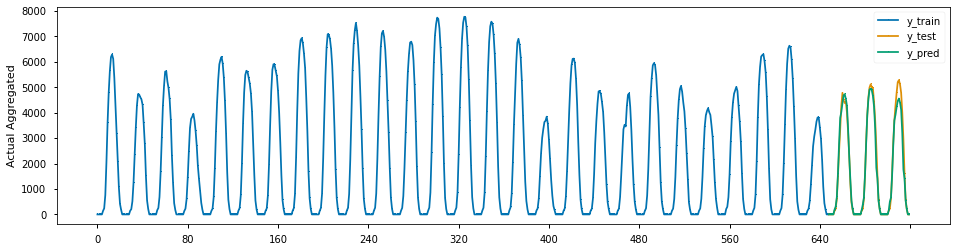

In [136]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

0.04908668769986439

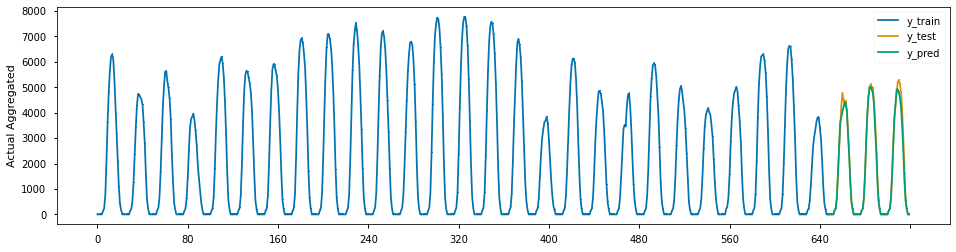

In [137]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
param_grid = {"window_length": [1, 5, 7]}

cv = SlidingWindowSplitter()
gscv = ForecastingGridSearchCV(forecaster, cv=cv, param_grid=param_grid)
gscv.fit(y_train, fh=forecast_horizon)
y_pred = gscv.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

In [138]:
gscv.best_params_

{'window_length': 7}

(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='Actual Aggregated'>)

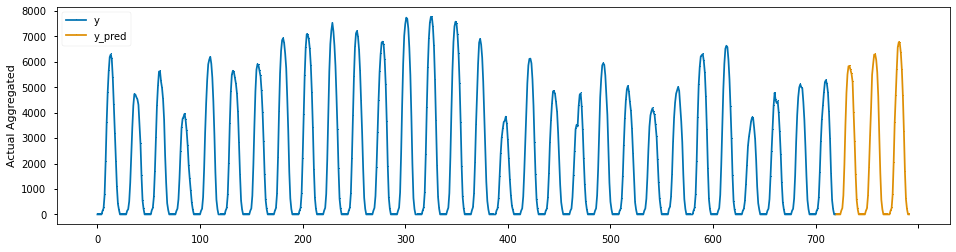

In [190]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator, window_length=7)
forecaster.fit(y, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y, y_pred, labels=["y", "y_pred"], markers=[",", ","])

0.6586792002786419

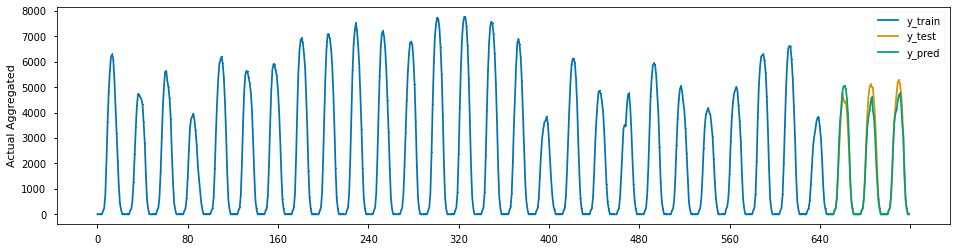

In [140]:
estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

### Wind Modeling

<AxesSubplot:>

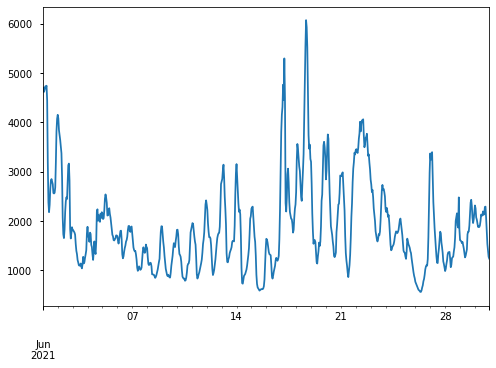

In [185]:
wind_ts = france_df['Wind Onshore']['Actual Aggregated']
wind_ts.plot()

In [142]:
train, test = train_test_split(wind_ts)

576

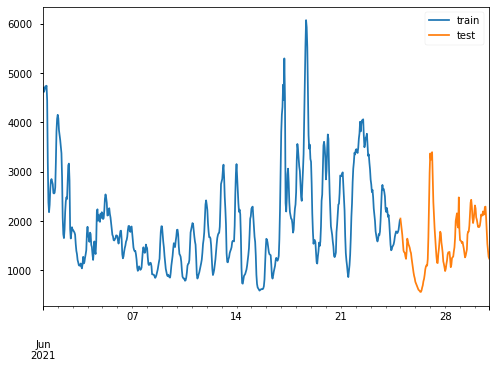

In [143]:
plot_train_test_split(train, test);

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-2.8854,17,558,0.0471,True,True


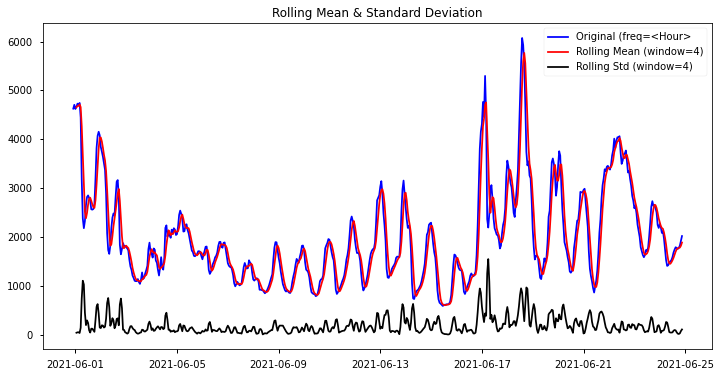

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-2.8854,17,558,0.0471,True,True


In [144]:
#Check time series for stationarity
stationarity_check(train)

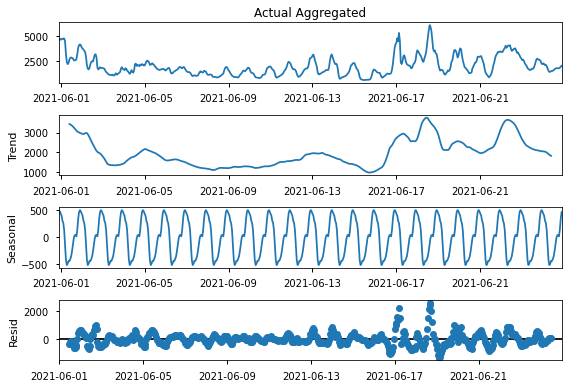

In [145]:
#Create seasonal decomposition of time series to check for seasonality
decompose = tsa.seasonal_decompose(train)
decompose.plot();

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=7953.294, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=7719.872, Time=0.20 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=7694.015, Time=0.22 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=7951.495, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[7] intercept   : AIC=7695.040, Time=0.10 sec
 ARIMA(0,1,1)(1,0,1)[7] intercept   : AIC=7693.708, Time=0.42 sec
 ARIMA(0,1,1)(1,0,0)[7] intercept   : AIC=7694.546, Time=0.20 sec
 ARIMA(0,1,1)(2,0,1)[7] intercept   : AIC=7693.451, Time=0.69 sec
 ARIMA(0,1,1)(2,0,0)[7] intercept   : AIC=7691.722, Time=0.43 sec
 ARIMA(0,1,0)(2,0,0)[7] intercept   : AIC=7931.920, Time=0.34 sec
 ARIMA(1,1,1)(2,0,0)[7] intercept   : AIC=7683.203, Time=0.51 sec
 ARIMA(1,1,1)(1,0,0)[7] intercept   : AIC=7684.863, Time=0.31 sec
 ARIMA(1,1,1)(2,0,1)[7] intercept   : AIC=7684.849, Time=0.93 sec
 ARIMA(1,1,1)(1,0,1)[7] intercept   : AIC=7684.521, Time=0.57 sec
 ARIMA(1,1,0)(2,0,0)[7] intercept

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  576
Model:               SARIMAX(3, 1, 2)   Log Likelihood               -3821.435
Date:                Wed, 21 Jul 2021   AIC                           7654.870
Time:                        16:50:40   BIC                           7680.996
Sample:                             0   HQIC                          7665.060
                                - 576                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9126      0.068     13.340      0.000       0.778       1.047
ar.L2          0.2670      0.123      2.170      0.030       0.026       0.508
ar.L3         -0.2875      0.064     -4.464      0.000      -0.414      -0.161
ma.L1         -0.1994      0.067     -2.967      0.003      -0.331      -0.068
ma.L2         -0.7572      0.064    -11.914      0.000      -0.882      -0.633
sigma2      3.442e+04    818.000     42.082      0.000    3.28e+04     3.6e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):              4774.83
Prob(Q):                              0.91   Prob(JB):                         0.00
Heteroskedasticity (H):               2.47   Skew:                            -0.33
Prob(H) (two-sided):                  0.00   Kurtosis:                        17.10
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



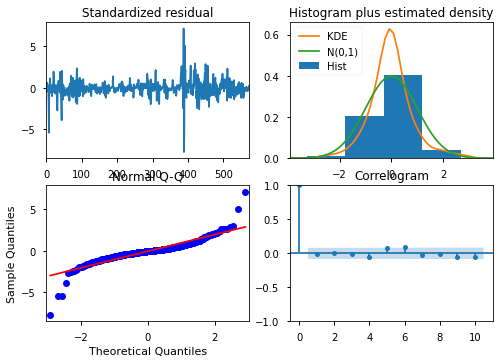

In [146]:
#Create first ARIMA model using auto arima to gridsearch for parameters
model = pmd.auto_arima(train, start_p=0, start_P=0, start_q=0, start_Q=0, m=7, trace=True)
display(model.summary())
model.plot_diagnostics();

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:      Actual Aggregated   No. Observations:                  576
Model:               SARIMAX(3, 1, 2)   Log Likelihood               -3821.435
Date:                Wed, 21 Jul 2021   AIC                           7654.870
Time:                        16:50:41   BIC                           7680.996
Sample:                    06-01-2021   HQIC                          7665.060
                         - 06-24-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9126      0.068     13.340      0.000       0.778       1.047
ar.L2          0.2670      0.123      2.170      0.030       0.026       0.508
ar.L3         -0.2875      0.064     -4.464      0.000      -0.414      -0.161
ma.L1         -0.1994      0.067     -2.967      0.003      -0.331      -0.068
ma.L2         -0.7572      0.064    -11.914      0.000      -0.882      -0.633
sigma2      3.442e+04    818.000     42.082      0.000    3.28e+04     3.6e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):              4774.83
Prob(Q):                              0.91   Prob(JB):                         0.00
Heteroskedasticity (H):               2.47   Skew:                            -0.33
Prob(H) (two-sided):                  0.00   Kurtosis:                        17.10
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



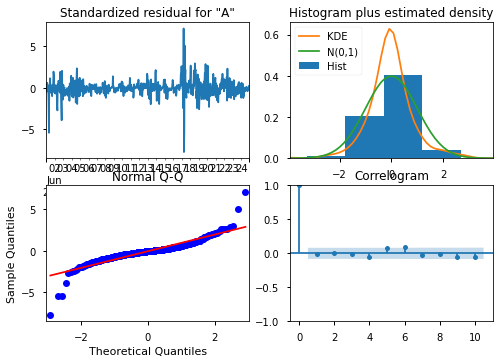

In [147]:
#Create SARIMAX model using determined parameters
sarimax_model = tsa.SARIMAX(train, order=model.order, seasonal_order=model.seasonal_order, enforce_stationarity=True).fit()
display(sarimax_model.summary())
sarimax_model.plot_diagnostics();

In [148]:
forecast_df = retrieve_forecast(sarimax_model, steps=len(test))
forecast_df

,Lower CI,Upper CI,Forecast
2021-06-25 00:00:00+02:00,1717.4151,2444.7004,2081.0577
2021-06-25 01:00:00+02:00,1403.2775,2845.9455,2124.6115
2021-06-25 02:00:00+02:00,1161.6297,3146.1768,2153.9032
2021-06-25 03:00:00+02:00,960.4379,3388.4067,2174.4223
2021-06-25 04:00:00+02:00,808.1432,3568.7513,2188.4473
...,...,...,...
2021-06-30 19:00:00+02:00,-288.5302,4733.4477,2222.4588
2021-06-30 20:00:00+02:00,-292.7876,4737.7051,2222.4588
2021-06-30 21:00:00+02:00,-297.0378,4741.9553,2222.4588
2021-06-30 22:00:00+02:00,-301.2809,4746.1984,2222.4588


(<Figure size 720x432 with 1 Axes>, <AxesSubplot:ylabel='Value'>)

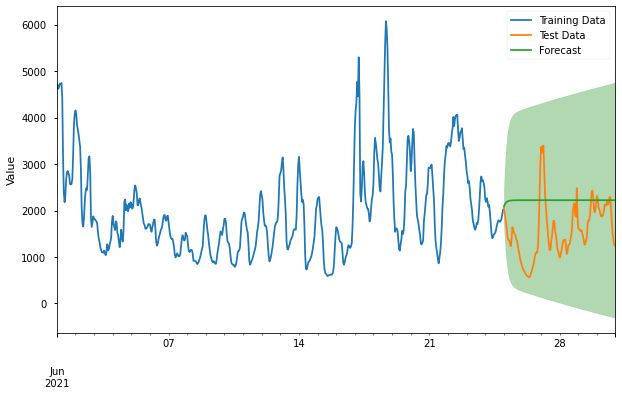

In [149]:
plot_train_test_forecast(train, test, forecast_df)

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.



<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:      Actual Aggregated   No. Observations:                  720
Model:               SARIMAX(3, 1, 2)   Log Likelihood               -4753.942
Date:                Wed, 21 Jul 2021   AIC                           9519.885
Time:                        16:50:42   BIC                           9547.352
Sample:                    06-01-2021   HQIC                          9530.489
                         - 06-30-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.8865      0.066     13.370      0.000       0.757       1.016
ar.L2          0.3009      0.118      2.561      0.010       0.071       0.531
ar.L3         -0.2961      0.060     -4.931      0.000      -0.414      -0.178
ma.L1         -0.2003      0.066     -3.044      0.002      -0.329      -0.071
ma.L2         -0.7538      0.062    -12.063      0.000      -0.876      -0.631
sigma2      3.223e+04    690.852     46.651      0.000    3.09e+04    3.36e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.07   Jarque-Bera (JB):              5806.77
Prob(Q):                              0.79   Prob(JB):                         0.00
Heteroskedasticity (H):               0.96   Skew:                            -0.47
Prob(H) (two-sided):                  0.76   Kurtosis:                        16.89
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



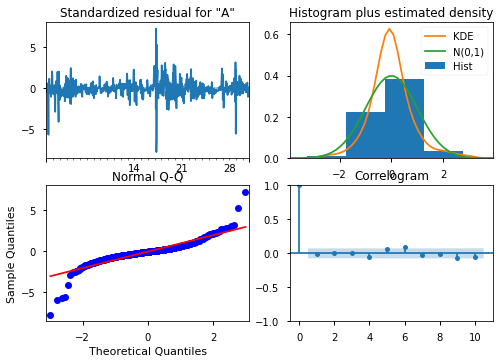

In [150]:
#Create and train SARIMAX model on the full time series
sarimax_model_full = tsa.SARIMAX(wind_ts, order=model.order,seasonal_order=model.seasonal_order,
                            enforce_stationarity=True).fit()
display(sarimax_model_full.summary())
sarimax_model_full.plot_diagnostics();

In [151]:
#Retrieve forecast for the next three days
forecast_df = retrieve_forecast(sarimax_model_full, steps=72)
forecast_df

,Lower CI,Upper CI,Forecast
2021-07-01 00:00:00+02:00,915.8158,1619.5372,1267.6765
2021-07-01 01:00:00+02:00,614.6508,1994.2683,1304.4596
2021-07-01 02:00:00+02:00,410.5057,2303.4003,1356.9530
2021-07-01 03:00:00+02:00,249.0595,2562.4855,1405.7725
2021-07-01 04:00:00+02:00,139.1805,2768.7370,1453.9588
...,...,...,...
2021-07-06 19:00:00+02:00,-764.9306,4182.0010,1708.5352
2021-07-06 20:00:00+02:00,-769.3921,4186.4625,1708.5352
2021-07-06 21:00:00+02:00,-773.8456,4190.9160,1708.5352
2021-07-06 22:00:00+02:00,-778.2911,4195.3614,1708.5352


Figure save as images/Actual Aggregated_forecast.png


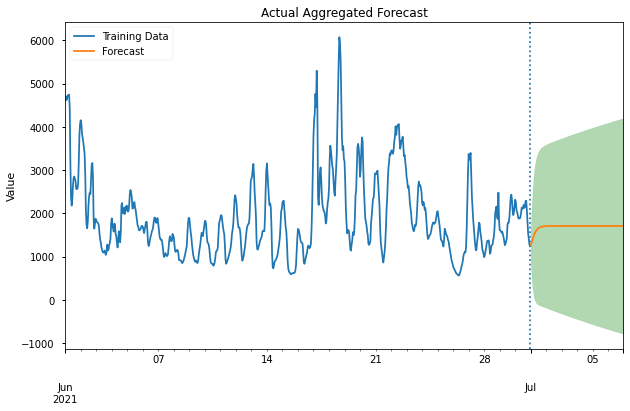

In [152]:
fig, ax = plot_time_series_forecast(wind_ts, forecast_df)

### Sktime

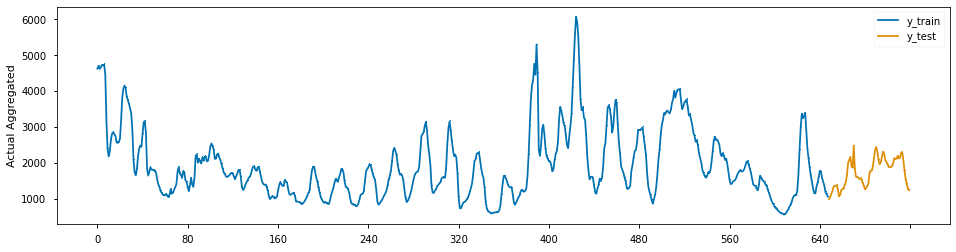

In [186]:
y = wind_ts.reset_index(drop=True)

y_train, y_test = temporal_train_test_split(y, test_size=72)
forecast_horizon = np.arange(y_test.shape[0]) + 1

plot_series(y_train, y_test, labels=["y_train", "y_test"], markers=[",", ","])
plt.show()

0.3601545934789462

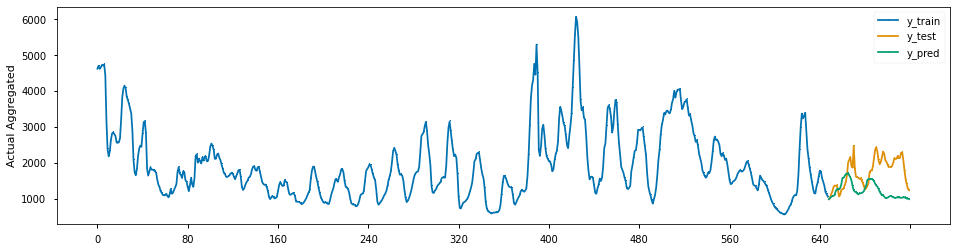

In [154]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

0.21144609846171475

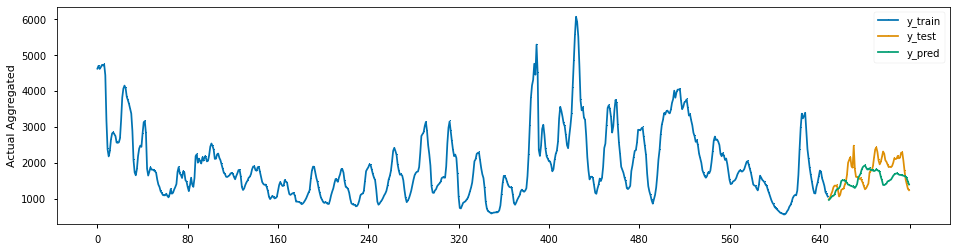

In [155]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
param_grid = {"window_length": [1, 5, 7]}

cv = SlidingWindowSplitter()
gscv = ForecastingGridSearchCV(forecaster, cv=cv, param_grid=param_grid)
gscv.fit(y_train, fh=forecast_horizon)
y_pred = gscv.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

In [156]:
gscv.best_params_

{'window_length': 7}

0.3261815051708363

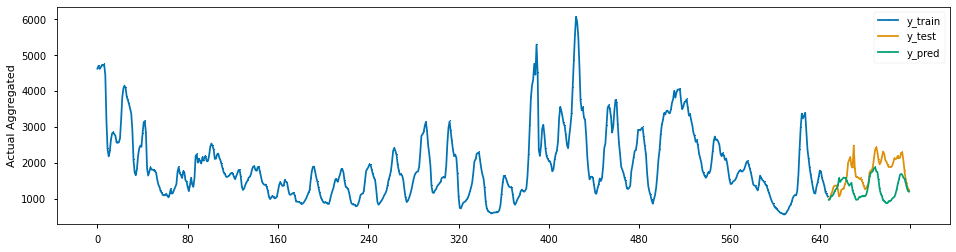

In [157]:
estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

fig, ax = plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='Actual Aggregated'>)

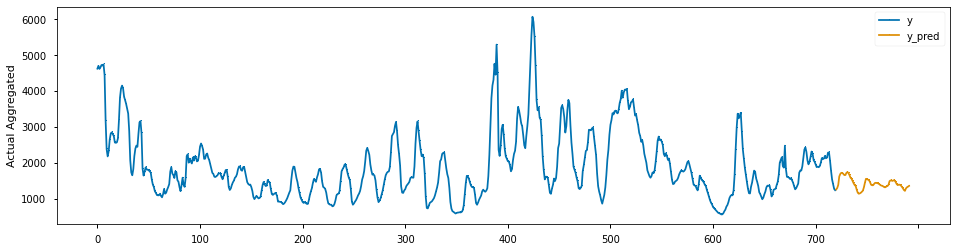

In [187]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator, window_length=7)
forecaster.fit(y, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y, y_pred, labels=["y", "y_pred"], markers=[",", ","])

## Italy

### SCRUB/EXPLORE

In [159]:
#Get data set for Italy
italy_df = get_energy_df('IT')
italy_df.head()

Biomass  ...      Wind Onshore
                          Actual Aggregated  ... Actual Aggregated
2021-06-01 00:00:00+02:00          714.0000  ...         1278.0000
2021-06-01 01:00:00+02:00          721.0000  ...         1439.0000
2021-06-01 02:00:00+02:00          731.0000  ...         1455.0000
2021-06-01 03:00:00+02:00          730.0000  ...         1632.0000
2021-06-01 04:00:00+02:00          730.0000  ...         1975.0000

[5 rows x 15 columns]

In [160]:
italy_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 720 entries, 2021-06-01 00:00:00+02:00 to 2021-06-30 23:00:00+02:00
Freq: H
Data columns (total 15 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   (Biomass, Actual Aggregated)                          720 non-null    float64
 1   (Fossil Coal-derived gas, Actual Aggregated)          720 non-null    float64
 2   (Fossil Gas, Actual Aggregated)                       720 non-null    float64
 3   (Fossil Hard coal, Actual Aggregated)                 720 non-null    float64
 4   (Fossil Hard coal, Actual Consumption)                24 non-null     float64
 5   (Fossil Oil, Actual Aggregated)                       720 non-null    float64
 6   (Geothermal, Actual Aggregated)                       720 non-null    float64
 7   (Hydro Pumped Storage, Actual Aggregated)             712 non-null    float64
 8   (Hy

In [161]:
#Drop unnecessary columns
cols = [0,1,2,3,4,5,6,7,8,9,10,11,13]
italy_df.drop(italy_df.columns[cols],axis=1,inplace=True)
italy_df.head()

,Solar,Wind Onshore
,Actual Aggregated,Actual Aggregated
2021-06-01 00:00:00+02:00,0.0000,1278.0000
2021-06-01 01:00:00+02:00,0.0000,1439.0000
2021-06-01 02:00:00+02:00,0.0000,1455.0000
2021-06-01 03:00:00+02:00,0.0000,1632.0000
2021-06-01 04:00:00+02:00,0.0000,1975.0000


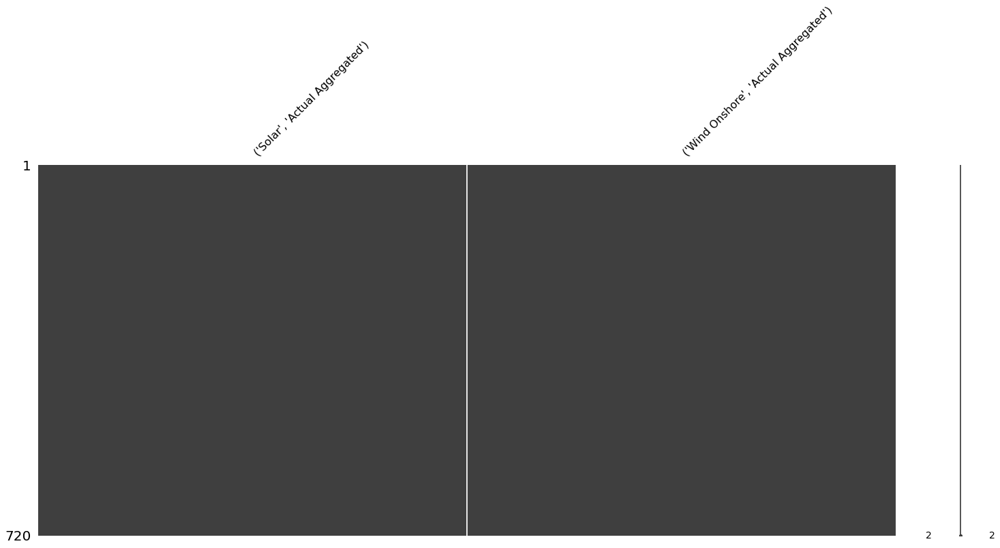

,,#null,%null
Solar,Actual Aggregated,0,0.0000
Wind Onshore,Actual Aggregated,0,0.0000


In [162]:
check_nulls(italy_df)

In [163]:
italy_df.index

DatetimeIndex(['2021-06-01 00:00:00+02:00', '2021-06-01 01:00:00+02:00',
               '2021-06-01 02:00:00+02:00', '2021-06-01 03:00:00+02:00',
               '2021-06-01 04:00:00+02:00', '2021-06-01 05:00:00+02:00',
               '2021-06-01 06:00:00+02:00', '2021-06-01 07:00:00+02:00',
               '2021-06-01 08:00:00+02:00', '2021-06-01 09:00:00+02:00',
               ...
               '2021-06-30 14:00:00+02:00', '2021-06-30 15:00:00+02:00',
               '2021-06-30 16:00:00+02:00', '2021-06-30 17:00:00+02:00',
               '2021-06-30 18:00:00+02:00', '2021-06-30 19:00:00+02:00',
               '2021-06-30 20:00:00+02:00', '2021-06-30 21:00:00+02:00',
               '2021-06-30 22:00:00+02:00', '2021-06-30 23:00:00+02:00'],
              dtype='datetime64[ns, Europe/Rome]', length=720, freq='H')

<AxesSubplot:>

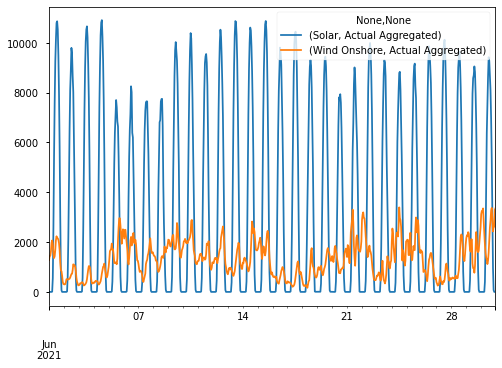

In [164]:
italy_df.plot()

### Solar Modeling

<AxesSubplot:>

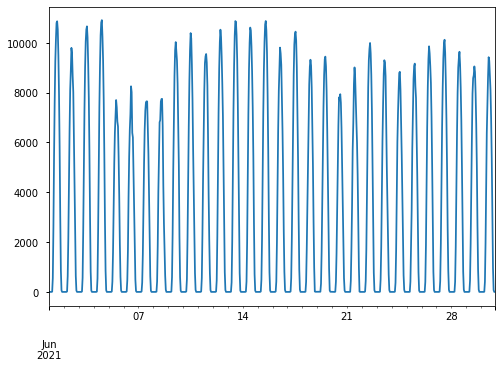

In [165]:
solar_ts = italy_df['Solar']['Actual Aggregated']
solar_ts.plot()

In [166]:
train, test = train_test_split(solar_ts)

576

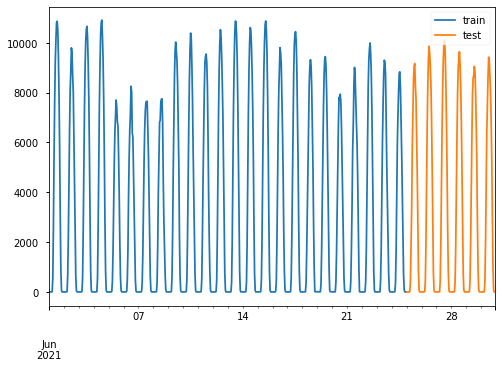

In [167]:
plot_train_test_split(train, test);

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-2.9828,19,556,0.0365,True,True


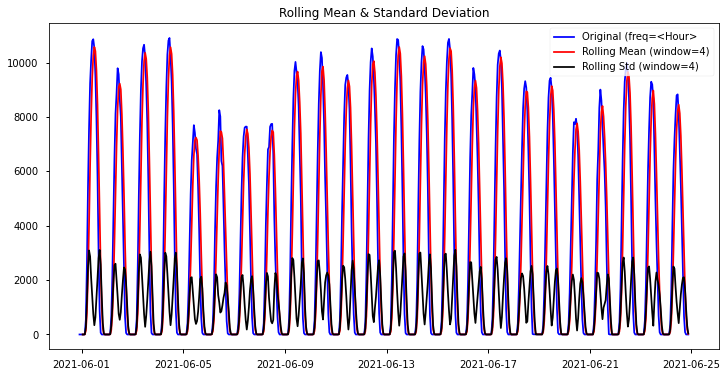

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-2.9828,19,556,0.0365,True,True


In [168]:
#Check time series for stationarity
stationarity_check(train)

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-20.4805,19,555,0.0000,True,True


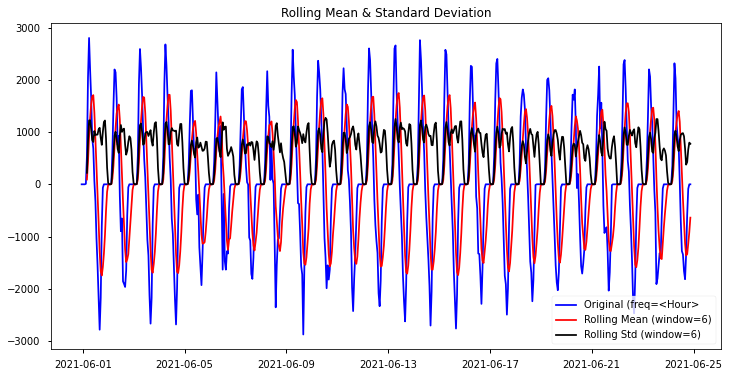

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-20.4805,19,555,0.0000,True,True


In [169]:
#Check if differencing time series will result in stationarity
stationarity_check(train.diff().dropna(), window=6)

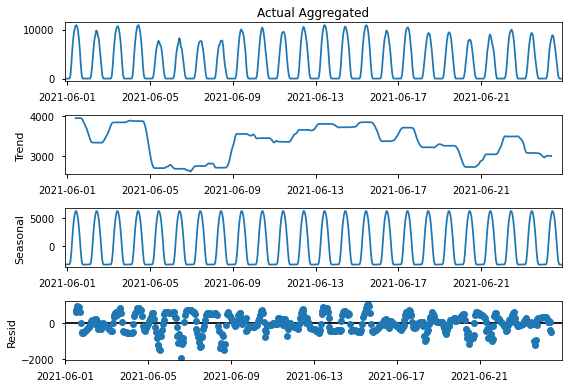

In [170]:
#Create seasonal decomposition of time series to check for seasonality
decompose = tsa.seasonal_decompose(train)
decompose.plot();

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[4] intercept   : AIC=9750.384, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[4] intercept   : AIC=8855.948, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[4] intercept   : AIC=9090.384, Time=0.32 sec
 ARIMA(0,1,0)(0,0,0)[4]             : AIC=9748.385, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[4] intercept   : AIC=8863.348, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[4] intercept   : AIC=8798.171, Time=0.44 sec
 ARIMA(1,1,0)(2,0,1)[4] intercept   : AIC=8768.389, Time=0.63 sec
 ARIMA(1,1,0)(1,0,1)[4] intercept   : AIC=8857.573, Time=0.38 sec
 ARIMA(1,1,0)(2,0,2)[4] intercept   : AIC=inf, Time=1.22 sec
 ARIMA(1,1,0)(1,0,2)[4] intercept   : AIC=8790.396, Time=0.63 sec
 ARIMA(0,1,0)(2,0,1)[4] intercept   : AIC=9574.843, Time=0.38 sec
 ARIMA(2,1,0)(2,0,1)[4] intercept   : AIC=8611.066, Time=0.42 sec
 ARIMA(2,1,0)(1,0,1)[4] intercept   : AIC=8621.562, Time=0.34 sec
 ARIMA(2,1,0)(2,0,0)[4] intercept   : AIC=8616.535, Time=0.23 sec
 ARIMA(2,1,0)(2,0,2)[4] intercept   : 

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  576
Model:             SARIMAX(3, 1, 0)x(2, 0, [1], 4)   Log Likelihood               -4297.282
Date:                             Wed, 21 Jul 2021   AIC                           8608.563
Time:                                     16:57:17   BIC                           8639.044
Sample:                                          0   HQIC                          8620.451
                                             - 576                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3304      0.030     44.189      0.000       1.271       1.389
ar.L2         -0.4445      0.051     -8.730      0.000      -0.544      -0.345
ar.L3         -0.0671      0.039     -1.742      0.081      -0.143       0.008
ar.S.L4       -0.4978      0.224     -2.218      0.027      -0.938      -0.058
ar.S.L8       -0.1644      0.052     -3.177      0.001      -0.266      -0.063
ma.S.L4        0.4757      0.217      2.188      0.029       0.049       0.902
sigma2      1.867e+05   8771.128     21.280      0.000    1.69e+05    2.04e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):               112.93
Prob(Q):                              0.86   Prob(JB):                         0.00
Heteroskedasticity (H):               0.55   Skew:                             0.19
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.14
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



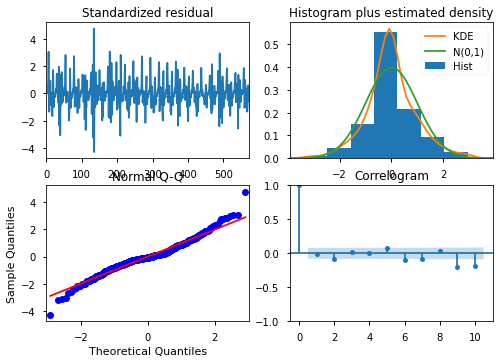

In [171]:
#Create first ARIMA model using auto arima to gridsearch for parameters
model = pmd.auto_arima(train, start_p=0, start_P=0, start_q=0, start_Q=0, m=4, d=1, trace=True)
display(model.summary())
model.plot_diagnostics();

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                   Actual Aggregated   No. Observations:                  576
Model:             SARIMAX(3, 1, 0)x(2, 0, [1], 4)   Log Likelihood               -4297.282
Date:                             Wed, 21 Jul 2021   AIC                           8608.563
Time:                                     16:57:18   BIC                           8639.044
Sample:                                 06-01-2021   HQIC                          8620.451
                                      - 06-24-2021                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3304      0.030     44.189      0.000       1.271       1.389
ar.L2         -0.4445      0.051     -8.730      0.000      -0.544      -0.345
ar.L3         -0.0671      0.039     -1.742      0.081      -0.143       0.008
ar.S.L4       -0.4978      0.224     -2.218      0.027      -0.938      -0.058
ar.S.L8       -0.1644      0.052     -3.177      0.001      -0.266      -0.063
ma.S.L4        0.4757      0.217      2.188      0.029       0.049       0.902
sigma2      1.867e+05   8771.128     21.280      0.000    1.69e+05    2.04e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):               112.93
Prob(Q):                              0.86   Prob(JB):                         0.00
Heteroskedasticity (H):               0.55   Skew:                             0.19
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.14
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



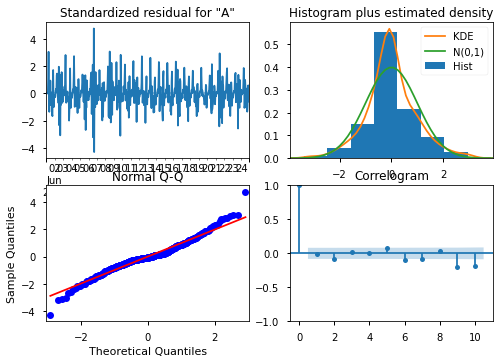

In [172]:
#Create SARIMAX model using determined parameters
sarimax_model = tsa.SARIMAX(train, order=model.order, seasonal_order=model.seasonal_order, enforce_stationarity=True).fit()
display(sarimax_model.summary())
sarimax_model.plot_diagnostics();

In [173]:
forecast_df = retrieve_forecast(sarimax_model, steps=len(test))
forecast_df

,Lower CI,Upper CI,Forecast
2021-06-25 00:00:00+02:00,-865.3196,828.2231,-18.5482
2021-06-25 01:00:00+02:00,-2129.4935,2165.1156,17.8110
2021-06-25 02:00:00+02:00,-3653.8058,3881.1623,113.6782
2021-06-25 03:00:00+02:00,-5346.5491,5688.8926,171.1717
2021-06-25 04:00:00+02:00,-7068.2955,7405.8306,168.7675
...,...,...,...
2021-06-30 19:00:00+02:00,-48960.9802,49227.9707,133.4953
2021-06-30 20:00:00+02:00,-49136.0319,49403.0224,133.4953
2021-06-30 21:00:00+02:00,-49310.4639,49577.4544,133.4953
2021-06-30 22:00:00+02:00,-49484.2827,49751.2732,133.4953


(<Figure size 720x432 with 1 Axes>, <AxesSubplot:ylabel='Value'>)

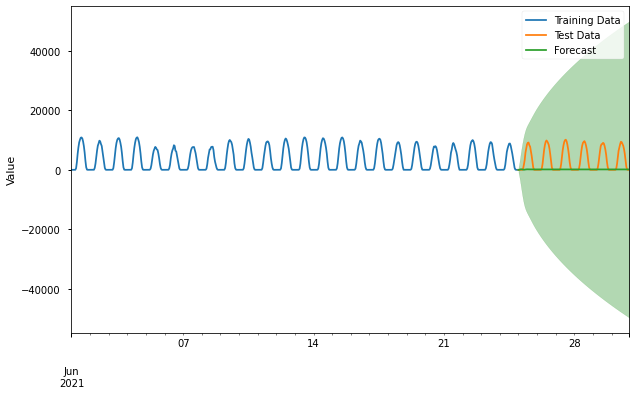

In [174]:
plot_train_test_forecast(train, test, forecast_df)

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                   Actual Aggregated   No. Observations:                  720
Model:             SARIMAX(3, 1, 0)x(2, 0, [1], 4)   Log Likelihood               -5370.967
Date:                             Wed, 21 Jul 2021   AIC                          10755.935
Time:                                     16:57:19   BIC                          10787.980
Sample:                                 06-01-2021   HQIC                         10768.307
                                      - 06-30-2021                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3318      0.027     49.995      0.000       1.280       1.384
ar.L2         -0.4472      0.044    -10.067      0.000      -0.534      -0.360
ar.L3         -0.0713      0.033     -2.156      0.031      -0.136      -0.006
ar.S.L4       -0.4766      0.205     -2.326      0.020      -0.878      -0.075
ar.S.L8       -0.1462      0.045     -3.248      0.001      -0.234      -0.058
ma.S.L4        0.4814      0.198      2.437      0.015       0.094       0.869
sigma2      1.799e+05   7540.609     23.856      0.000    1.65e+05    1.95e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):               104.98
Prob(Q):                              0.87   Prob(JB):                         0.00
Heteroskedasticity (H):               0.73   Skew:                             0.19
Prob(H) (two-sided):                  0.02   Kurtosis:                         4.83
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



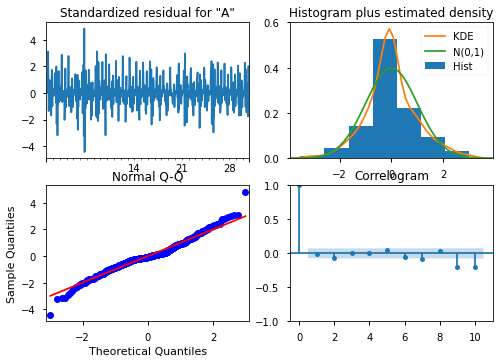

In [175]:
#Create and train SARIMAX model on the full time series
sarimax_model_full = tsa.SARIMAX(solar_ts, order=model.order,seasonal_order=model.seasonal_order,
                            enforce_stationarity=True).fit()
display(sarimax_model_full.summary())
sarimax_model_full.plot_diagnostics();

In [176]:
#Retrieve forecast for the next three days
forecast_df = retrieve_forecast(sarimax_model_full, steps=72)
forecast_df

,Lower CI,Upper CI,Forecast
2021-07-01 00:00:00+02:00,-745.8000,916.7606,85.4803
2021-07-01 01:00:00+02:00,-1886.2878,2331.8902,222.8012
2021-07-01 02:00:00+02:00,-3213.2999,4188.2420,487.4710
2021-07-01 03:00:00+02:00,-4640.6811,6192.1318,775.7253
2021-07-01 04:00:00+02:00,-6245.5087,7972.0839,863.2876
...,...,...,...
2021-07-06 19:00:00+02:00,-47452.2896,48696.4821,622.0963
2021-07-06 20:00:00+02:00,-47623.6254,48867.8179,622.0963
2021-07-06 21:00:00+02:00,-47794.3548,49038.5474,622.0963
2021-07-06 22:00:00+02:00,-47964.4843,49208.6769,622.0963


Figure save as images/Actual Aggregated_forecast.png


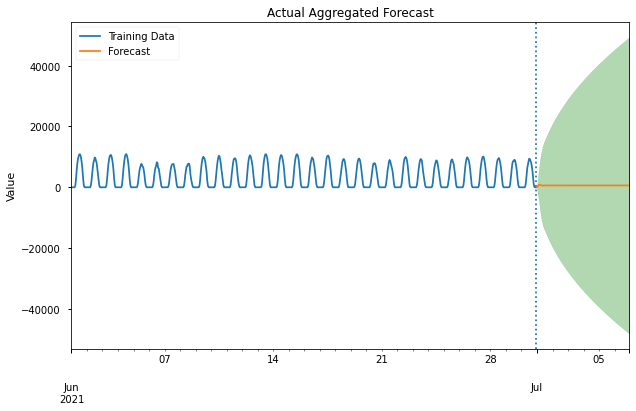

In [177]:
fig, ax = plot_time_series_forecast(solar_ts, forecast_df)

### Sktime

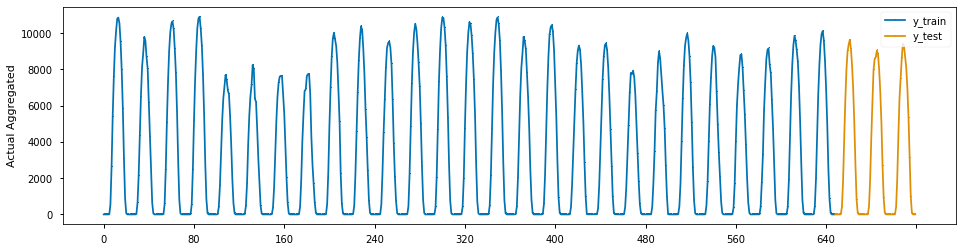

In [178]:
y = solar_ts.reset_index(drop=True)

y_train, y_test = temporal_train_test_split(y, test_size=72)
forecast_horizon = np.arange(y_test.shape[0]) + 1

plot_series(y_train, y_test, labels=["y_train", "y_test"], markers=[",", ","])
plt.show()

0.1038327740686606

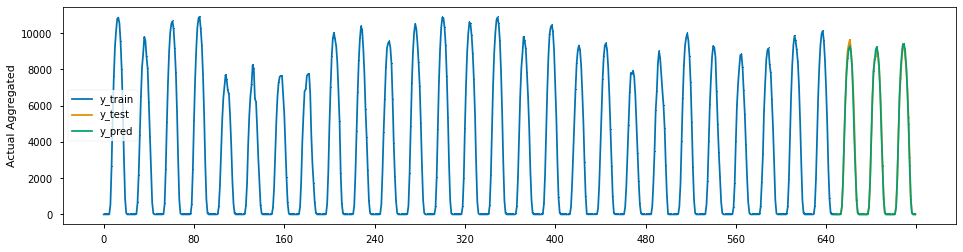

In [179]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

0.08312212212523797

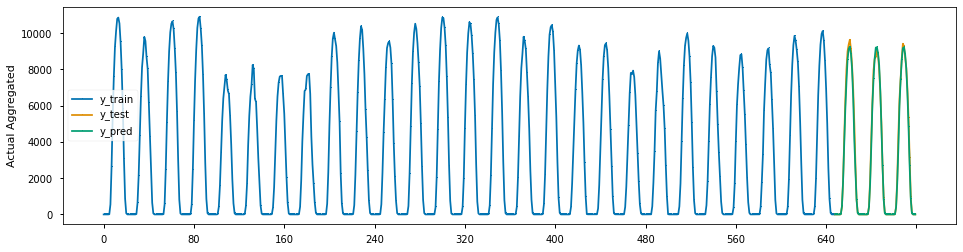

In [180]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
param_grid = {"window_length": [1, 5, 7]}

cv = SlidingWindowSplitter()
gscv = ForecastingGridSearchCV(forecaster, cv=cv, param_grid=param_grid)
gscv.fit(y_train, fh=forecast_horizon)
y_pred = gscv.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

In [181]:
gscv.best_params_

{'window_length': 7}

(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='Actual Aggregated'>)

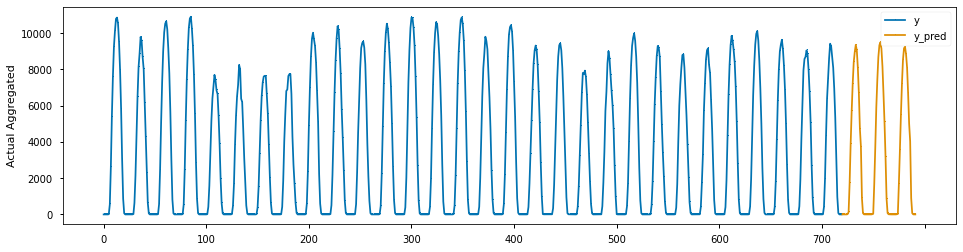

In [184]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator, window_length=7)
forecaster.fit(y, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y, y_pred, labels=["y", "y_pred"], markers=[",", ","])

0.7083481760512949

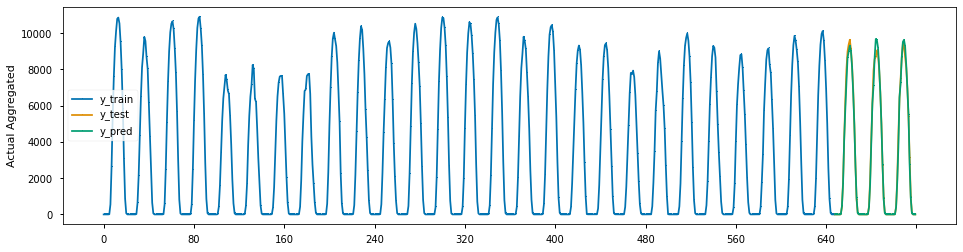

In [183]:
estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

### Wind Modeling

<AxesSubplot:>

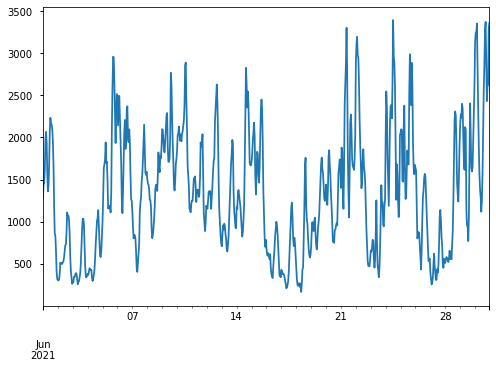

In [196]:
wind_ts = italy_df['Wind Onshore']['Actual Aggregated']
wind_ts.plot()

In [197]:
train, test = train_test_split(wind_ts)

576

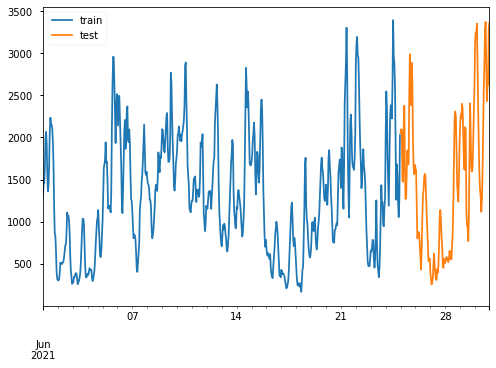

In [198]:
plot_train_test_split(train, test);

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-4.6648,4,571,0.0001,True,True


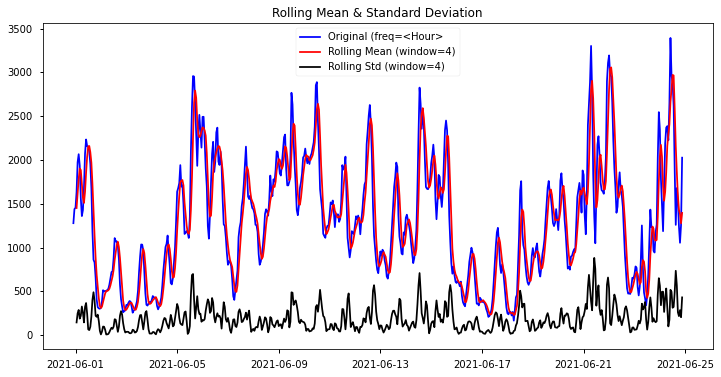

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-4.6648,4,571,0.0001,True,True


In [199]:
#Check time series for stationarity
stationarity_check(train)

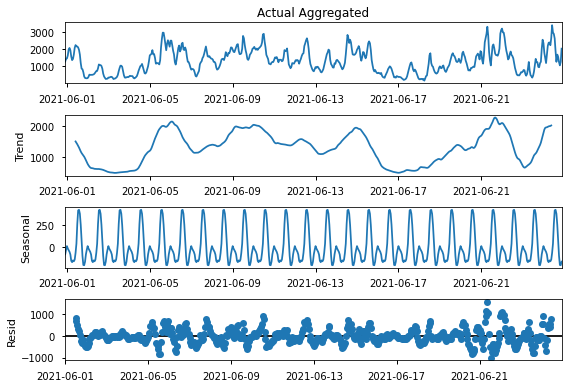

In [200]:
#Create seasonal decomposition of time series to check for seasonality
decompose = tsa.seasonal_decompose(train)
decompose.plot();

Performing stepwise search to minimize aic
 ARIMA(0,0,0)(0,0,0)[7] intercept   : AIC=9156.904, Time=0.01 sec
 ARIMA(1,0,0)(1,0,0)[7] intercept   : AIC=7863.529, Time=0.28 sec
 ARIMA(0,0,1)(0,0,1)[7] intercept   : AIC=8412.721, Time=0.33 sec
 ARIMA(0,0,0)(0,0,0)[7]             : AIC=10040.114, Time=0.01 sec
 ARIMA(1,0,0)(0,0,0)[7] intercept   : AIC=7866.984, Time=0.03 sec
 ARIMA(1,0,0)(2,0,0)[7] intercept   : AIC=7865.566, Time=0.56 sec
 ARIMA(1,0,0)(1,0,1)[7] intercept   : AIC=7865.525, Time=0.40 sec
 ARIMA(1,0,0)(0,0,1)[7] intercept   : AIC=7863.703, Time=0.13 sec
 ARIMA(1,0,0)(2,0,1)[7] intercept   : AIC=7867.524, Time=1.01 sec
 ARIMA(0,0,0)(1,0,0)[7] intercept   : AIC=9006.201, Time=0.37 sec
 ARIMA(2,0,0)(1,0,0)[7] intercept   : AIC=7688.309, Time=0.43 sec
 ARIMA(2,0,0)(0,0,0)[7] intercept   : AIC=7686.356, Time=0.05 sec
 ARIMA(2,0,0)(0,0,1)[7] intercept   : AIC=7688.324, Time=0.15 sec
 ARIMA(2,0,0)(1,0,1)[7] intercept   : AIC=7690.291, Time=0.40 sec
 ARIMA(3,0,0)(0,0,0)[7] intercep

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  576
Model:               SARIMAX(2, 0, 1)   Log Likelihood               -3821.778
Date:                Wed, 21 Jul 2021   AIC                           7653.555
Time:                        17:13:14   BIC                           7675.336
Sample:                             0   HQIC                          7662.049
                                - 576                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept    130.9121     31.893      4.105      0.000      68.402     193.422
ar.L1          1.1295      0.060     18.957      0.000       1.013       1.246
ar.L2         -0.2288      0.061     -3.761      0.000      -0.348      -0.110
ma.L1          0.4571      0.056      8.135      0.000       0.347       0.567
sigma2      3.375e+04   1450.094     23.275      0.000    3.09e+04    3.66e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):               214.98
Prob(Q):                              0.99   Prob(JB):                         0.00
Heteroskedasticity (H):               2.33   Skew:                             0.64
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.70
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



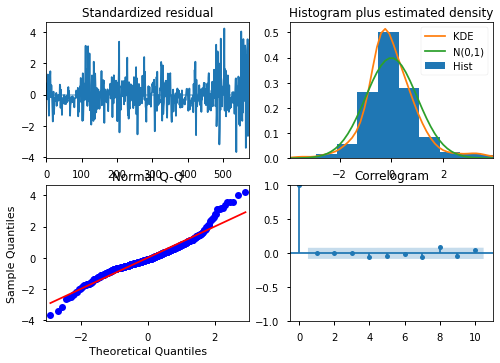

In [201]:
#Create first ARIMA model using auto arima to gridsearch for parameters
model = pmd.auto_arima(train, start_p=0, start_P=0, start_q=0, start_Q=0, m=7, trace=True)
display(model.summary())
model.plot_diagnostics();

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:      Actual Aggregated   No. Observations:                  576
Model:               SARIMAX(2, 0, 1)   Log Likelihood               -3836.721
Date:                Wed, 21 Jul 2021   AIC                           7681.441
Time:                        17:13:14   BIC                           7698.866
Sample:                    06-01-2021   HQIC                          7688.237
                         - 06-24-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.1341      0.060     19.001      0.000       1.017       1.251
ar.L2         -0.1549      0.061     -2.546      0.011      -0.274      -0.036
ma.L1          0.4975      0.054      9.268      0.000       0.392       0.603
sigma2      3.561e+04   1462.019     24.359      0.000    3.27e+04    3.85e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.02   Jarque-Bera (JB):               164.41
Prob(Q):                              0.89   Prob(JB):                         0.00
Heteroskedasticity (H):               2.39   Skew:                             0.24
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.57
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



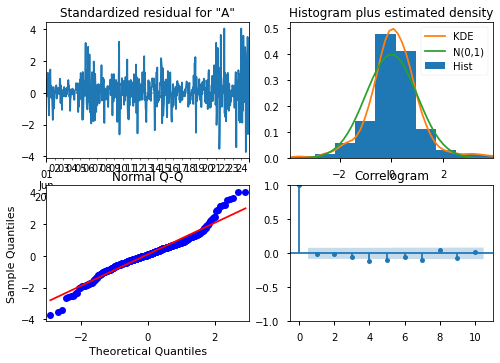

In [202]:
#Create SARIMAX model using determined parameters
sarimax_model = tsa.SARIMAX(train, order=model.order, seasonal_order=model.seasonal_order, enforce_stationarity=True).fit()
display(sarimax_model.summary())
sarimax_model.plot_diagnostics();

In [203]:
forecast_df = retrieve_forecast(sarimax_model, steps=len(test))
forecast_df

,Lower CI,Upper CI,Forecast
2021-06-25 00:00:00+02:00,2034.8442,2774.5909,2404.7176
2021-06-25 01:00:00+02:00,1705.7413,3121.3910,2413.5661
2021-06-25 02:00:00+02:00,1419.2462,3310.6669,2364.9566
2021-06-25 03:00:00+02:00,1178.8031,3438.1090,2308.4561
2021-06-25 04:00:00+02:00,971.0944,3532.7128,2251.9036
...,...,...,...
2021-06-30 19:00:00+02:00,-2882.7334,3038.4398,77.8532
2021-06-30 20:00:00+02:00,-2884.7198,3036.5933,75.9368
2021-06-30 21:00:00+02:00,-2886.6557,3034.7907,74.0675
2021-06-30 22:00:00+02:00,-2888.5423,3033.0308,72.2443


(<Figure size 720x432 with 1 Axes>, <AxesSubplot:ylabel='Value'>)

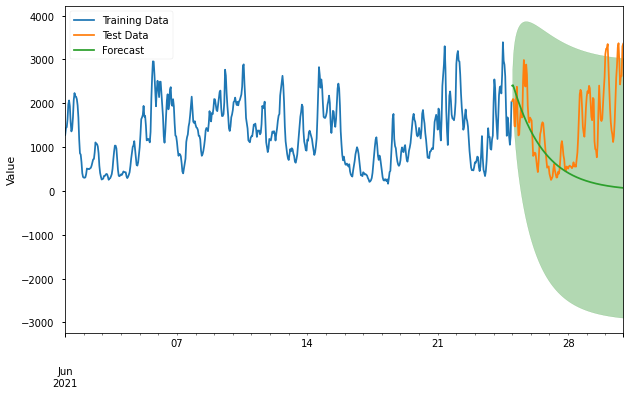

In [204]:
plot_train_test_forecast(train, test, forecast_df)

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:      Actual Aggregated   No. Observations:                  720
Model:               SARIMAX(2, 0, 1)   Log Likelihood               -4846.923
Date:                Wed, 21 Jul 2021   AIC                           9701.846
Time:                        17:13:15   BIC                           9720.163
Sample:                    06-01-2021   HQIC                          9708.918
                         - 06-30-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0671      0.052     20.490      0.000       0.965       1.169
ar.L2         -0.0890      0.053     -1.668      0.095      -0.194       0.016
ma.L1          0.5586      0.044     12.777      0.000       0.473       0.644
sigma2       4.09e+04   1510.763     27.073      0.000    3.79e+04    4.39e+04
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):               159.25
Prob(Q):                              0.87   Prob(JB):                         0.00
Heteroskedasticity (H):               2.93   Skew:                             0.18
Prob(H) (two-sided):                  0.00   Kurtosis:                         5.28
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



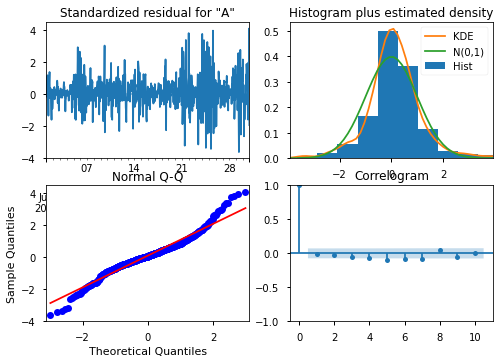

In [205]:
#Create and train SARIMAX model on the full time series
sarimax_model_full = tsa.SARIMAX(wind_ts, order=model.order,seasonal_order=model.seasonal_order,
                            enforce_stationarity=True).fit()
display(sarimax_model_full.summary())
sarimax_model_full.plot_diagnostics();

In [206]:
#Retrieve forecast for the next three days
forecast_df = retrieve_forecast(sarimax_model_full, steps=72)
forecast_df

,Lower CI,Upper CI,Forecast
2021-07-01 00:00:00+02:00,2675.0033,3467.7716,3071.3875
2021-07-01 01:00:00+02:00,2222.0899,3735.2040,2978.6470
2021-07-01 02:00:00+02:00,1906.2816,3904.2600,2905.2708
2021-07-01 03:00:00+02:00,1649.4396,4021.0037,2835.2217
2021-07-01 04:00:00+02:00,1427.2155,4106.7846,2767.0001
...,...,...,...
2021-07-06 19:00:00+02:00,-2991.4660,3198.1620,103.3480
2021-07-06 20:00:00+02:00,-2994.0358,3195.7593,100.8617
2021-07-06 21:00:00+02:00,-2996.5418,3193.4123,98.4353
2021-07-06 22:00:00+02:00,-2998.9856,3191.1200,96.0672


Figure save as images/Actual Aggregated_forecast.png


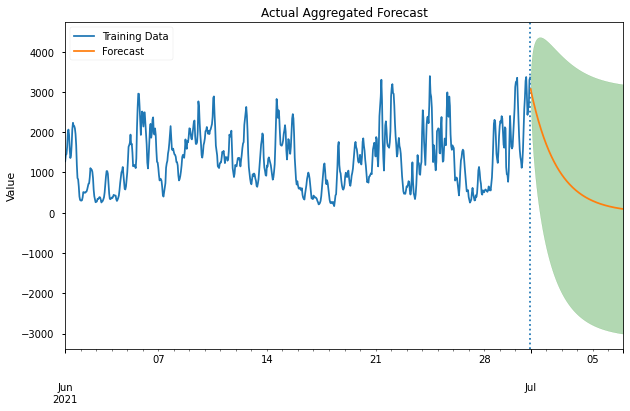

In [207]:
fig, ax = plot_time_series_forecast(wind_ts, forecast_df)

### Sktime

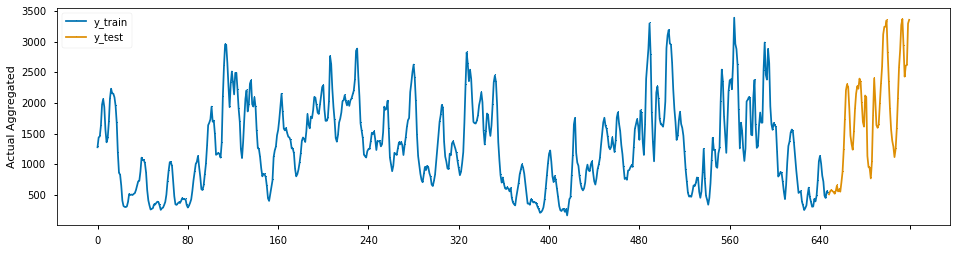

In [208]:
y = wind_ts.reset_index(drop=True)

y_train, y_test = temporal_train_test_split(y, test_size=72)
forecast_horizon = np.arange(y_test.shape[0]) + 1

plot_series(y_train, y_test, labels=["y_train", "y_test"], markers=[",", ","])
plt.show()

0.34415114764812604

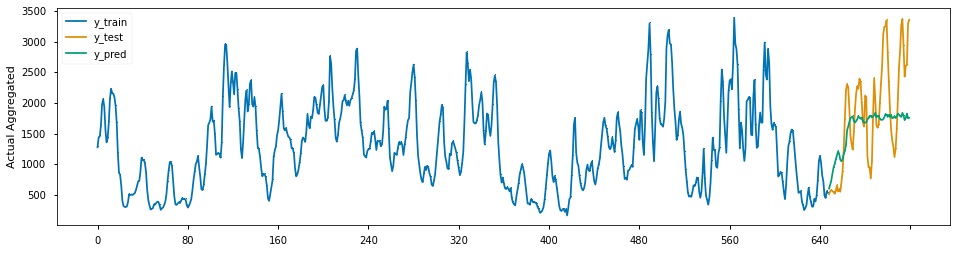

In [209]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

0.34653029980704

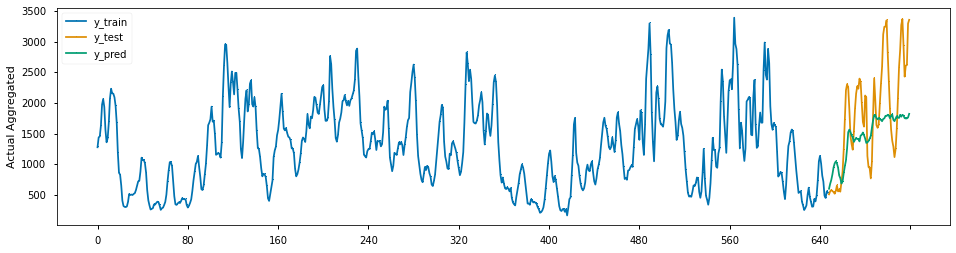

In [210]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
param_grid = {"window_length": [1, 5, 7]}

cv = SlidingWindowSplitter()
gscv = ForecastingGridSearchCV(forecaster, cv=cv, param_grid=param_grid)
gscv.fit(y_train, fh=forecast_horizon)
y_pred = gscv.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

In [156]:
gscv.best_params_

{'window_length': 7}

0.39626476501818575

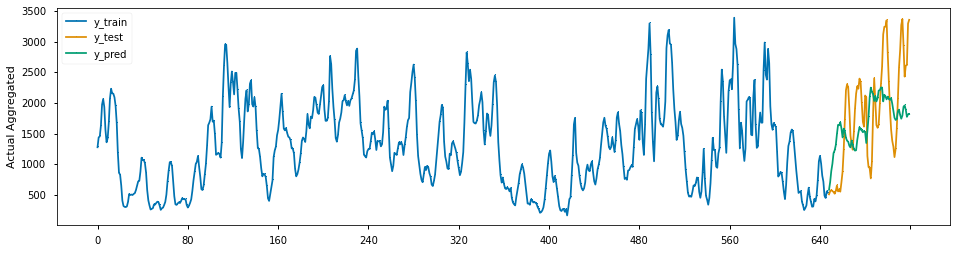

In [211]:
estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

fig, ax = plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

In [216]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator, window_length=10)
forecaster.fit(y, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='Actual Aggregated'>)

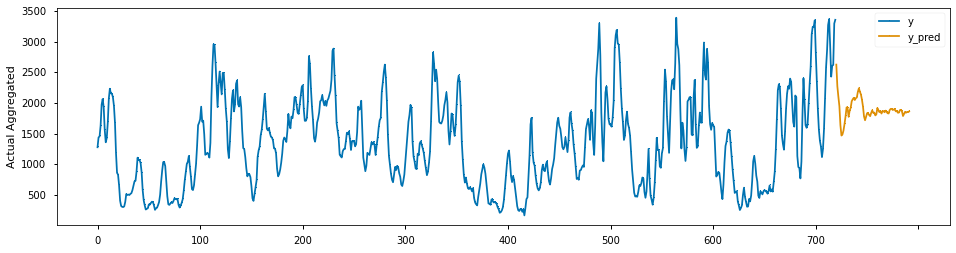

In [217]:
plot_series(y, y_pred, labels=["y", "y_pred"], markers=[",", ","])

## Spain

### SCRUB/EXPLORE

In [219]:
#Get data set for Spain
spain_df = get_energy_df('ES')
spain_df.head()

,Biomass,Fossil Brown coal/Lignite,Fossil Coal-derived gas,Fossil Gas,Fossil Hard coal,Fossil Oil,Fossil Oil shale,Fossil Peat,Geothermal,Hydro Pumped Storage,Hydro Run-of-river and poundage,Hydro Water Reservoir,Marine,Nuclear,Other,Other renewable,Solar,Waste,Wind Offshore,Wind Onshore
,Actual Aggregated,Actual Aggregated,Actual Aggregated,Actual Aggregated,Actual Aggregated,Actual Aggregated,Actual Aggregated,Actual Aggregated,Actual Aggregated,Actual Consumption,Actual Aggregated,Actual Aggregated,Actual Aggregated,Actual Aggregated,Actual Aggregated,Actual Aggregated,Actual Aggregated,Actual Aggregated,Actual Aggregated,Actual Aggregated
2021-06-01 00:00:00+02:00,403.0000,0.0000,0.0000,7938.0000,495.0000,163.0000,0.0000,0.0000,0.0000,0.0000,1180.0000,2275.0000,0.0000,4992.0000,14.0000,91.0000,220.0000,263.0000,0.0000,5759.0000
2021-06-01 01:00:00+02:00,405.0000,0.0000,0.0000,7827.0000,479.0000,163.0000,0.0000,0.0000,0.0000,2.0000,1068.0000,2136.0000,0.0000,4994.0000,16.0000,85.0000,166.0000,264.0000,0.0000,5444.0000
2021-06-01 02:00:00+02:00,404.0000,0.0000,0.0000,7798.0000,477.0000,151.0000,0.0000,0.0000,0.0000,0.0000,1066.0000,2057.0000,0.0000,4994.0000,16.0000,84.0000,101.0000,264.0000,0.0000,4727.0000
2021-06-01 03:00:00+02:00,408.0000,0.0000,0.0000,7491.0000,476.0000,148.0000,0.0000,0.0000,0.0000,0.0000,1054.0000,1857.0000,0.0000,4994.0000,16.0000,85.0000,100.0000,263.0000,0.0000,4804.0000
2021-06-01 04:00:00+02:00,418.0000,0.0000,0.0000,7479.0000,483.0000,148.0000,0.0000,0.0000,0.0000,0.0000,1069.0000,1991.0000,0.0000,4997.0000,16.0000,85.0000,100.0000,264.0000,0.0000,3956.0000


In [220]:
spain_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 720 entries, 2021-06-01 00:00:00+02:00 to 2021-06-30 23:00:00+02:00
Freq: 60T
Data columns (total 20 columns):
 #   Column                                                Non-Null Count  Dtype  
---  ------                                                --------------  -----  
 0   (Biomass, Actual Aggregated)                          720 non-null    float64
 1   (Fossil Brown coal/Lignite, Actual Aggregated)        720 non-null    float64
 2   (Fossil Coal-derived gas, Actual Aggregated)          720 non-null    float64
 3   (Fossil Gas, Actual Aggregated)                       720 non-null    float64
 4   (Fossil Hard coal, Actual Aggregated)                 720 non-null    float64
 5   (Fossil Oil, Actual Aggregated)                       720 non-null    float64
 6   (Fossil Oil shale, Actual Aggregated)                 720 non-null    float64
 7   (Fossil Peat, Actual Aggregated)                      720 non-null    float64
 8   (

In [221]:
#Drop unnecessary columns
cols = [0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,17]
spain_df.drop(spain_df.columns[cols],axis=1,inplace=True)
spain_df.head()

,Solar,Wind Offshore,Wind Onshore
,Actual Aggregated,Actual Aggregated,Actual Aggregated
2021-06-01 00:00:00+02:00,220.0000,0.0000,5759.0000
2021-06-01 01:00:00+02:00,166.0000,0.0000,5444.0000
2021-06-01 02:00:00+02:00,101.0000,0.0000,4727.0000
2021-06-01 03:00:00+02:00,100.0000,0.0000,4804.0000
2021-06-01 04:00:00+02:00,100.0000,0.0000,3956.0000


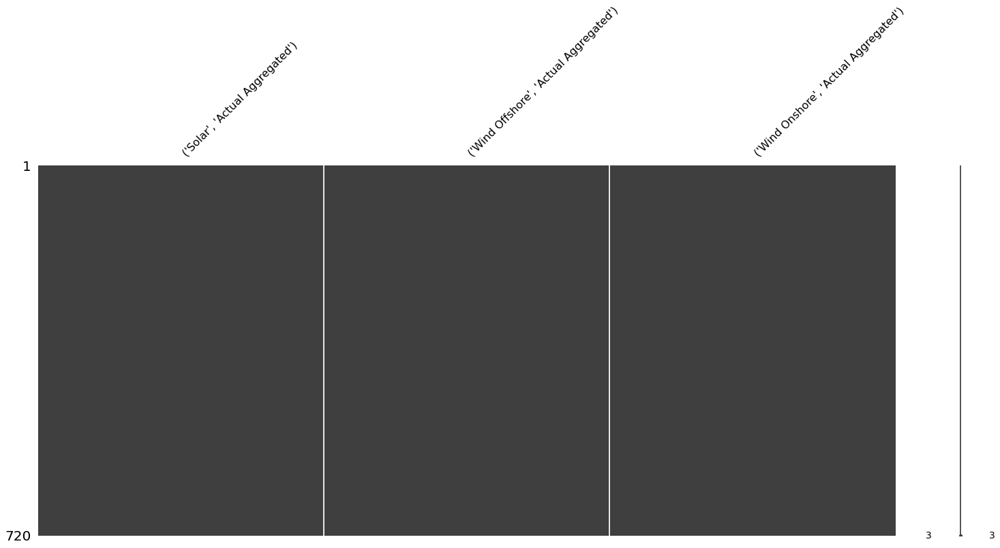

,,#null,%null
Solar,Actual Aggregated,0,0.0000
Wind Offshore,Actual Aggregated,0,0.0000
Wind Onshore,Actual Aggregated,0,0.0000


In [222]:
check_nulls(spain_df)

In [223]:
spain_df.index

DatetimeIndex(['2021-06-01 00:00:00+02:00', '2021-06-01 01:00:00+02:00',
               '2021-06-01 02:00:00+02:00', '2021-06-01 03:00:00+02:00',
               '2021-06-01 04:00:00+02:00', '2021-06-01 05:00:00+02:00',
               '2021-06-01 06:00:00+02:00', '2021-06-01 07:00:00+02:00',
               '2021-06-01 08:00:00+02:00', '2021-06-01 09:00:00+02:00',
               ...
               '2021-06-30 14:00:00+02:00', '2021-06-30 15:00:00+02:00',
               '2021-06-30 16:00:00+02:00', '2021-06-30 17:00:00+02:00',
               '2021-06-30 18:00:00+02:00', '2021-06-30 19:00:00+02:00',
               '2021-06-30 20:00:00+02:00', '2021-06-30 21:00:00+02:00',
               '2021-06-30 22:00:00+02:00', '2021-06-30 23:00:00+02:00'],
              dtype='datetime64[ns, Europe/Madrid]', length=720, freq='60T')

In [224]:
#freq = 60T so resample timeseries as hourly
spain_df = spain_df.resample('H').asfreq()
spain_df.index

DatetimeIndex(['2021-06-01 00:00:00+02:00', '2021-06-01 01:00:00+02:00',
               '2021-06-01 02:00:00+02:00', '2021-06-01 03:00:00+02:00',
               '2021-06-01 04:00:00+02:00', '2021-06-01 05:00:00+02:00',
               '2021-06-01 06:00:00+02:00', '2021-06-01 07:00:00+02:00',
               '2021-06-01 08:00:00+02:00', '2021-06-01 09:00:00+02:00',
               ...
               '2021-06-30 14:00:00+02:00', '2021-06-30 15:00:00+02:00',
               '2021-06-30 16:00:00+02:00', '2021-06-30 17:00:00+02:00',
               '2021-06-30 18:00:00+02:00', '2021-06-30 19:00:00+02:00',
               '2021-06-30 20:00:00+02:00', '2021-06-30 21:00:00+02:00',
               '2021-06-30 22:00:00+02:00', '2021-06-30 23:00:00+02:00'],
              dtype='datetime64[ns, Europe/Madrid]', length=720, freq='H')

<AxesSubplot:>

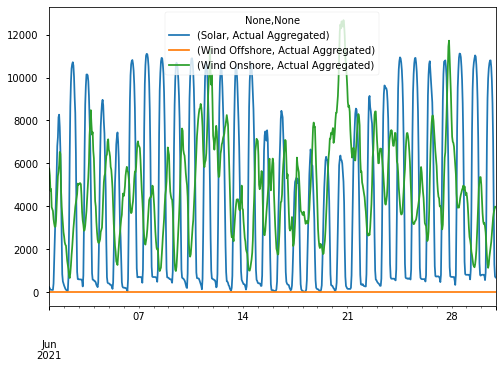

In [225]:
spain_df.plot()

### Solar Modeling

<AxesSubplot:>

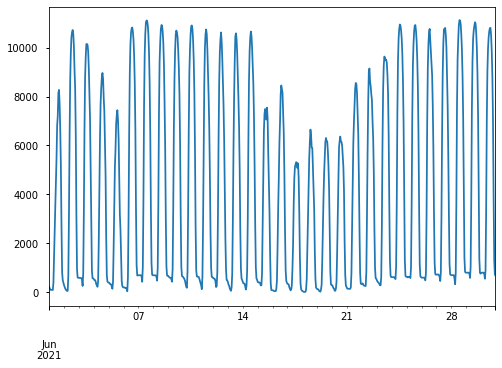

In [226]:
solar_ts = spain_df['Solar']['Actual Aggregated']
solar_ts.plot()

In [227]:
train, test = train_test_split(solar_ts)

576

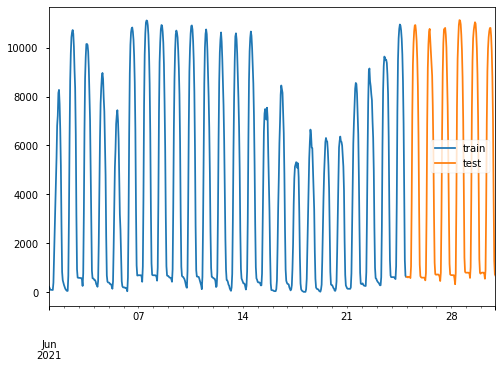

In [228]:
plot_train_test_split(train, test);

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-2.0201,19,556,0.2778,False,False


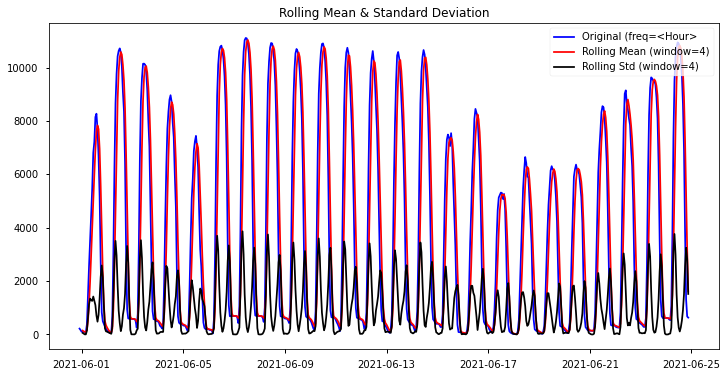

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-2.0201,19,556,0.2778,False,False


In [229]:
#Check time series for stationarity
stationarity_check(train)

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-22.5708,19,555,0.0000,True,True


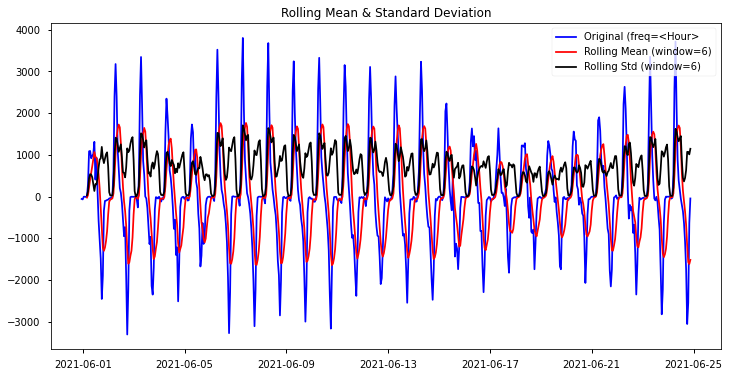

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-22.5708,19,555,0.0000,True,True


In [230]:
#Check if differencing time series will result in stationarity
stationarity_check(train.diff().dropna(), window=6)

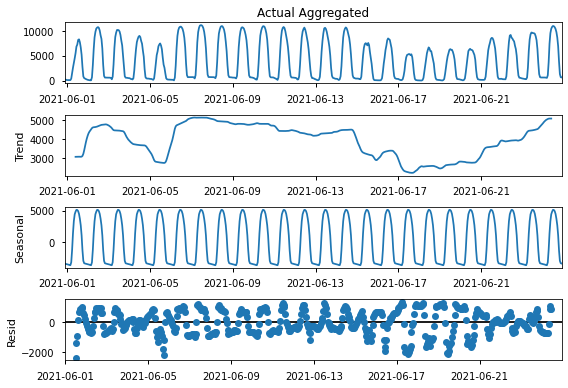

In [231]:
#Create seasonal decomposition of time series to check for seasonality
decompose = tsa.seasonal_decompose(train)
decompose.plot();

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[4] intercept   : AIC=9750.770, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[4] intercept   : AIC=9041.080, Time=0.10 sec
 ARIMA(0,1,1)(0,0,1)[4] intercept   : AIC=9147.814, Time=0.35 sec
 ARIMA(0,1,0)(0,0,0)[4]             : AIC=9748.771, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[4] intercept   : AIC=9047.157, Time=0.03 sec
 ARIMA(1,1,0)(2,0,0)[4] intercept   : AIC=9042.584, Time=0.18 sec
 ARIMA(1,1,0)(1,0,1)[4] intercept   : AIC=9006.832, Time=0.34 sec
 ARIMA(1,1,0)(0,0,1)[4] intercept   : AIC=9038.990, Time=0.10 sec
 ARIMA(1,1,0)(2,0,1)[4] intercept   : AIC=8994.906, Time=0.54 sec
 ARIMA(1,1,0)(2,0,2)[4] intercept   : AIC=inf, Time=1.03 sec
 ARIMA(1,1,0)(1,0,2)[4] intercept   : AIC=9004.362, Time=0.54 sec
 ARIMA(0,1,0)(2,0,1)[4] intercept   : AIC=9454.276, Time=0.60 sec
 ARIMA(2,1,0)(2,0,1)[4] intercept   : AIC=8739.761, Time=0.70 sec
 ARIMA(2,1,0)(1,0,1)[4] intercept   : AIC=8845.578, Time=0.17 sec
 ARIMA(2,1,0)(2,0,0)[4] intercept   : 

<class 'statsmodels.iolib.summary.Summary'>
"""
                                       SARIMAX Results                                        
==============================================================================================
Dep. Variable:                                      y   No. Observations:                  576
Model:             SARIMAX(2, 1, 3)x(2, 0, [1, 2], 4)   Log Likelihood               -4252.665
Date:                                Wed, 21 Jul 2021   AIC                           8525.331
Time:                                        17:46:07   BIC                           8568.874
Sample:                                             0   HQIC                          8542.314
                                                - 576                                         
Covariance Type:                                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3971      0.103     13.519      0.000       1.195       1.600
ar.L2         -0.7038      0.098     -7.214      0.000      -0.895      -0.513
ma.L1         -0.4261      0.124     -3.447      0.001      -0.668      -0.184
ma.L2         -0.2933      0.087     -3.367      0.001      -0.464      -0.123
ma.L3         -0.1491      0.123     -1.215      0.224      -0.390       0.091
ar.S.L4        0.9980      0.006    178.724      0.000       0.987       1.009
ar.S.L8       -0.9966      0.004   -273.276      0.000      -1.004      -0.989
ma.S.L4       -0.9475      0.049    -19.324      0.000      -1.044      -0.851
ma.S.L8        0.8983      0.050     17.993      0.000       0.800       0.996
sigma2       2.49e+05   2.37e+04     10.505      0.000    2.03e+05    2.95e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.12   Jarque-Bera (JB):                10.21
Prob(Q):                              0.73   Prob(JB):                         0.01
Heteroskedasticity (H):               0.74   Skew:                            -0.08
Prob(H) (two-sided):                  0.04   Kurtosis:                         3.63
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



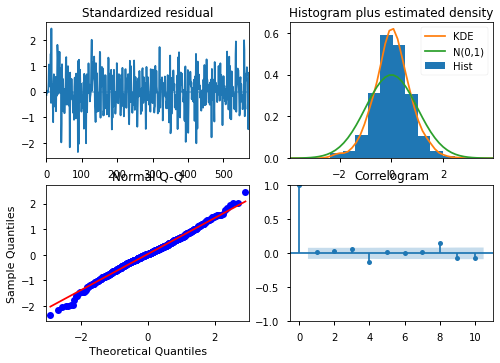

In [232]:
#Create first ARIMA model using auto arima to gridsearch for parameters
model = pmd.auto_arima(train, start_p=0, start_P=0, start_q=0, start_Q=0, m=4, d=1, trace=True)
display(model.summary())
model.plot_diagnostics();

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



<class 'statsmodels.iolib.summary.Summary'>
"""
                                       SARIMAX Results                                        
==============================================================================================
Dep. Variable:                      Actual Aggregated   No. Observations:                  576
Model:             SARIMAX(2, 1, 3)x(2, 0, [1, 2], 4)   Log Likelihood               -4252.665
Date:                                Wed, 21 Jul 2021   AIC                           8525.331
Time:                                        17:46:09   BIC                           8568.874
Sample:                                    06-01-2021   HQIC                          8542.314
                                         - 06-24-2021                                         
Covariance Type:                                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.3971      0.103     13.519      0.000       1.195       1.600
ar.L2         -0.7038      0.098     -7.214      0.000      -0.895      -0.513
ma.L1         -0.4261      0.124     -3.447      0.001      -0.668      -0.184
ma.L2         -0.2933      0.087     -3.367      0.001      -0.464      -0.123
ma.L3         -0.1491      0.123     -1.215      0.224      -0.390       0.091
ar.S.L4        0.9980      0.006    178.724      0.000       0.987       1.009
ar.S.L8       -0.9966      0.004   -273.276      0.000      -1.004      -0.989
ma.S.L4       -0.9475      0.049    -19.324      0.000      -1.044      -0.851
ma.S.L8        0.8983      0.050     17.993      0.000       0.800       0.996
sigma2       2.49e+05   2.37e+04     10.505      0.000    2.03e+05    2.95e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.12   Jarque-Bera (JB):                10.21
Prob(Q):                              0.73   Prob(JB):                         0.01
Heteroskedasticity (H):               0.74   Skew:                            -0.08
Prob(H) (two-sided):                  0.04   Kurtosis:                         3.63
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



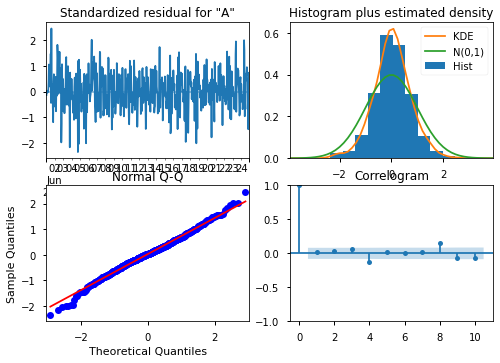

In [233]:
#Create SARIMAX model using determined parameters
sarimax_model = tsa.SARIMAX(train, order=model.order, seasonal_order=model.seasonal_order, enforce_stationarity=True).fit()
display(sarimax_model.summary())
sarimax_model.plot_diagnostics();

In [234]:
forecast_df = retrieve_forecast(sarimax_model, steps=len(test))
forecast_df

,Lower CI,Upper CI,Forecast
2021-06-25 00:00:00+02:00,-501.7548,1454.2758,476.2605
2021-06-25 01:00:00+02:00,-1813.2012,2509.8892,348.3440
2021-06-25 02:00:00+02:00,-2630.9110,3651.3215,510.2052
2021-06-25 03:00:00+02:00,-2847.7245,4552.9660,852.6207
2021-06-25 04:00:00+02:00,-2401.3315,5447.1538,1522.9111
...,...,...,...
2021-06-30 19:00:00+02:00,195.6135,12468.2758,6331.9446
2021-06-30 20:00:00+02:00,-1302.9067,10997.4612,4847.2773
2021-06-30 21:00:00+02:00,-2849.4037,9486.6123,3318.6043
2021-06-30 22:00:00+02:00,-3696.7160,8677.7410,2490.5125


(<Figure size 720x432 with 1 Axes>, <AxesSubplot:ylabel='Value'>)

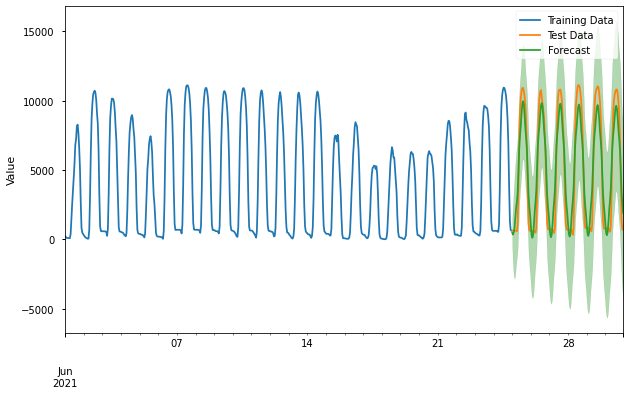

In [235]:
plot_train_test_forecast(train, test, forecast_df)

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:966: UserWarning:

Non-stationary starting autoregressive parameters found. Using zeros as starting parameters.

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\tsa\statespace\sarimax.py:978: UserWarning:

Non-invertible starting MA parameters found. Using zeros as starting parameters.

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\base\model.py:566: ConvergenceWarning:

Maximum Likelihood optimization failed to converge. Check mle_retvals



<class 'statsmodels.iolib.summary.Summary'>
"""
                                       SARIMAX Results                                        
==============================================================================================
Dep. Variable:                      Actual Aggregated   No. Observations:                  720
Model:             SARIMAX(2, 1, 3)x(2, 0, [1, 2], 4)   Log Likelihood               -5329.549
Date:                                Wed, 21 Jul 2021   AIC                          10679.098
Time:                                        17:46:12   BIC                          10724.876
Sample:                                    06-01-2021   HQIC                         10696.772
                                         - 06-30-2021                                         
Covariance Type:                                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.4306      0.073     19.730      0.000       1.289       1.573
ar.L2         -0.8172      0.067    -12.256      0.000      -0.948      -0.687
ma.L1         -0.4622      0.101     -4.556      0.000      -0.661      -0.263
ma.L2         -0.1774      0.087     -2.033      0.042      -0.348      -0.006
ma.L3         -0.1183      0.101     -1.173      0.241      -0.316       0.079
ar.S.L4        0.9956      0.008    131.697      0.000       0.981       1.010
ar.S.L8       -0.9941      0.006   -180.624      0.000      -1.005      -0.983
ma.S.L4       -0.9064      0.064    -14.269      0.000      -1.031      -0.782
ma.S.L8        0.8288      0.059     14.113      0.000       0.714       0.944
sigma2      2.683e+05   2.39e+04     11.205      0.000    2.21e+05    3.15e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.03   Jarque-Bera (JB):                 7.55
Prob(Q):                              0.86   Prob(JB):                         0.02
Heteroskedasticity (H):               0.80   Skew:                            -0.14
Prob(H) (two-sided):                  0.08   Kurtosis:                         3.42
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



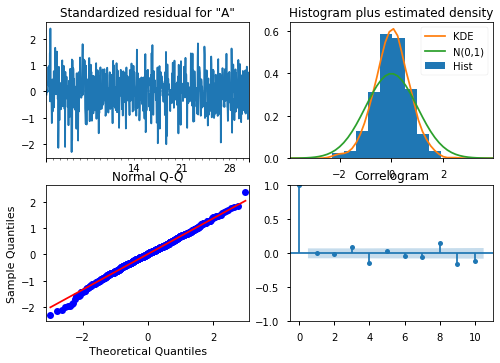

In [236]:
#Create and train SARIMAX model on the full time series
sarimax_model_full = tsa.SARIMAX(solar_ts, order=model.order,seasonal_order=model.seasonal_order,
                            enforce_stationarity=True).fit()
display(sarimax_model_full.summary())
sarimax_model_full.plot_diagnostics();

In [237]:
#Retrieve forecast for the next three days
forecast_df = retrieve_forecast(sarimax_model_full, steps=72)
forecast_df

,Lower CI,Upper CI,Forecast
2021-07-01 00:00:00+02:00,-771.4861,1258.8219,243.6679
2021-07-01 01:00:00+02:00,-2582.8830,1899.8249,-341.5290
2021-07-01 02:00:00+02:00,-3768.1249,2792.4528,-487.8361
2021-07-01 03:00:00+02:00,-4232.2073,3492.9338,-369.6367
2021-07-01 04:00:00+02:00,-3756.8507,4391.9961,317.5727
...,...,...,...
2021-07-06 19:00:00+02:00,-1593.6122,14579.2387,6492.8133
2021-07-06 20:00:00+02:00,-3408.3822,12806.4642,4699.0410
2021-07-06 21:00:00+02:00,-5353.7656,10915.4644,2780.8494
2021-07-06 22:00:00+02:00,-6247.7447,10080.0995,1916.1774


Figure save as images/Actual Aggregated_forecast.png


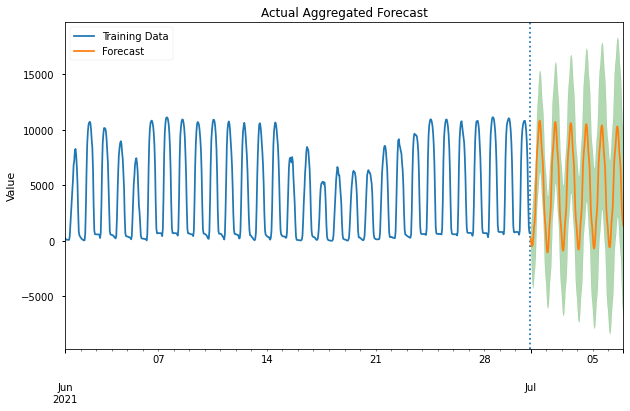

In [238]:
fig, ax = plot_time_series_forecast(solar_ts, forecast_df)

### Sktime

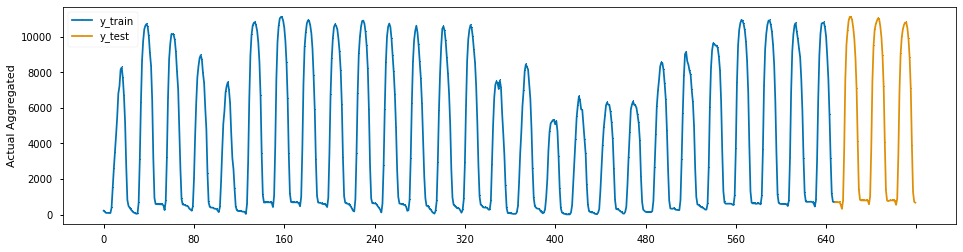

In [239]:
y = solar_ts.reset_index(drop=True)

y_train, y_test = temporal_train_test_split(y, test_size=72)
forecast_horizon = np.arange(y_test.shape[0]) + 1

plot_series(y_train, y_test, labels=["y_train", "y_test"], markers=[",", ","])
plt.show()

0.14504989375980915

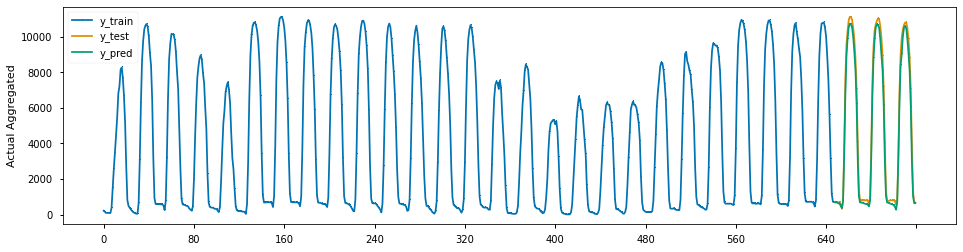

In [240]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

0.14428738221573445

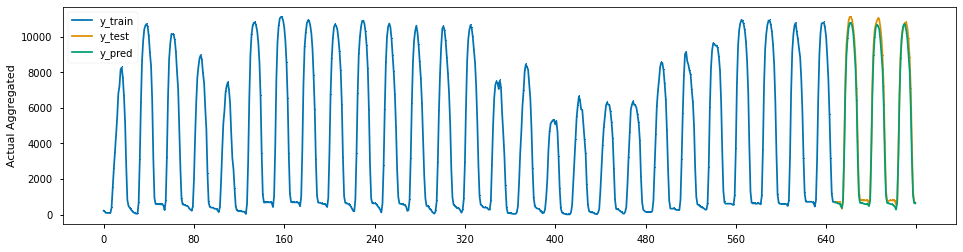

In [241]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
param_grid = {"window_length": [1, 5, 7]}

cv = SlidingWindowSplitter()
gscv = ForecastingGridSearchCV(forecaster, cv=cv, param_grid=param_grid)
gscv.fit(y_train, fh=forecast_horizon)
y_pred = gscv.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

In [242]:
gscv.best_params_

{'window_length': 7}

(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='Actual Aggregated'>)

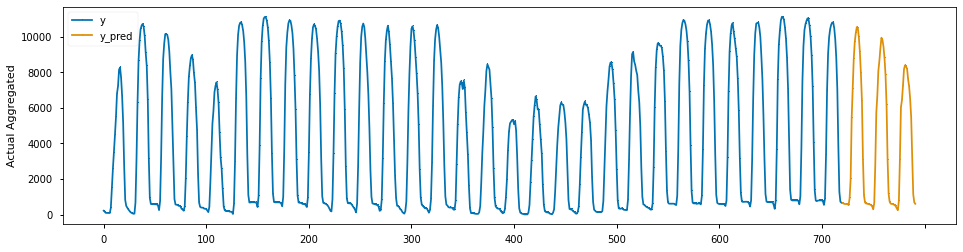

In [243]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator, window_length=7)
forecaster.fit(y, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y, y_pred, labels=["y", "y_pred"], markers=[",", ","])

### Onshore Wind Modeling

<AxesSubplot:>

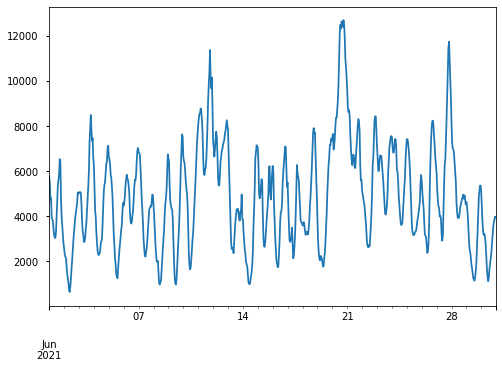

In [244]:
wind_ts = spain_df['Wind Onshore']['Actual Aggregated']
wind_ts.plot()

In [245]:
train, test = train_test_split(wind_ts)

576

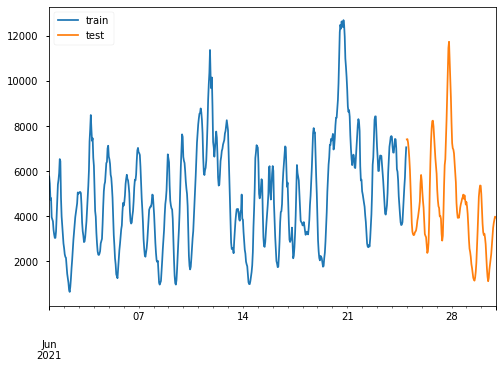

In [246]:
plot_train_test_split(train, test);

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-2.9691,14,561,0.0379,True,True


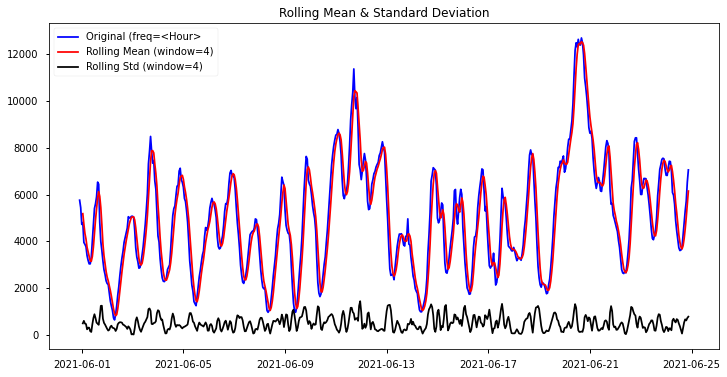

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-2.9691,14,561,0.0379,True,True


In [247]:
#Check time series for stationarity
stationarity_check(train)

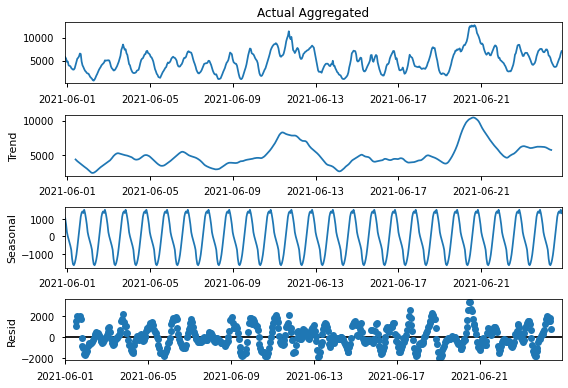

In [248]:
#Create seasonal decomposition of time series to check for seasonality
decompose = tsa.seasonal_decompose(train)
decompose.plot();

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=8814.679, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=8460.163, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=8540.737, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=8812.691, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[7] intercept   : AIC=8459.520, Time=0.08 sec
 ARIMA(1,1,0)(0,0,1)[7] intercept   : AIC=8459.800, Time=0.10 sec
 ARIMA(1,1,0)(1,0,1)[7] intercept   : AIC=8456.232, Time=0.40 sec
 ARIMA(1,1,0)(2,0,1)[7] intercept   : AIC=8455.925, Time=0.34 sec
 ARIMA(1,1,0)(2,0,0)[7] intercept   : AIC=8455.134, Time=0.23 sec
 ARIMA(0,1,0)(2,0,0)[7] intercept   : AIC=8726.666, Time=0.42 sec
 ARIMA(2,1,0)(2,0,0)[7] intercept   : AIC=8456.390, Time=0.30 sec
 ARIMA(1,1,1)(2,0,0)[7] intercept   : AIC=8456.198, Time=0.28 sec
 ARIMA(0,1,1)(2,0,0)[7] intercept   : AIC=8516.913, Time=0.47 sec
 ARIMA(2,1,1)(2,0,0)[7] intercept   : AIC=8455.185, Time=0.50 sec
 ARIMA(1,1,0)(2,0,0)[7]          

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                                 y   No. Observations:                  576
Model:             SARIMAX(1, 1, 0)x(2, 0, 0, 7)   Log Likelihood               -4222.557
Date:                           Wed, 21 Jul 2021   AIC                           8453.113
Time:                                   17:57:16   BIC                           8470.531
Sample:                                        0   HQIC                          8459.907
                                           - 576                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6485      0.029     22.282      0.000       0.591       0.706
ar.S.L7       -0.0589      0.041     -1.449      0.147      -0.139       0.021
ar.S.L14      -0.1157      0.050     -2.326      0.020      -0.213      -0.018
sigma2      1.408e+05   5712.001     24.657      0.000     1.3e+05    1.52e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.62   Jarque-Bera (JB):               292.56
Prob(Q):                              0.43   Prob(JB):                         0.00
Heteroskedasticity (H):               1.26   Skew:                            -1.06
Prob(H) (two-sided):                  0.11   Kurtosis:                         5.77
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



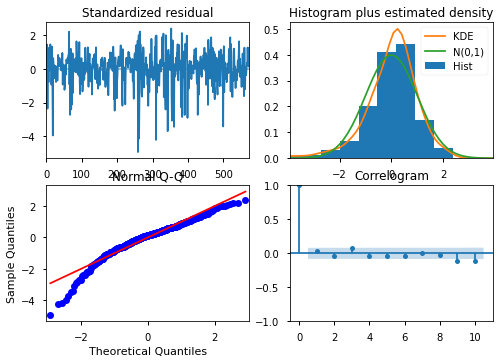

In [249]:
#Create first ARIMA model using auto arima to gridsearch for parameters
model = pmd.auto_arima(train, start_p=0, start_P=0, start_q=0, start_Q=0, m=7, trace=True)
display(model.summary())
model.plot_diagnostics();

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                 Actual Aggregated   No. Observations:                  576
Model:             SARIMAX(1, 1, 0)x(2, 0, 0, 7)   Log Likelihood               -4222.557
Date:                           Wed, 21 Jul 2021   AIC                           8453.113
Time:                                   17:57:17   BIC                           8470.531
Sample:                               06-01-2021   HQIC                          8459.907
                                    - 06-24-2021                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6485      0.029     22.282      0.000       0.591       0.706
ar.S.L7       -0.0589      0.041     -1.449      0.147      -0.139       0.021
ar.S.L14      -0.1157      0.050     -2.326      0.020      -0.213      -0.018
sigma2      1.408e+05   5712.001     24.657      0.000     1.3e+05    1.52e+05
===================================================================================
Ljung-Box (L1) (Q):                   0.62   Jarque-Bera (JB):               292.56
Prob(Q):                              0.43   Prob(JB):                         0.00
Heteroskedasticity (H):               1.26   Skew:                            -1.06
Prob(H) (two-sided):                  0.11   Kurtosis:                         5.77
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



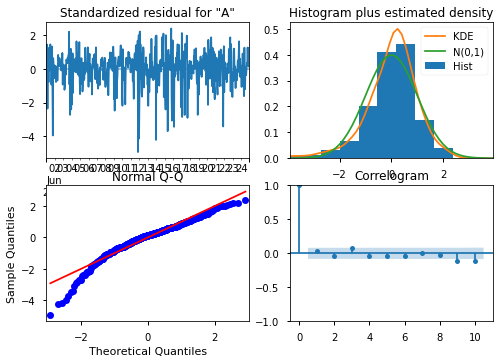

In [250]:
#Create SARIMAX model using determined parameters
sarimax_model = tsa.SARIMAX(train, order=model.order, seasonal_order=model.seasonal_order, enforce_stationarity=True).fit()
display(sarimax_model.summary())
sarimax_model.plot_diagnostics();

In [251]:
forecast_df = retrieve_forecast(sarimax_model, steps=len(test))
forecast_df

,Lower CI,Upper CI,Forecast
2021-06-25 00:00:00+02:00,6688.1887,8159.2947,7423.7417
2021-06-25 01:00:00+02:00,6271.2980,9107.7309,7689.5144
2021-06-25 02:00:00+02:00,5768.3707,9928.9046,7848.6377
2021-06-25 03:00:00+02:00,5252.5371,10654.2145,7953.3758
2021-06-25 04:00:00+02:00,4752.6919,11303.0033,8027.8476
...,...,...,...
2021-06-30 19:00:00+02:00,-13524.9282,28688.2648,7581.6683
2021-06-30 20:00:00+02:00,-13599.9871,28763.3237,7581.6683
2021-06-30 21:00:00+02:00,-13674.7810,28838.1176,7581.6683
2021-06-30 22:00:00+02:00,-13749.3126,28912.6493,7581.6683


(<Figure size 720x432 with 1 Axes>, <AxesSubplot:ylabel='Value'>)

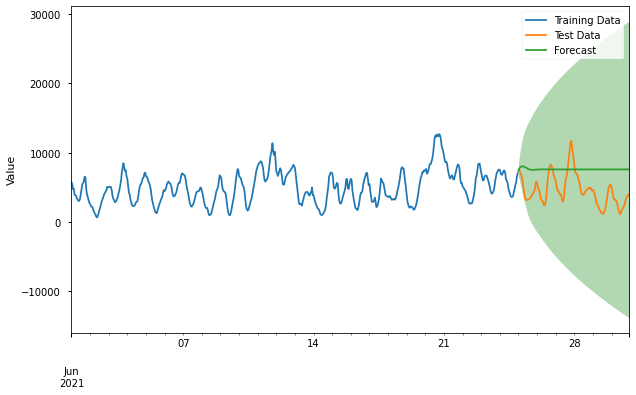

In [252]:
plot_train_test_forecast(train, test, forecast_df)

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                     
=========================================================================================
Dep. Variable:                 Actual Aggregated   No. Observations:                  720
Model:             SARIMAX(1, 1, 0)x(2, 0, 0, 7)   Log Likelihood               -5245.462
Date:                           Wed, 21 Jul 2021   AIC                          10498.923
Time:                                   17:57:17   BIC                          10517.235
Sample:                               06-01-2021   HQIC                         10505.993
                                    - 06-30-2021                                         
Covariance Type:                             opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.6808      0.025     27.570      0.000       0.632       0.729
ar.S.L7       -0.0495      0.035     -1.411      0.158      -0.118       0.019
ar.S.L14      -0.1139      0.043     -2.666      0.008      -0.198      -0.030
sigma2      1.279e+05   4493.858     28.471      0.000    1.19e+05    1.37e+05
===================================================================================
Ljung-Box (L1) (Q):                   2.01   Jarque-Bera (JB):               389.34
Prob(Q):                              0.16   Prob(JB):                         0.00
Heteroskedasticity (H):               0.86   Skew:                            -0.98
Prob(H) (two-sided):                  0.26   Kurtosis:                         6.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



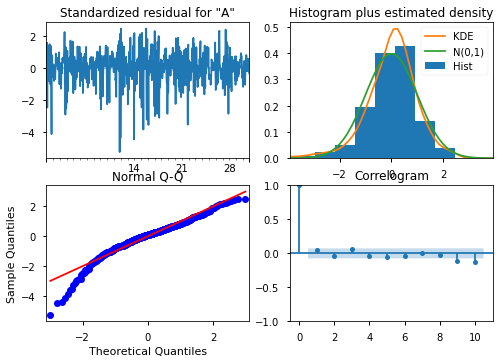

In [253]:
#Create and train SARIMAX model on the full time series
sarimax_model_full = tsa.SARIMAX(wind_ts, order=model.order,seasonal_order=model.seasonal_order,
                            enforce_stationarity=True).fit()
display(sarimax_model_full.summary())
sarimax_model_full.plot_diagnostics();

In [254]:
#Retrieve forecast for the next three days
forecast_df = retrieve_forecast(sarimax_model_full, steps=72)
forecast_df

,Lower CI,Upper CI,Forecast
2021-07-01 00:00:00+02:00,3231.7179,4633.8424,3932.7801
2021-07-01 01:00:00+02:00,2535.9547,5278.1885,3907.0716
2021-07-01 02:00:00+02:00,1814.2652,5883.5341,3848.8996
2021-07-01 03:00:00+02:00,1114.9385,6449.1621,3782.0503
2021-07-01 04:00:00+02:00,479.5991,7000.1154,3739.8572
...,...,...,...
2021-07-06 19:00:00+02:00,-18773.6257,25856.6770,3541.5256
2021-07-06 20:00:00+02:00,-18853.3267,25936.3780,3541.5256
2021-07-06 21:00:00+02:00,-18932.7450,26015.7963,3541.5256
2021-07-06 22:00:00+02:00,-19011.8836,26094.9349,3541.5256


Figure save as images/Actual Aggregated_forecast.png


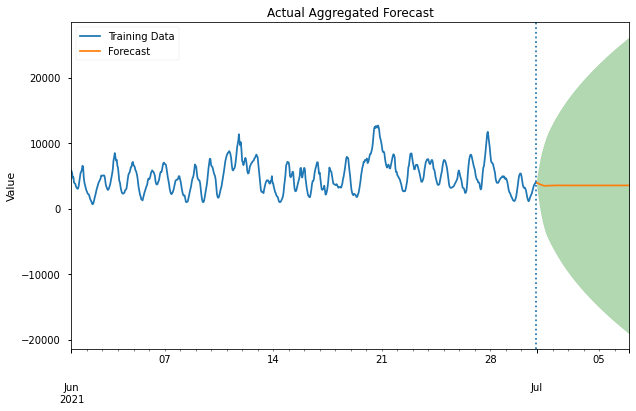

In [255]:
fig, ax = plot_time_series_forecast(wind_ts, forecast_df)

### Sktime

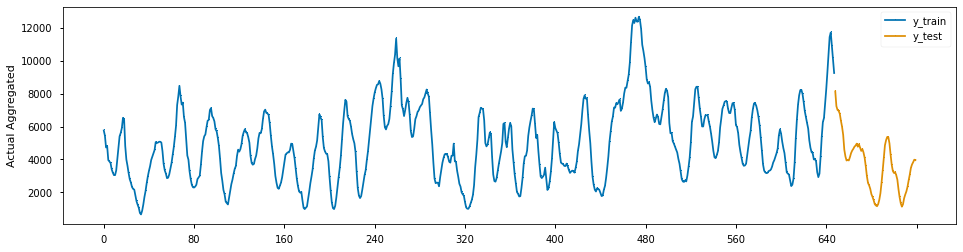

In [256]:
y = wind_ts.reset_index(drop=True)

y_train, y_test = temporal_train_test_split(y, test_size=72)
forecast_horizon = np.arange(y_test.shape[0]) + 1

plot_series(y_train, y_test, labels=["y_train", "y_test"], markers=[",", ","])
plt.show()

0.6291445362000485

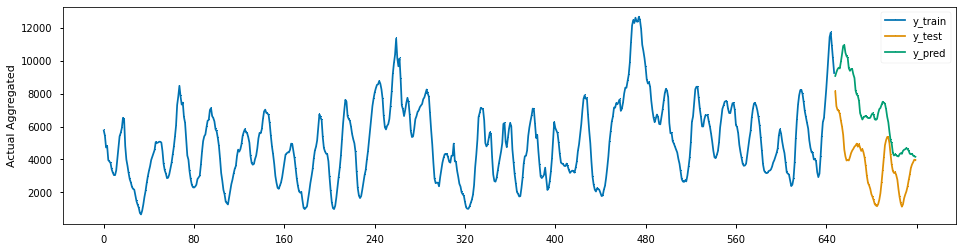

In [257]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

0.6442451924640434

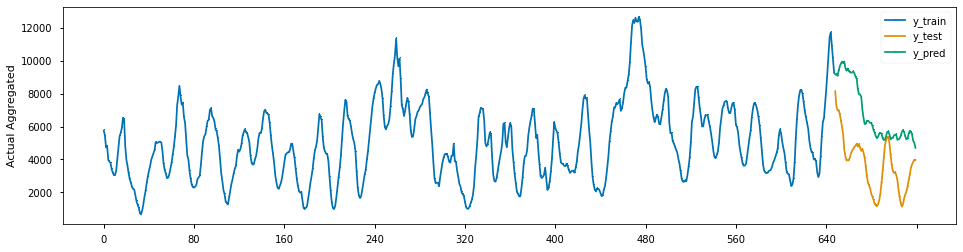

In [258]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
param_grid = {"window_length": [1, 5, 7]}

cv = SlidingWindowSplitter()
gscv = ForecastingGridSearchCV(forecaster, cv=cv, param_grid=param_grid)
gscv.fit(y_train, fh=forecast_horizon)
y_pred = gscv.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

In [259]:
gscv.best_params_

{'window_length': 7}

0.4159069765915308

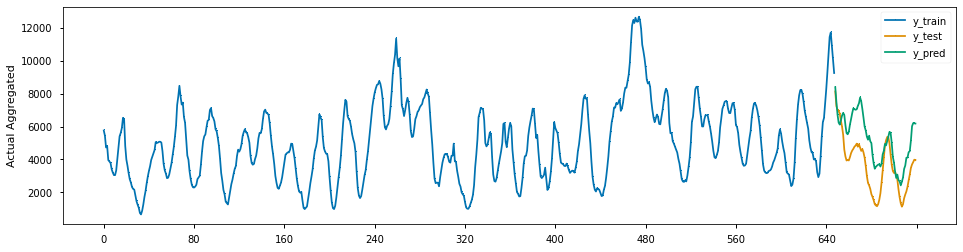

In [260]:
estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

fig, ax = plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

0.5196579127603842

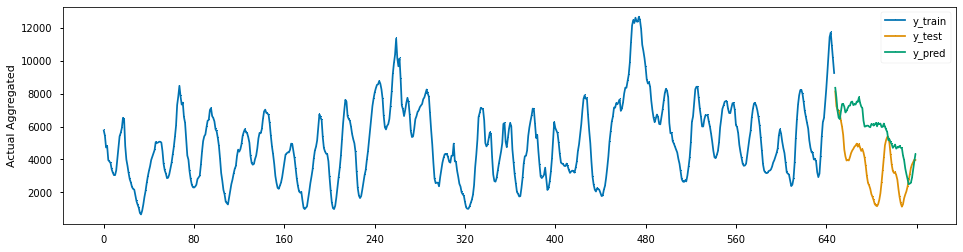

In [261]:
estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
param_grid = {"window_length": [1, 5, 7]}

cv = SlidingWindowSplitter()
gscv = ForecastingGridSearchCV(forecaster, cv=cv, param_grid=param_grid)
gscv.fit(y_train, fh=forecast_horizon)
y_pred = gscv.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

In [262]:
gscv.best_params_

{'window_length': 7}

(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='Actual Aggregated'>)

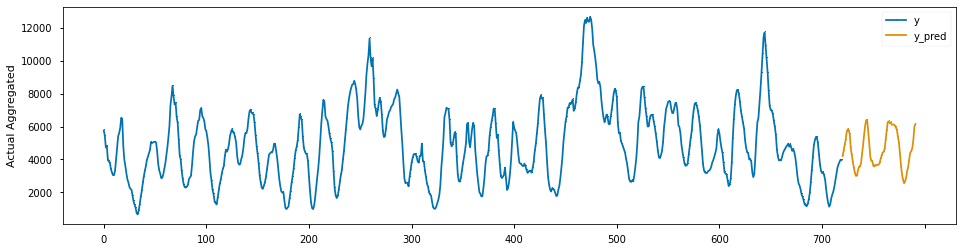

In [263]:
estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y, y_pred, labels=["y", "y_pred"], markers=[",", ","])

## Netherlands

### SCRUB/EXPLORE

In [264]:
#Get data set for the Netherlands
netherlands_df = get_energy_df('NL')
netherlands_df.head()

Biomass  ...       Wind Onshore
                          Actual Aggregated  ... Actual Consumption
2021-06-01 00:00:00+02:00           33.0000  ...             0.0000
2021-06-01 00:15:00+02:00           34.0000  ...             0.0000
2021-06-01 00:30:00+02:00           34.0000  ...             0.0000
2021-06-01 00:45:00+02:00           34.0000  ...             0.0000
2021-06-01 01:00:00+02:00           34.0000  ...             0.0000

[5 rows x 20 columns]

In [265]:
netherlands_df.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 2880 entries, 2021-06-01 00:00:00+02:00 to 2021-06-30 23:45:00+02:00
Freq: 15T
Data columns (total 20 columns):
 #   Column                                                 Non-Null Count  Dtype  
---  ------                                                 --------------  -----  
 0   (Biomass, Actual Aggregated)                           2880 non-null   float64
 1   (Biomass, Actual Consumption)                          2880 non-null   float64
 2   (Fossil Gas, Actual Aggregated)                        2880 non-null   float64
 3   (Fossil Gas, Actual Consumption)                       2880 non-null   float64
 4   (Fossil Hard coal, Actual Aggregated)                  2880 non-null   float64
 5   (Fossil Hard coal, Actual Consumption)                 2880 non-null   float64
 6   (Hydro Run-of-river and poundage, Actual Aggregated)   2880 non-null   float64
 7   (Hydro Run-of-river and poundage, Actual Consumption)  2880 non-null   flo

In [266]:
#Drop unnecessary columns
cols = [0,1,2,3,4,5,6,7,8,9,10,11,13,14,15,17,19]
netherlands_df.drop(netherlands_df.columns[cols],axis=1,inplace=True)
netherlands_df.head()

,Solar,Wind Offshore,Wind Onshore
,Actual Aggregated,Actual Aggregated,Actual Aggregated
2021-06-01 00:00:00+02:00,0.0000,795.0000,447.0000
2021-06-01 00:15:00+02:00,0.0000,781.0000,449.0000
2021-06-01 00:30:00+02:00,0.0000,768.0000,450.0000
2021-06-01 00:45:00+02:00,0.0000,774.0000,470.0000
2021-06-01 01:00:00+02:00,0.0000,752.0000,484.0000


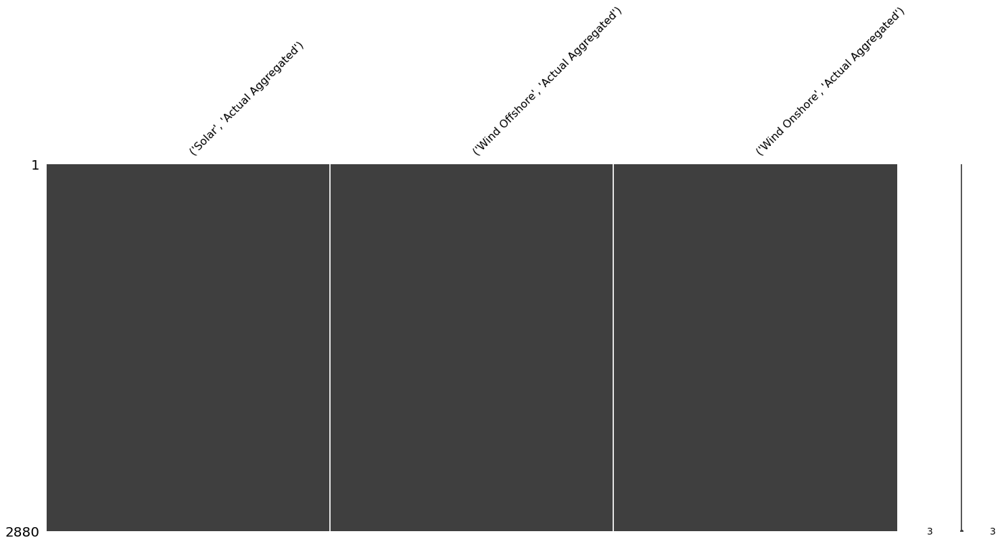

,,#null,%null
Solar,Actual Aggregated,0,0.0000
Wind Offshore,Actual Aggregated,0,0.0000
Wind Onshore,Actual Aggregated,0,0.0000


In [267]:
check_nulls(netherlands_df)

In [268]:
netherlands_df.index

DatetimeIndex(['2021-06-01 00:00:00+02:00', '2021-06-01 00:15:00+02:00',
               '2021-06-01 00:30:00+02:00', '2021-06-01 00:45:00+02:00',
               '2021-06-01 01:00:00+02:00', '2021-06-01 01:15:00+02:00',
               '2021-06-01 01:30:00+02:00', '2021-06-01 01:45:00+02:00',
               '2021-06-01 02:00:00+02:00', '2021-06-01 02:15:00+02:00',
               ...
               '2021-06-30 21:30:00+02:00', '2021-06-30 21:45:00+02:00',
               '2021-06-30 22:00:00+02:00', '2021-06-30 22:15:00+02:00',
               '2021-06-30 22:30:00+02:00', '2021-06-30 22:45:00+02:00',
               '2021-06-30 23:00:00+02:00', '2021-06-30 23:15:00+02:00',
               '2021-06-30 23:30:00+02:00', '2021-06-30 23:45:00+02:00'],
              dtype='datetime64[ns, Europe/Amsterdam]', length=2880, freq='15T')

In [269]:
#freq = 15T so resample timeseries as hourly
netherlands_df = netherlands_df.resample('H').asfreq()
netherlands_df.index

DatetimeIndex(['2021-06-01 00:00:00+02:00', '2021-06-01 01:00:00+02:00',
               '2021-06-01 02:00:00+02:00', '2021-06-01 03:00:00+02:00',
               '2021-06-01 04:00:00+02:00', '2021-06-01 05:00:00+02:00',
               '2021-06-01 06:00:00+02:00', '2021-06-01 07:00:00+02:00',
               '2021-06-01 08:00:00+02:00', '2021-06-01 09:00:00+02:00',
               ...
               '2021-06-30 14:00:00+02:00', '2021-06-30 15:00:00+02:00',
               '2021-06-30 16:00:00+02:00', '2021-06-30 17:00:00+02:00',
               '2021-06-30 18:00:00+02:00', '2021-06-30 19:00:00+02:00',
               '2021-06-30 20:00:00+02:00', '2021-06-30 21:00:00+02:00',
               '2021-06-30 22:00:00+02:00', '2021-06-30 23:00:00+02:00'],
              dtype='datetime64[ns, Europe/Amsterdam]', length=720, freq='H')

<AxesSubplot:>

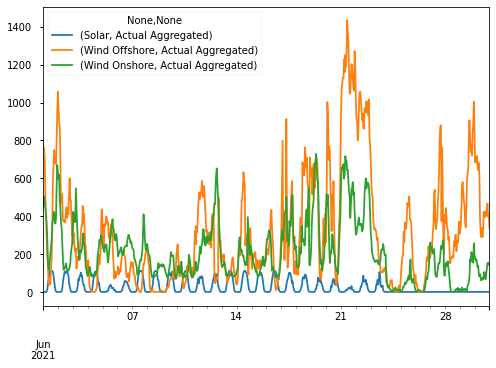

In [270]:
netherlands_df.plot()

### Solar Modeling

<AxesSubplot:>

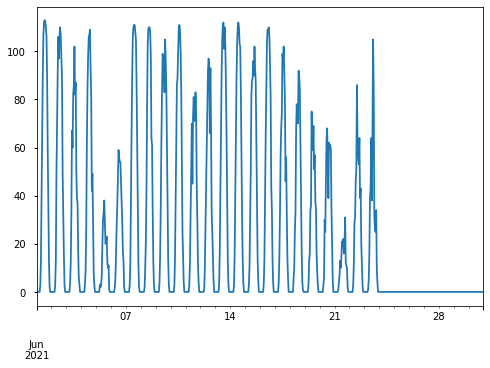

In [271]:
solar_ts = netherlands_df['Solar']['Actual Aggregated']
solar_ts.plot()

In [272]:
train, test = train_test_split(solar_ts)

576

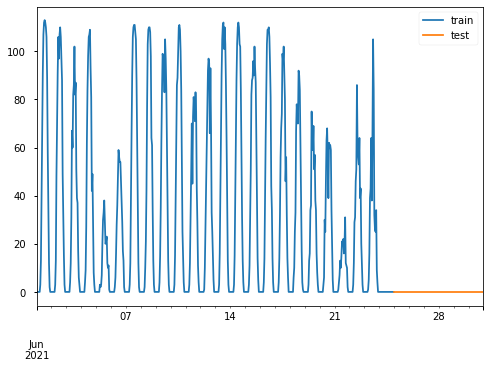

In [273]:
plot_train_test_split(train, test);

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-2.0340,19,556,0.2719,False,False


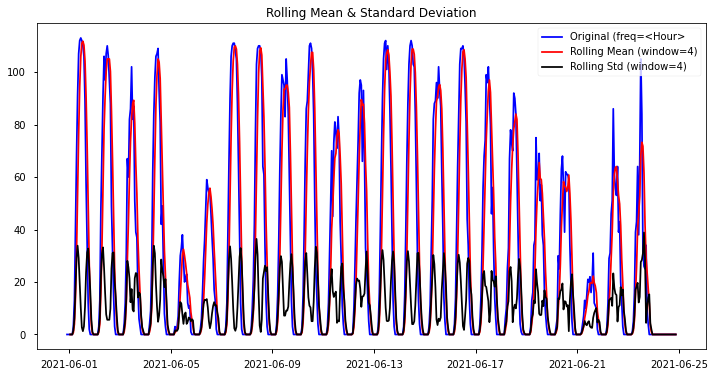

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-2.0340,19,556,0.2719,False,False


In [274]:
#Check time series for stationarity
stationarity_check(train)

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-16.6461,19,555,0.0000,True,True


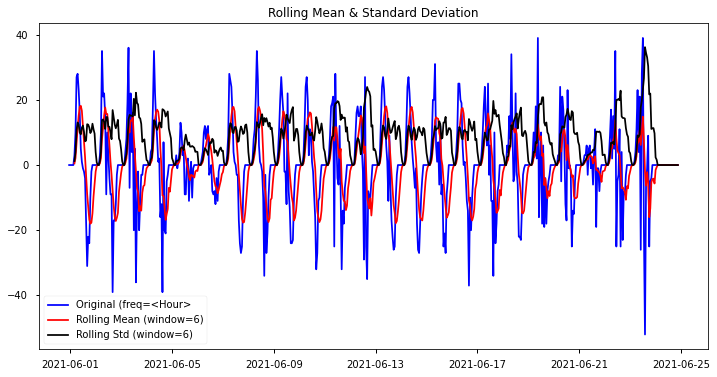

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-16.6461,19,555,0.0000,True,True


In [275]:
#Check if differencing time series will result in stationarity
stationarity_check(train.diff().dropna(), window=6)

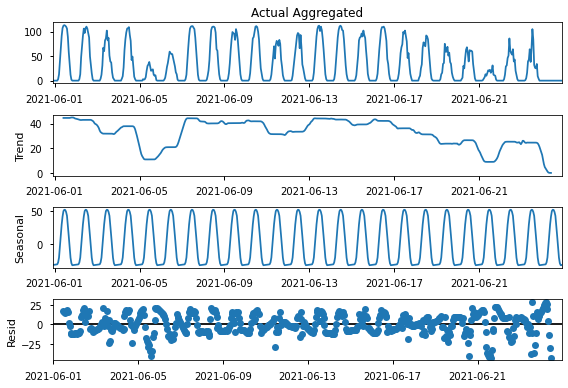

In [276]:
#Create seasonal decomposition of time series to check for seasonality
decompose = tsa.seasonal_decompose(train)
decompose.plot();

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[4] intercept   : AIC=4579.266, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[4] intercept   : AIC=4419.017, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[4] intercept   : AIC=4466.366, Time=0.13 sec
 ARIMA(0,1,0)(0,0,0)[4]             : AIC=4577.266, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[4] intercept   : AIC=4425.814, Time=0.05 sec
 ARIMA(1,1,0)(2,0,0)[4] intercept   : AIC=4410.421, Time=0.20 sec
 ARIMA(1,1,0)(2,0,1)[4] intercept   : AIC=4405.840, Time=0.34 sec
 ARIMA(1,1,0)(1,0,1)[4] intercept   : AIC=4416.629, Time=0.21 sec
 ARIMA(1,1,0)(2,0,2)[4] intercept   : AIC=inf, Time=1.02 sec
 ARIMA(1,1,0)(1,0,2)[4] intercept   : AIC=4409.516, Time=0.33 sec
 ARIMA(0,1,0)(2,0,1)[4] intercept   : AIC=4466.819, Time=0.26 sec
 ARIMA(2,1,0)(2,0,1)[4] intercept   : AIC=4386.576, Time=0.33 sec
 ARIMA(2,1,0)(1,0,1)[4] intercept   : AIC=4391.307, Time=0.31 sec
 ARIMA(2,1,0)(2,0,0)[4] intercept   : AIC=4387.204, Time=0.28 sec
 ARIMA(2,1,0)(2,0,2)[4] intercept   : 

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                                   y   No. Observations:                  576
Model:             SARIMAX(2, 1, 0)x(2, 0, [1], 4)   Log Likelihood               -2186.288
Date:                             Wed, 21 Jul 2021   AIC                           4384.576
Time:                                     18:23:43   BIC                           4410.702
Sample:                                          0   HQIC                          4394.766
                                             - 576                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3339      0.027     12.273      0.000       0.281       0.387
ar.L2          0.2003      0.031      6.539      0.000       0.140       0.260
ar.S.L4        0.4943      0.335      1.475      0.140      -0.162       1.151
ar.S.L8       -0.1663      0.060     -2.794      0.005      -0.283      -0.050
ma.S.L4       -0.3989      0.340     -1.174      0.241      -1.065       0.267
sigma2       117.4634      5.349     21.960      0.000     106.979     127.947
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):               163.06
Prob(Q):                              0.80   Prob(JB):                         0.00
Heteroskedasticity (H):               1.50   Skew:                            -0.32
Prob(H) (two-sided):                  0.01   Kurtosis:                         5.53
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



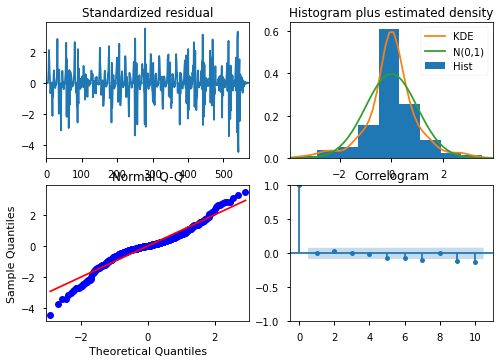

In [277]:
#Create first ARIMA model using auto arima to gridsearch for parameters
model = pmd.auto_arima(train, start_p=0, start_P=0, start_q=0, start_Q=0, m=4, d=1, trace=True)
display(model.summary())
model.plot_diagnostics();

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                   Actual Aggregated   No. Observations:                  576
Model:             SARIMAX(2, 1, 0)x(2, 0, [1], 4)   Log Likelihood               -2186.288
Date:                             Wed, 21 Jul 2021   AIC                           4384.576
Time:                                     18:23:43   BIC                           4410.702
Sample:                                 06-01-2021   HQIC                          4394.766
                                      - 06-24-2021                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3339      0.027     12.273      0.000       0.281       0.387
ar.L2          0.2003      0.031      6.539      0.000       0.140       0.260
ar.S.L4        0.4943      0.335      1.475      0.140      -0.162       1.151
ar.S.L8       -0.1663      0.060     -2.794      0.005      -0.283      -0.050
ma.S.L4       -0.3989      0.340     -1.174      0.241      -1.065       0.267
sigma2       117.4634      5.349     21.960      0.000     106.979     127.947
===================================================================================
Ljung-Box (L1) (Q):                   0.06   Jarque-Bera (JB):               163.06
Prob(Q):                              0.80   Prob(JB):                         0.00
Heteroskedasticity (H):               1.50   Skew:                            -0.32
Prob(H) (two-sided):                  0.01   Kurtosis:                         5.53
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



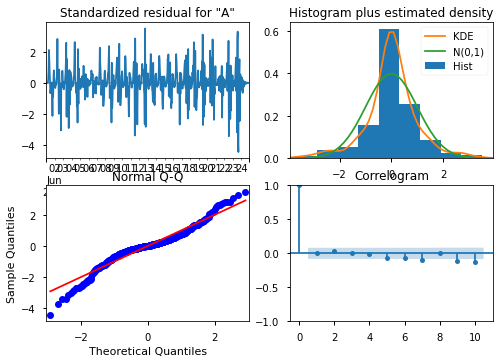

In [278]:
#Create SARIMAX model using determined parameters
sarimax_model = tsa.SARIMAX(train, order=model.order, seasonal_order=model.seasonal_order, enforce_stationarity=True).fit()
display(sarimax_model.summary())
sarimax_model.plot_diagnostics();

In [279]:
forecast_df = retrieve_forecast(sarimax_model, steps=len(test))
forecast_df

,Lower CI,Upper CI,Forecast
2021-06-25 00:00:00+02:00,-21.1753,21.3091,0.0669
2021-06-25 01:00:00+02:00,-35.3426,35.4847,0.0710
2021-06-25 02:00:00+02:00,-49.6921,49.8314,0.0696
2021-06-25 03:00:00+02:00,-62.9038,63.0406,0.0684
2021-06-25 04:00:00+02:00,-76.2405,76.4420,0.1007
...,...,...,...
2021-06-30 19:00:00+02:00,-483.7569,483.9544,0.0987
2021-06-30 20:00:00+02:00,-485.4732,485.6707,0.0987
2021-06-30 21:00:00+02:00,-487.1834,487.3809,0.0987
2021-06-30 22:00:00+02:00,-488.8876,489.0851,0.0987


(<Figure size 720x432 with 1 Axes>, <AxesSubplot:ylabel='Value'>)

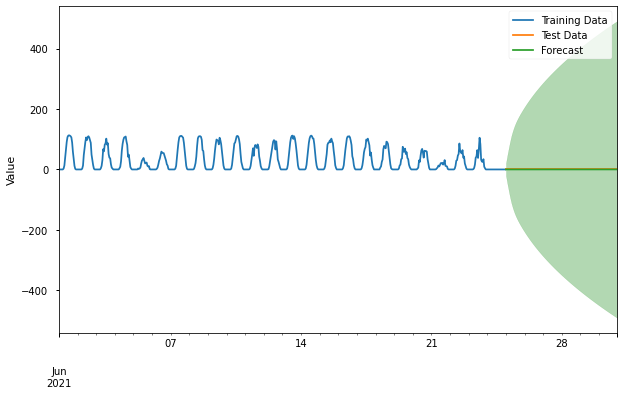

In [280]:
plot_train_test_forecast(train, test, forecast_df)

<class 'statsmodels.iolib.summary.Summary'>
"""
                                      SARIMAX Results                                      
===========================================================================================
Dep. Variable:                   Actual Aggregated   No. Observations:                  720
Model:             SARIMAX(2, 1, 0)x(2, 0, [1], 4)   Log Likelihood               -2653.401
Date:                             Wed, 21 Jul 2021   AIC                           5318.803
Time:                                     18:23:44   BIC                           5346.270
Sample:                                 06-01-2021   HQIC                          5329.407
                                      - 06-30-2021                                         
Covariance Type:                               opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3339      0.022     15.383      0.000       0.291       0.376
ar.L2          0.2004      0.024      8.192      0.000       0.152       0.248
ar.S.L4        0.4941      0.267      1.848      0.065      -0.030       1.018
ar.S.L8       -0.1668      0.047     -3.521      0.000      -0.260      -0.074
ma.S.L4       -0.3986      0.271     -1.470      0.142      -0.930       0.133
sigma2        93.8994      3.321     28.277      0.000      87.391     100.408
===================================================================================
Ljung-Box (L1) (Q):                   0.08   Jarque-Bera (JB):               473.75
Prob(Q):                              0.78   Prob(JB):                         0.00
Heteroskedasticity (H):               0.64   Skew:                            -0.36
Prob(H) (two-sided):                  0.00   Kurtosis:                         6.91
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



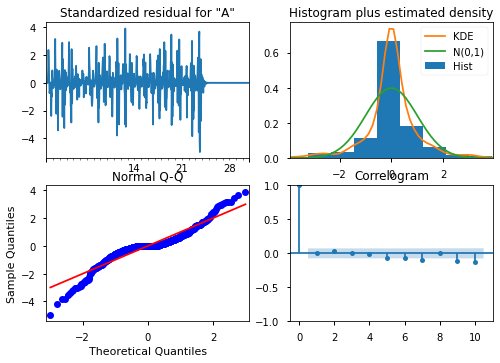

In [281]:
#Create and train SARIMAX model on the full time series
sarimax_model_full = tsa.SARIMAX(solar_ts, order=model.order,seasonal_order=model.seasonal_order,
                            enforce_stationarity=True).fit()
display(sarimax_model_full.summary())
sarimax_model_full.plot_diagnostics();

In [282]:
#Retrieve forecast for the next three days
forecast_df = retrieve_forecast(sarimax_model_full, steps=72)
forecast_df

,Lower CI,Upper CI,Forecast
2021-07-01 00:00:00+02:00,-18.9924,18.9924,0.0000
2021-07-01 01:00:00+02:00,-31.6628,31.6628,0.0000
2021-07-01 02:00:00+02:00,-44.4921,44.4921,0.0000
2021-07-01 03:00:00+02:00,-56.3043,56.3043,0.0000
2021-07-01 04:00:00+02:00,-68.2606,68.2606,0.0000
...,...,...,...
2021-07-06 19:00:00+02:00,-432.5466,432.5466,0.0000
2021-07-06 20:00:00+02:00,-434.0808,434.0808,0.0000
2021-07-06 21:00:00+02:00,-435.6096,435.6096,0.0000
2021-07-06 22:00:00+02:00,-437.1330,437.1330,0.0000


Figure save as images/Actual Aggregated_forecast.png


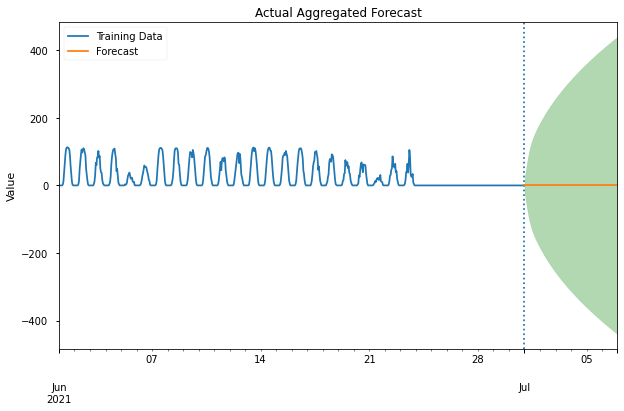

In [283]:
fig, ax = plot_time_series_forecast(solar_ts, forecast_df)

### Sktime

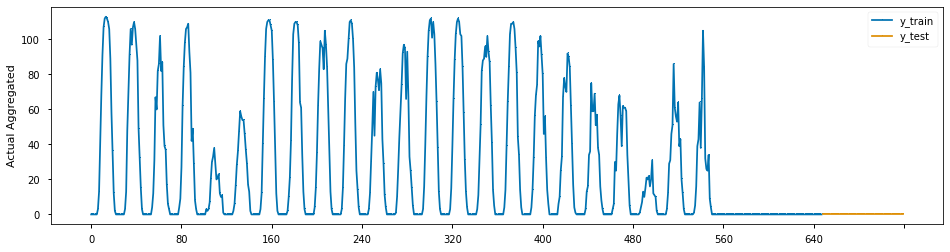

In [284]:
y = solar_ts.reset_index(drop=True)

y_train, y_test = temporal_train_test_split(y, test_size=72)
forecast_horizon = np.arange(y_test.shape[0]) + 1

plot_series(y_train, y_test, labels=["y_train", "y_test"], markers=[",", ","])
plt.show()

0.0

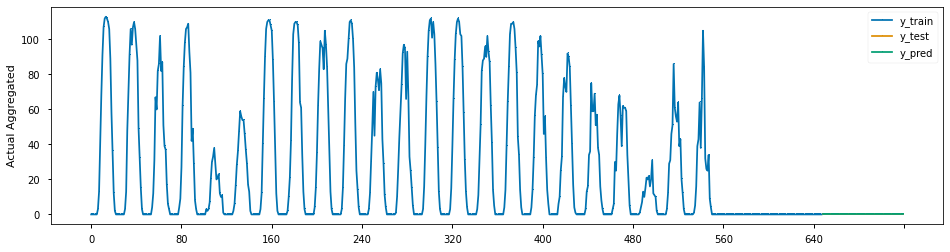

In [285]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

1.4166666666666667

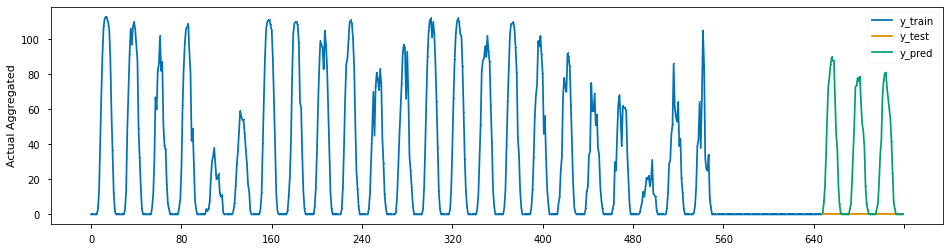

In [286]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
param_grid = {"window_length": [1, 5, 7]}

cv = SlidingWindowSplitter()
gscv = ForecastingGridSearchCV(forecaster, cv=cv, param_grid=param_grid)
gscv.fit(y_train, fh=forecast_horizon)
y_pred = gscv.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

In [287]:
gscv.best_params_

{'window_length': 7}

(<Figure size 1152x288 with 1 Axes>, <AxesSubplot:ylabel='Actual Aggregated'>)

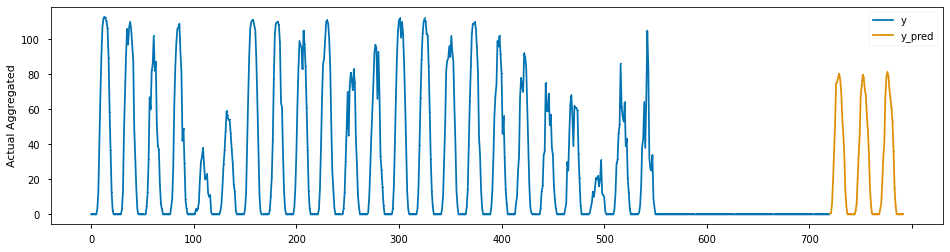

In [288]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator, window_length=7)
forecaster.fit(y, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y, y_pred, labels=["y", "y_pred"], markers=[",", ","])

### Onshore Wind Modeling

<AxesSubplot:>

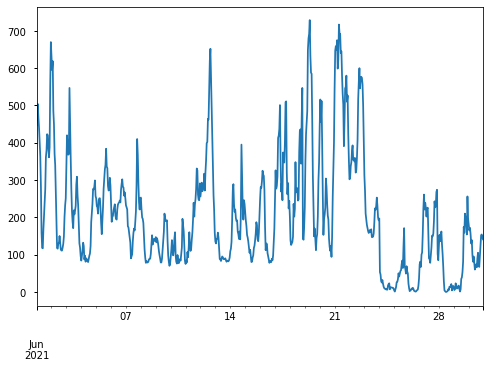

In [289]:
onshore_wind_ts = netherlands_df['Wind Onshore']['Actual Aggregated']
onshore_wind_ts.plot()

In [290]:
train, test = train_test_split(onshore_wind_ts)

576

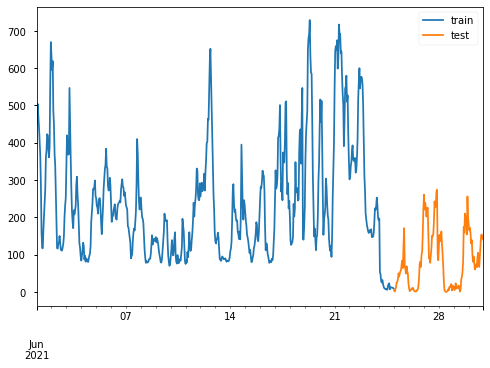

In [291]:
plot_train_test_split(train, test);

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-5.8142,3,572,0.0000,True,True


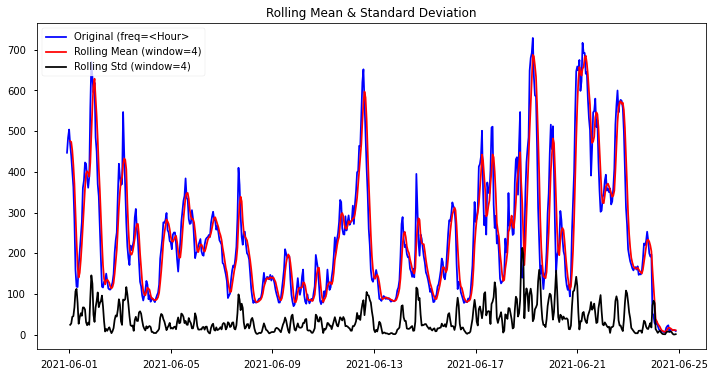

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-5.8142,3,572,0.0000,True,True


In [292]:
#Check time series for stationarity
stationarity_check(train)

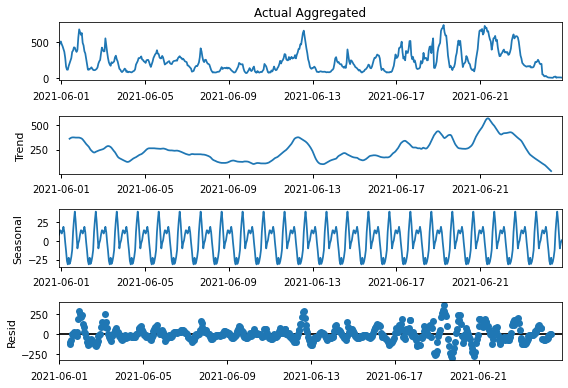

In [293]:
#Create seasonal decomposition of time series to check for seasonality
decompose = tsa.seasonal_decompose(train)
decompose.plot();

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=6106.666, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=6065.813, Time=0.11 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=6065.138, Time=0.18 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=6104.806, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[7] intercept   : AIC=6063.830, Time=0.08 sec
 ARIMA(0,1,1)(1,0,0)[7] intercept   : AIC=6065.231, Time=0.18 sec
 ARIMA(0,1,1)(1,0,1)[7] intercept   : AIC=6065.034, Time=0.49 sec
 ARIMA(1,1,1)(0,0,0)[7] intercept   : AIC=6065.650, Time=0.11 sec
 ARIMA(0,1,2)(0,0,0)[7] intercept   : AIC=6065.767, Time=0.12 sec
 ARIMA(1,1,0)(0,0,0)[7] intercept   : AIC=6064.149, Time=0.03 sec
 ARIMA(1,1,2)(0,0,0)[7] intercept   : AIC=6066.808, Time=0.11 sec
 ARIMA(0,1,1)(0,0,0)[7]             : AIC=6061.918, Time=0.04 sec
 ARIMA(0,1,1)(1,0,0)[7]             : AIC=6063.324, Time=0.09 sec
 ARIMA(0,1,1)(0,0,1)[7]             : AIC=6063.232, Time=0.08 sec
 ARIMA(0,1,1)(1,0,1)[7]          

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  576
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -3028.959
Date:                Wed, 21 Jul 2021   AIC                           6061.918
Time:                        18:35:00   BIC                           6070.627
Sample:                             0   HQIC                          6065.315
                                - 576                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.2818      0.027     10.510      0.000       0.229       0.334
sigma2      2202.8042     48.965     44.987      0.000    2106.834    2298.774
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):              3593.82
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               2.78   Skew:                            -1.16
Prob(H) (two-sided):                  0.00   Kurtosis:                        15.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



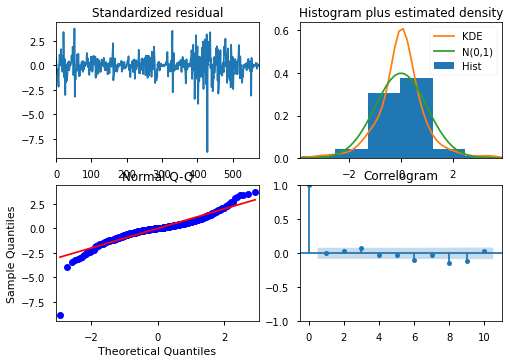

In [294]:
#Create first ARIMA model using auto arima to gridsearch for parameters
model = pmd.auto_arima(train, start_p=0, start_P=0, start_q=0, start_Q=0, m=7, trace=True)
display(model.summary())
model.plot_diagnostics();

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:      Actual Aggregated   No. Observations:                  576
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -3028.959
Date:                Wed, 21 Jul 2021   AIC                           6061.918
Time:                        18:35:01   BIC                           6070.627
Sample:                    06-01-2021   HQIC                          6065.315
                         - 06-24-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.2818      0.027     10.510      0.000       0.229       0.334
sigma2      2202.8042     48.965     44.987      0.000    2106.834    2298.774
===================================================================================
Ljung-Box (L1) (Q):                   0.01   Jarque-Bera (JB):              3593.82
Prob(Q):                              0.94   Prob(JB):                         0.00
Heteroskedasticity (H):               2.78   Skew:                            -1.16
Prob(H) (two-sided):                  0.00   Kurtosis:                        15.03
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



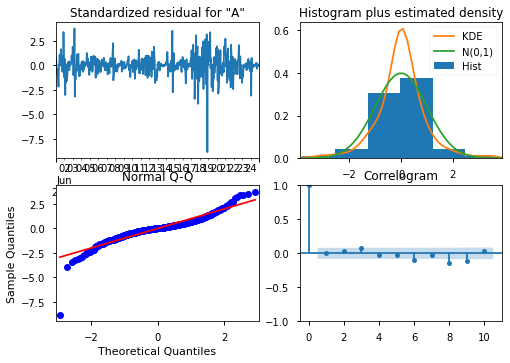

In [295]:
#Create SARIMAX model using determined parameters
sarimax_model = tsa.SARIMAX(train, order=model.order, seasonal_order=model.seasonal_order, enforce_stationarity=True).fit()
display(sarimax_model.summary())
sarimax_model.plot_diagnostics();

In [296]:
forecast_df = retrieve_forecast(sarimax_model, steps=len(test))
forecast_df

,Lower CI,Upper CI,Forecast
2021-06-25 00:00:00+02:00,-83.5799,100.3981,8.4091
2021-06-25 01:00:00+02:00,-141.1435,157.9617,8.4091
2021-06-25 02:00:00+02:00,-182.0377,198.8559,8.4091
2021-06-25 03:00:00+02:00,-215.5864,232.4046,8.4091
2021-06-25 04:00:00+02:00,-244.7272,261.5454,8.4091
...,...,...,...
2021-06-30 19:00:00+02:00,-1384.8311,1401.6493,8.4091
2021-06-30 20:00:00+02:00,-1389.8120,1406.6302,8.4091
2021-06-30 21:00:00+02:00,-1394.7752,1411.5934,8.4091
2021-06-30 22:00:00+02:00,-1399.7210,1416.5391,8.4091


(<Figure size 720x432 with 1 Axes>, <AxesSubplot:ylabel='Value'>)

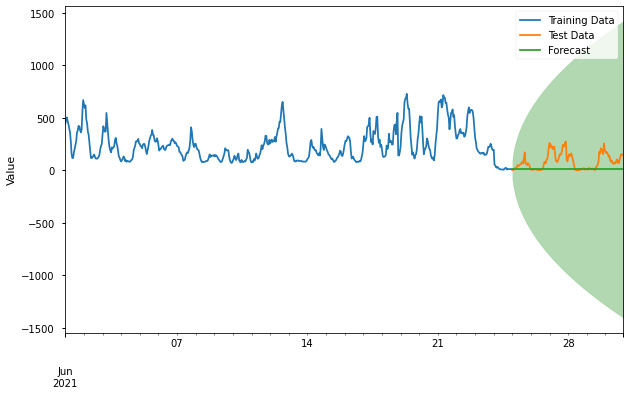

In [297]:
plot_train_test_forecast(train, test, forecast_df)

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:      Actual Aggregated   No. Observations:                  720
Model:               SARIMAX(0, 1, 1)   Log Likelihood               -3742.470
Date:                Wed, 21 Jul 2021   AIC                           7488.940
Time:                        18:35:02   BIC                           7498.096
Sample:                    06-01-2021   HQIC                          7492.475
                         - 06-30-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ma.L1          0.2654      0.024     11.165      0.000       0.219       0.312
sigma2      1943.4465     37.449     51.895      0.000    1870.047    2016.846
===================================================================================
Ljung-Box (L1) (Q):                   0.00   Jarque-Bera (JB):              5203.93
Prob(Q):                              0.96   Prob(JB):                         0.00
Heteroskedasticity (H):               0.97   Skew:                            -1.20
Prob(H) (two-sided):                  0.84   Kurtosis:                        15.96
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



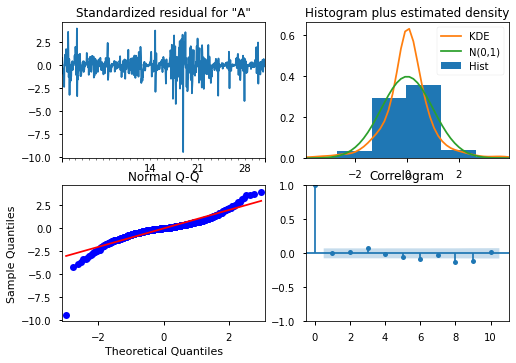

In [298]:
#Create and train SARIMAX model on the full time series
sarimax_model_full = tsa.SARIMAX(onshore_wind_ts, order=model.order,seasonal_order=model.seasonal_order,
                            enforce_stationarity=True).fit()
display(sarimax_model_full.summary())
sarimax_model_full.plot_diagnostics();

In [299]:
#Retrieve forecast for the next three days
forecast_df = retrieve_forecast(sarimax_model_full, steps=72)
forecast_df

,Lower CI,Upper CI,Forecast
2021-07-01 00:00:00+02:00,53.0778,225.8860,139.4819
2021-07-01 01:00:00+02:00,0.1250,278.8388,139.4819
2021-07-01 02:00:00+02:00,-37.6480,316.6119,139.4819
2021-07-01 03:00:00+02:00,-68.6759,347.6398,139.4819
2021-07-01 04:00:00+02:00,-95.6444,374.6082,139.4819
...,...,...,...
2021-07-06 19:00:00+02:00,-1152.4800,1431.4438,139.4819
2021-07-06 20:00:00+02:00,-1157.0983,1436.0621,139.4819
2021-07-06 21:00:00+02:00,-1161.7002,1440.6640,139.4819
2021-07-06 22:00:00+02:00,-1166.2859,1445.2497,139.4819


Figure save as images/Actual Aggregated_forecast.png


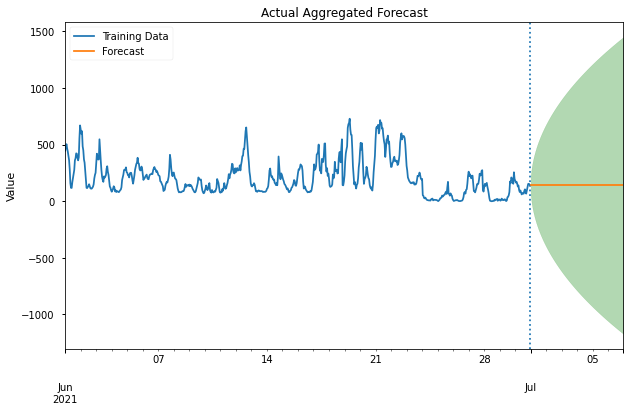

In [300]:
fig, ax = plot_time_series_forecast(onshore_wind_ts, forecast_df)

### Sktime

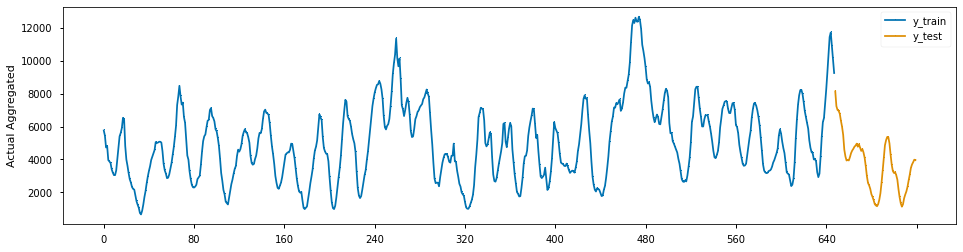

In [301]:
y = wind_ts.reset_index(drop=True)

y_train, y_test = temporal_train_test_split(y, test_size=72)
forecast_horizon = np.arange(y_test.shape[0]) + 1

plot_series(y_train, y_test, labels=["y_train", "y_test"], markers=[",", ","])
plt.show()

0.6741291804983468

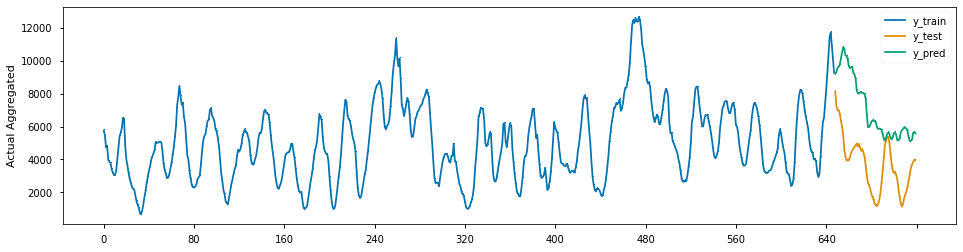

In [302]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

0.6071025694661853

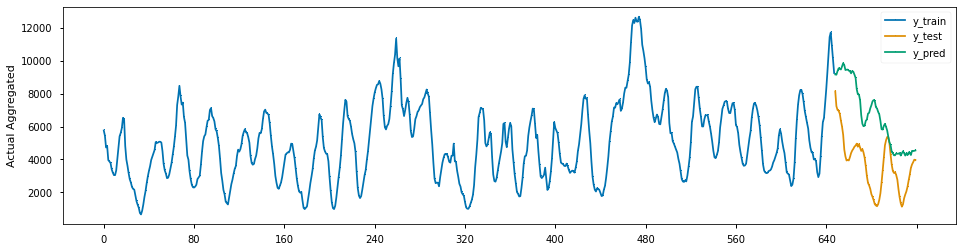

In [303]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
param_grid = {"window_length": [1, 5, 7]}

cv = SlidingWindowSplitter()
gscv = ForecastingGridSearchCV(forecaster, cv=cv, param_grid=param_grid)
gscv.fit(y_train, fh=forecast_horizon)
y_pred = gscv.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

In [304]:
gscv.best_params_

{'window_length': 7}

0.4159069765915308

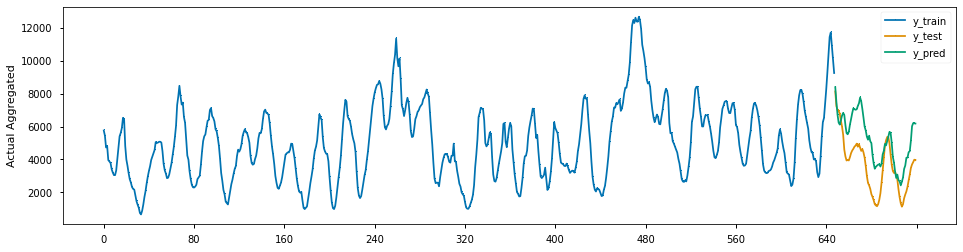

In [305]:
estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

fig, ax = plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

0.5196579127603842

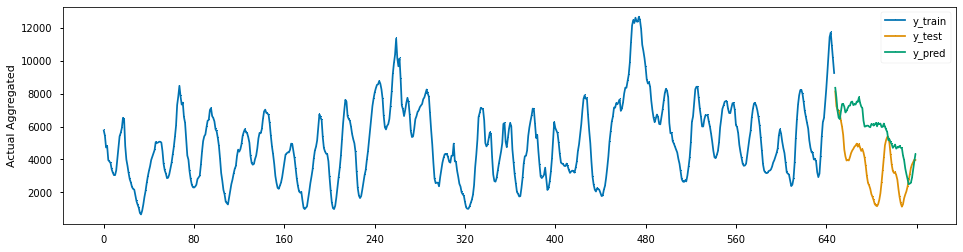

In [308]:
estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
param_grid = {"window_length": [1, 5, 7]}

cv = SlidingWindowSplitter()
gscv = ForecastingGridSearchCV(forecaster, cv=cv, param_grid=param_grid)
gscv.fit(y_train, fh=forecast_horizon)
y_pred = gscv.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

In [309]:
gscv.best_params_

{'window_length': 7}

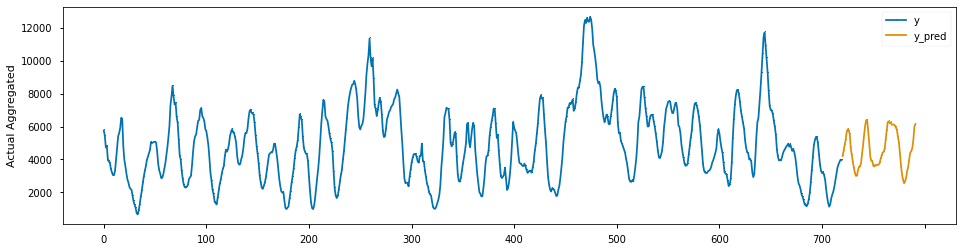

In [310]:
estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

fig, ax = plot_series(y, y_pred, labels=["y", "y_pred"], markers=[",", ","])

### Offshore Wind Modeling

<AxesSubplot:>

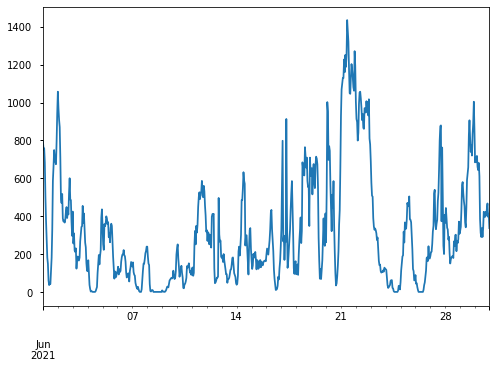

In [311]:
offshore_wind_ts = netherlands_df['Wind Offshore']['Actual Aggregated']
offshore_wind_ts.plot()

In [312]:
train, test = train_test_split(offshore_wind_ts)

576

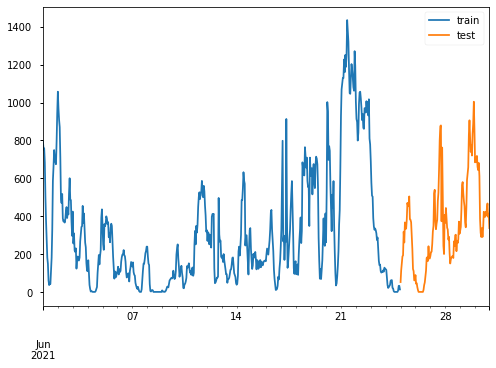

In [313]:
plot_train_test_split(train, test);

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-3.6645,0,575,0.0046,True,True


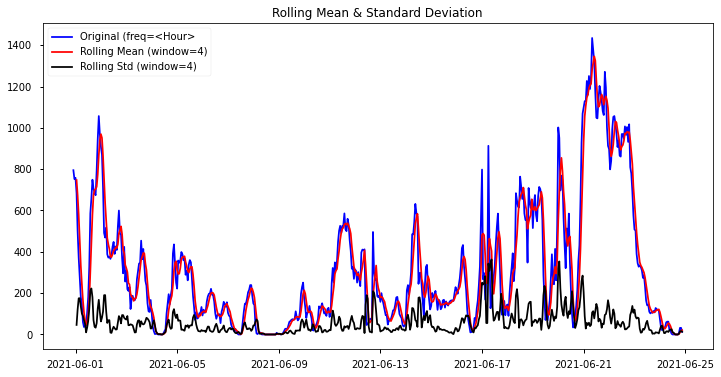

,Test Statistic,#Lags Used,# of Observations Used,p-value,p<.05,Stationary?
AD Fuller Results,-3.6645,0,575,0.0046,True,True


In [314]:
#Check time series for stationarity
stationarity_check(train)

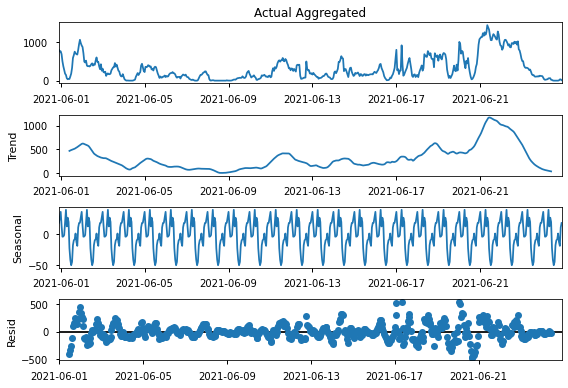

In [315]:
#Create seasonal decomposition of time series to check for seasonality
decompose = tsa.seasonal_decompose(train)
decompose.plot();

Performing stepwise search to minimize aic
 ARIMA(0,1,0)(0,0,0)[7] intercept   : AIC=6814.712, Time=0.01 sec
 ARIMA(1,1,0)(1,0,0)[7] intercept   : AIC=6817.205, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[7] intercept   : AIC=6817.171, Time=0.08 sec
 ARIMA(0,1,0)(0,0,0)[7]             : AIC=6812.842, Time=0.01 sec
 ARIMA(0,1,0)(1,0,0)[7] intercept   : AIC=6816.681, Time=0.05 sec
 ARIMA(0,1,0)(0,0,1)[7] intercept   : AIC=6816.671, Time=0.05 sec
 ARIMA(0,1,0)(1,0,1)[7] intercept   : AIC=6813.017, Time=0.47 sec
 ARIMA(1,1,0)(0,0,0)[7] intercept   : AIC=6815.230, Time=0.02 sec
 ARIMA(0,1,1)(0,0,0)[7] intercept   : AIC=6815.202, Time=0.03 sec
 ARIMA(1,1,1)(0,0,0)[7] intercept   : AIC=6817.136, Time=0.03 sec

Best model:  ARIMA(0,1,0)(0,0,0)[7]          
Total fit time: 0.822 seconds


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  576
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -3405.421
Date:                Wed, 21 Jul 2021   AIC                           6812.842
Time:                        18:55:39   BIC                           6817.197
Sample:                             0   HQIC                          6814.541
                                - 576                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      8160.5486    189.497     43.064      0.000    7789.140    8531.957
===================================================================================
Ljung-Box (L1) (Q):                   1.49   Jarque-Bera (JB):              2892.62
Prob(Q):                              0.22   Prob(JB):                         0.00
Heteroskedasticity (H):               4.36   Skew:                             0.53
Prob(H) (two-sided):                  0.00   Kurtosis:                        13.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



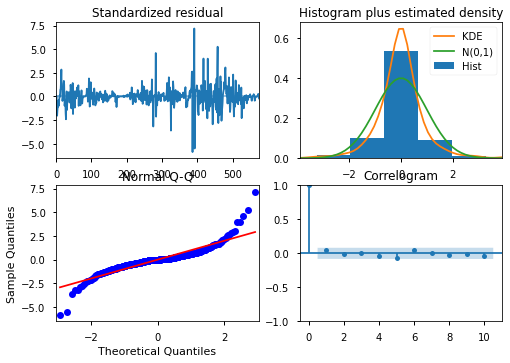

In [316]:
#Create first ARIMA model using auto arima to gridsearch for parameters
model = pmd.auto_arima(train, start_p=0, start_P=0, start_q=0, start_Q=0, m=7, trace=True)
display(model.summary())
model.plot_diagnostics();

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:      Actual Aggregated   No. Observations:                  576
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -3405.421
Date:                Wed, 21 Jul 2021   AIC                           6812.842
Time:                        18:55:39   BIC                           6817.197
Sample:                    06-01-2021   HQIC                          6814.541
                         - 06-24-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      8160.5486    189.497     43.064      0.000    7789.140    8531.957
===================================================================================
Ljung-Box (L1) (Q):                   1.49   Jarque-Bera (JB):              2892.62
Prob(Q):                              0.22   Prob(JB):                         0.00
Heteroskedasticity (H):               4.36   Skew:                             0.53
Prob(H) (two-sided):                  0.00   Kurtosis:                        13.94
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



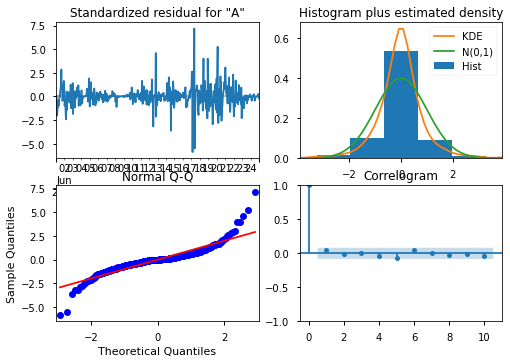

In [317]:
#Create SARIMAX model using determined parameters
sarimax_model = tsa.SARIMAX(train, order=model.order, seasonal_order=model.seasonal_order, enforce_stationarity=True).fit()
display(sarimax_model.summary())
sarimax_model.plot_diagnostics();

In [318]:
forecast_df = retrieve_forecast(sarimax_model, steps=len(test))
forecast_df

,Lower CI,Upper CI,Forecast
2021-06-25 00:00:00+02:00,-164.0548,190.0548,13.0000
2021-06-25 01:00:00+02:00,-237.3933,263.3933,13.0000
2021-06-25 02:00:00+02:00,-293.6680,319.6680,13.0000
2021-06-25 03:00:00+02:00,-341.1097,367.1097,13.0000
2021-06-25 04:00:00+02:00,-382.9066,408.9066,13.0000
...,...,...,...
2021-06-30 19:00:00+02:00,-2081.9410,2107.9410,13.0000
2021-06-30 20:00:00+02:00,-2089.4096,2115.4096,13.0000
2021-06-30 21:00:00+02:00,-2096.8518,2122.8518,13.0000
2021-06-30 22:00:00+02:00,-2104.2678,2130.2678,13.0000


(<Figure size 720x432 with 1 Axes>, <AxesSubplot:ylabel='Value'>)

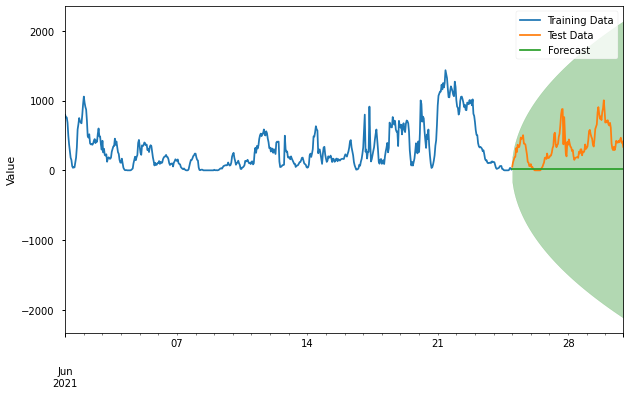

In [319]:
plot_train_test_forecast(train, test, forecast_df)

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:      Actual Aggregated   No. Observations:                  720
Model:               SARIMAX(0, 1, 0)   Log Likelihood               -4259.227
Date:                Wed, 21 Jul 2021   AIC                           8520.455
Time:                        18:55:40   BIC                           8525.032
Sample:                    06-01-2021   HQIC                          8522.222
                         - 06-30-2021                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      8182.5999    173.778     47.086      0.000    7842.001    8523.199
===================================================================================
Ljung-Box (L1) (Q):                   0.34   Jarque-Bera (JB):              3210.23
Prob(Q):                              0.56   Prob(JB):                         0.00
Heteroskedasticity (H):               2.23   Skew:                             0.22
Prob(H) (two-sided):                  0.00   Kurtosis:                        13.34
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

C:\Users\norrp\anaconda3\envs\learn-env\lib\site-packages\statsmodels\graphics\gofplots.py:993: UserWarning:

marker is redundantly defined by the 'marker' keyword argument and the fmt string "bo" (-> marker='o'). The keyword argument will take precedence.



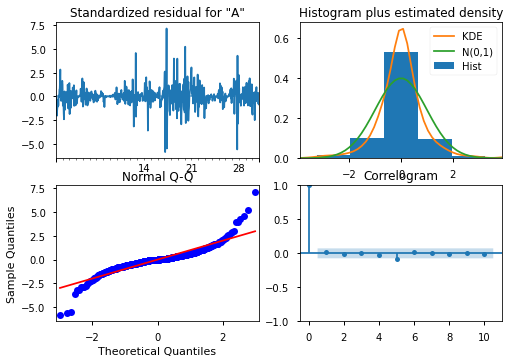

In [320]:
#Create and train SARIMAX model on the full time series
sarimax_model_full = tsa.SARIMAX(offshore_wind_ts, order=model.order,seasonal_order=model.seasonal_order,
                            enforce_stationarity=True).fit()
display(sarimax_model_full.summary())
sarimax_model_full.plot_diagnostics();

In [321]:
#Retrieve forecast for the next three days
forecast_df = retrieve_forecast(sarimax_model_full, steps=72)
forecast_df

,Lower CI,Upper CI,Forecast
2021-07-01 00:00:00+02:00,159.7061,514.2939,337.0000
2021-07-01 01:00:00+02:00,86.2686,587.7314,337.0000
2021-07-01 02:00:00+02:00,29.9180,644.0820,337.0000
2021-07-01 03:00:00+02:00,-17.5878,691.5878,337.0000
2021-07-01 04:00:00+02:00,-59.4412,733.4412,337.0000
...,...,...,...
2021-07-06 19:00:00+02:00,-1760.7695,2434.7695,337.0000
2021-07-06 20:00:00+02:00,-1768.2482,2442.2482,337.0000
2021-07-06 21:00:00+02:00,-1775.7004,2449.7004,337.0000
2021-07-06 22:00:00+02:00,-1783.1265,2457.1265,337.0000


Figure save as images/Actual Aggregated_forecast.png


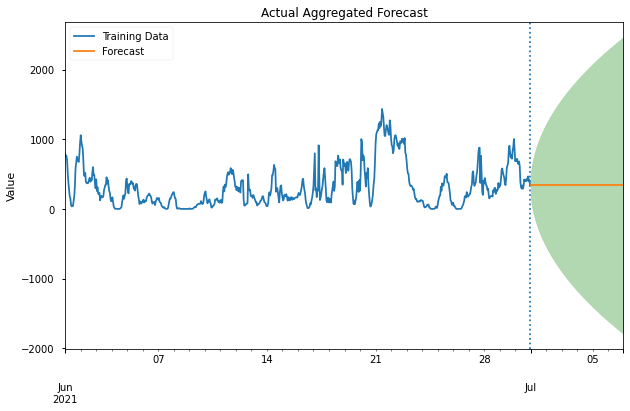

In [322]:
fig, ax = plot_time_series_forecast(offshore_wind_ts, forecast_df)

### Sktime

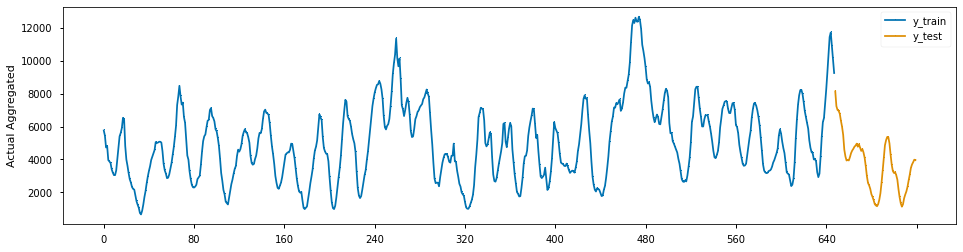

In [323]:
y = wind_ts.reset_index(drop=True)

y_train, y_test = temporal_train_test_split(y, test_size=72)
forecast_horizon = np.arange(y_test.shape[0]) + 1

plot_series(y_train, y_test, labels=["y_train", "y_test"], markers=[",", ","])
plt.show()

0.6340937773228306

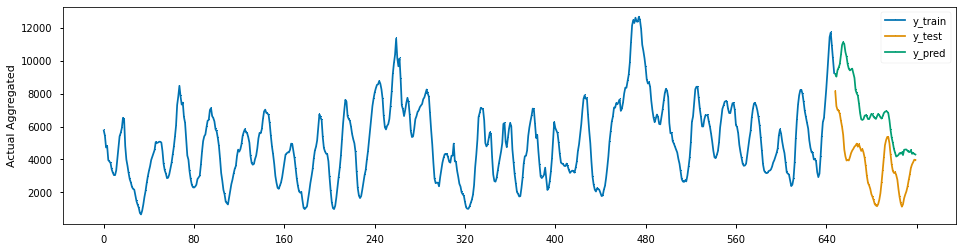

In [324]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

0.6664549389518096

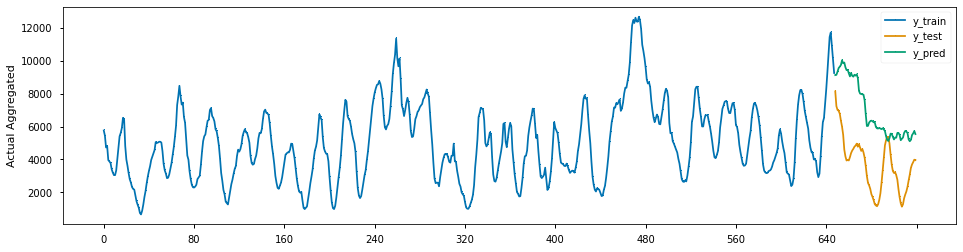

In [325]:
estimator = RandomForestRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
param_grid = {"window_length": [1, 5, 7]}

cv = SlidingWindowSplitter()
gscv = ForecastingGridSearchCV(forecaster, cv=cv, param_grid=param_grid)
gscv.fit(y_train, fh=forecast_horizon)
y_pred = gscv.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

In [326]:
gscv.best_params_

{'window_length': 7}

0.4159069765915308

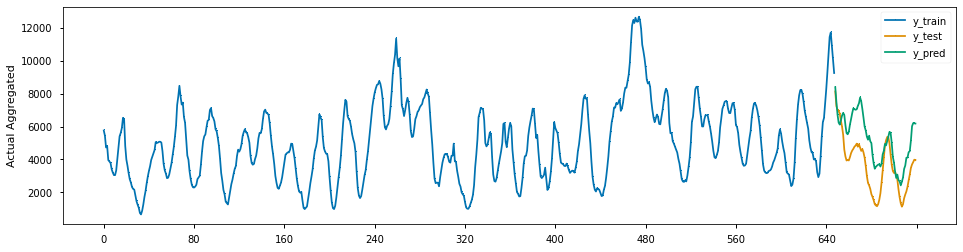

In [327]:
estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y_train, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

fig, ax = plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

0.5196579127603842

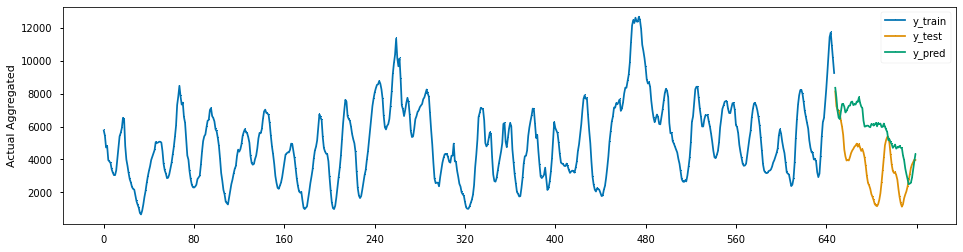

In [329]:
estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
param_grid = {"window_length": [1, 5, 7]}

cv = SlidingWindowSplitter()
gscv = ForecastingGridSearchCV(forecaster, cv=cv, param_grid=param_grid)
gscv.fit(y_train, fh=forecast_horizon)
y_pred = gscv.predict(forecast_horizon)

plot_series(y_train, y_test, y_pred, labels=["y_train", "y_test", "y_pred"], markers=[",", ",", ","])
smape = mean_absolute_percentage_error(y_test, y_pred)
smape

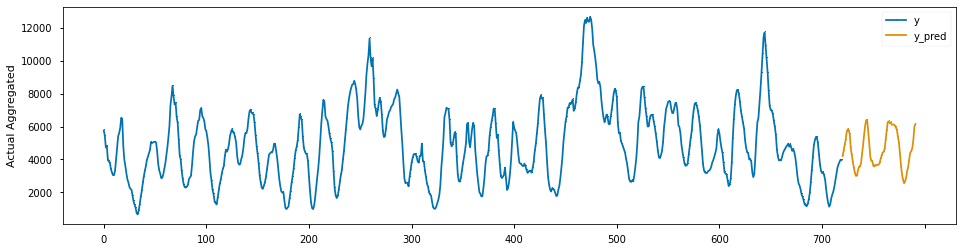

In [330]:
estimator = XGBRegressor()
forecaster = DirRecTabularRegressionForecaster(estimator=estimator)
forecaster.fit(y, fh=forecast_horizon)
y_pred = forecaster.predict(forecast_horizon)

fig, ax = plot_series(y, y_pred, labels=["y", "y_pred"], markers=[",", ","])

# iNTERPRET

Evaluate how well your work solves the stated business problem.

***
Questions to consider:
* How do you interpret the results?
* How well does your model fit your data? How much better is this than your baseline model?
* How confident are you that your results would generalize beyond the data you have?
* How confident are you that this model would benefit the business if put into use?
***

# CONCLUSIONS & RECOMMENDATIONS

Provide your conclusions about the work you've done, including any limitations or next steps.

***
Questions to consider:
* What would you recommend the business do as a result of this work?
* What are some reasons why your analysis might not fully solve the business problem?
* What else could you do in the future to improve this project?
***